In [1]:
### RUN EVERY TIME: ECONOMIC INDICES RELEASES HISTORY EXTRACTING

In [2]:
### RUN EVERY TIME: INITIALIZATION

import pandas as pd
import numpy as np
from datetime import date, datetime
from math import floor, ceil
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from pandas.plotting import register_matplotlib_converters # Plotting
register_matplotlib_converters() # Plotting
import seaborn as sns
import gc

#%load_ext line_profiler

In [3]:
### VERSION CONTROL

from platform import python_version
print('pandas version: ', pd.__version__)
print('python version: ', python_version())

pandas version:  0.25.3
python version:  3.7.4


In [4]:
### RUN EVERY TIME: GENERAL DATA PREPARATION

### Constants:
All = slice(None)
list_na_excel_values = ['', '#N/A', '#N/A N/A', '#NA', '-1.#IND', '-1.#QNAN', '-NaN', '-nan', '1.#IND', '1.#QNAN', 'N/A', 'NULL', 'NaN', 'n/a', 'nan', 'null',
                        '#N/A Requesting Data...', '#N/A Invalid Security', '#N/A Field Not Applicable']
### Raw data path and sheets:
str_path_bb_idx_source = 'Data_Files/Source_Files/Bloomberg_Eco_Indices.xlsx'
str_all_sheet = 'All Eco Const'
### Flags data path and sheets:
str_path_bb_idx_flags = 'Data_Files/Source_Files/Bloomberg_Eco_Flags_Extended.xlsx'
str_flag_sheet = 'Bloomberg Description'
### Global index diagonals collection:
str_path_bb_diag_hdf = 'Data_Files/Source_Files/Diag_Eco_Indices.h5'
str_key_diag_agg_z_lim = 'aggregated_diagonal_z_limited'
### PC FPC weights collection:
str_path_fpc_hdf = 'Data_Files/Source_Files/FPC_Weights.h5'
str_weights_key = 'global_diagonal_full_yoy' # 'global_diagonal_full_mom' # 
### Source data constants:
int_idx_cols = 12
### HDF file with converted source data:
str_path_bb_fcast_hdf = 'Data_Files/Source_Files/Bloomberg_Forecasts_std.h5' ### LINE TO ADD
str_key_flags = 'flags_exported' ### LINE TO ADD
str_key_exported = 'all_idx_exported' ### LINE TO ADD
str_key_raw_filled = 'all_idx_raw_filled' ### LINE TO ADD
str_key_cleared = 'all_idx_cleared' ### LINE TO ADD
str_key_weighted = 'all_idx_weighted' ### LINE TO ADD
str_key_announce = 'announce_factor' ### LINE TO ADD
str_key_announce_simple = 'announce_simple' ### LINE TO ADD
str_key_disagreement = 'disagreement_factor' ### LINE TO ADD
str_key_disagreement_simple = 'disagreement_simple' ### LINE TO ADD
str_key_revision = 'revision_factor' ### LINE TO ADD
str_key_revision_simple = 'revision_simple' ### LINE TO ADD
str_key_total_surprise = 'total_factor' ### LINE TO ADD
str_key_total_surprise_simple = 'total_simple' ### LINE TO ADD
str_key_signs = 'all_signs' ### LINE TO ADD
### Observation axis range:
datetime_start = datetime(1984, 12, 31) # Start date for efficacy measures
date_start = datetime_start.date()
datetime_end = datetime(2020, 8, 31) # End date for efficacy measures
date_end = datetime_end.date()
idx_date_range = pd.date_range(date_start, date_end, freq = 'B')
### Gaps filling options:
int_revision_shift = 1
int_final_shift = 2
int_first_mean_length = 12
dict_final_only_lag = {}
dict_final_only_lag['Quarterly'] = 90 // 2
dict_final_only_lag['Monthly'] = 30 // 2
dict_final_only_lag['Other'] = 7 // 2
### Z-scoring options:
flo_winsorize_tolerance = 0.0001
### Tickers to limited replace NaN revision values with release values:
idx_to_fill_empty_revision = ['ADP CHNG Index', 'ATIPIMM Index', 'BEUER Index', 'CONCCONF Index', 'CPTICHNG Index', 'DGNOCHNG Index', 'DGNOXTCH Index', 
                              'ECO1GFKC Index', 'EUBCI Index', 'EUCPTSAM Index', 'EUESEMU Index', 'EUICEMU Index', 'EUITEMUM Index', 'EUPPEMUM Index', 
                              'EUSCEMU Index', 'FIIPSAIM Index', 'FPIPMOM Index', 'FRMPMOM Index', 'FRPIMOM Index', 'GKRSNEWY Index', 'GRFRIAMM Index', 
                              'GRIFPBUS Index', 'GRIFPCA Index', 'GRIFPEX Index', 'GRIORTMM Index', 'GRIPIMOM Index', 'GRUECHNG Index', 'IEUERT Index',
                              'IMP1CHNG Index', 'INJCJC Index', 'INJCSP Index', 'INSEPROD Index', 'INSESYNT Index', 'IP CHNG Index', 'ITBCI Index', 'ITORTSAM Index',
                              'ITPRSANM Index', 'ITPSSA Index', 'ITVHYOY Index', 'JNTIAIAM Index', 'JNTIAMOM Index', 'MTIBCHNG Index', 'MWINCHNG Index', 
                              'NEIP20MM Index', 'NFP TCH Index', 'PCE CHNC Index', 'PITLCHNG Index', 'PTIPTOTM Index', 'PTRTIMOM Index', 'RSTAMOM Index', 
                              'RSTAXAG% Index', 'SLIOINMM Index', 'SPIOYOY Index', 'SPROCHNG Index', 'SPRSRGIY Index', 'SVBTSI Index', 'TMNOCHNG Index', 
                              'UKAWMWHO Index', 'UKIPIMOM Index', 'UKMPIMOM Index', 'UKPPIINC Index', 'UKPPIOC Index', 'UKRVAMOM Index', 'UKRVINFM Index',
                              'UKUEMOM Index', 'USMMMNCH Index']
### Regions weights:
dict_region_weight = {}
dict_region_weight['US'] = 0.50
dict_region_weight['Europe'] = 0.25
dict_region_weight['Japan'] = 0.15
dict_region_weight['UK'] = 0.10
### Business year length:
int_bus_year = 260
### NBER Recession periods collection:
str_path_nber_hdf = 'Data_Files/Source_Files/NBER_Chronology.h5'
str_nber_periods_key = 'nber_recession_periods'
### CFNAI data collection:
str_path_cfnai_hdf = 'Data_Files/Source_Files/CFNAI.h5'
str_cfnai_full_key = 'cfnai_all_indices'
### MSCI World Index data collection:
str_path_msci_hdf = 'Data_Files/Source_Files/MSCI_World_Index.h5'
str_msci_world_key = 'msci_world'
str_msci_market_down_key = 'msci_recession_periods'
### Economic Surprise & Survey Disagreement options:
list_smooth = [1, 3, 12] ### LINE TO ADD
list_clip = [-4.0, 4.0] ### LINE TO ADD
int_min_tickers_to_go = 5 ### LINE TO ADD
int_obs_num_win = 1 * int_bus_year ### LINE TO ADD
int_bus_month = 22 ### LINE TO ADD
int_bus_min = 1 ### LINE TO ADD
### Percentiles calculation options:
int_ptile_months_win = 10 * 12 ### LINE TO ADD
int_ptile_months_min = 1 * 12 ### LINE TO ADD
tumbler_to_plus = 0.6 ### LINE TO ADD
tumbler_to_minus = 0.4 ### LINE TO ADD

In [5]:
### DEFINING OBSERVATION DATE VECTOR EXTRACTION

def get_obs_date_vector(str_ticker, str_date, bool_exact_date = False, bool_drop_levels = False):
    ### Vector for exact date:
    if bool_exact_date:
        ser_obs_date = pd.read_hdf(str_path_bb_matrix_hdf, key = str_key_matrix_z, where = 'Index_Name == str_ticker & Observation_Date == str_date')
    ### Vector for nearest date:        
    else:
        ### Loading full ticker series:        
        ser_z_scored = pd.read_hdf(str_path_bb_matrix_hdf, key = str_key_matrix_z, where = 'Index_Name == str_ticker & Observation_Date <= str_date')
        ### Extracting data for max date less or equal to needed date:
        ser_obs_date = ser_z_scored.loc[All, All, [ser_z_scored.index.levels[-1].max()]]
    ### Dropping constant index levels if needed:
    if bool_drop_levels:
        return ser_obs_date.droplevel(['Index_Name', 'Observation_Date'])
    else:
        return ser_obs_date

In [6]:
### DEFINING WEIGHTED AVERAGE FOR DATAFRAME COLUMNS (PART OF THE PRODUCT CODE)

def columns_average(df_series, list_weights = False): 
    ### Single column check
    if (len(df_series.columns) > 1):
        ### Equal weights list creating:
        if isinstance(list_weights, bool):
            list_weights = [1] * len(df_series.columns)
        ### Dataframe of weights initialising:
        df_weights = pd.DataFrame(np.NaN, index = df_series.index, columns = df_series.columns)
        for iter_num, iter_col in enumerate(df_weights.columns):
            df_weights[iter_col] = list_weights[iter_num]
        ### Zeroing weights for NaN values:
        for iter_col in df_weights.columns:
            df_weights.loc[df_series[iter_col].isna(), iter_col] = 0
        ser_mean = (df_series.multiply(df_weights).sum(axis = 1)).div(df_weights.sum(axis = 1))    
        ### Results output:
        del df_series
        del df_weights    
        gc.collect()
    else:
        ser_mean = df_series.squeeze()
        del df_series
        gc.collect()        
    return ser_mean

In [7]:
### RUN TO RE-EXPORT DATA: SOURCE FILE EXPORT

### Reading excel file:
df_all_idx_raw = pd.read_excel(engine = 'openpyxl', io = str_path_bb_idx_source, sheet_name = str_all_sheet, skiprows = [0], index_col = None, header = None, 
                               parse_dates = False, na_values = list_na_excel_values, keep_default_na = False)
### List of dataframes for each eco index initializing:
list_idx_raw = []
### Extracting and converting each eco index data block separately to proper form:
for int_iter_idx_col in range(len(df_all_idx_raw.columns) // int_idx_cols):
    ### Extracting raw data:
    df_iter_idx_raw = df_all_idx_raw.iloc[All, (int_iter_idx_col * int_idx_cols) : ((int_iter_idx_col + 1) * int_idx_cols) - 1]
    ### Assigning colum names:
    df_iter_idx_raw.columns = df_iter_idx_raw.iloc[1]
    df_iter_idx_raw.columns.name = ''    
    ### Dropping empty rows:
    df_iter_idx_raw.dropna(how = 'all', inplace = True)
    ### Extracting eco index name:
    df_iter_idx_raw['Index_Name'] = df_iter_idx_raw.iloc[0, 0]
    ### Dropping identification rows (no longer needed):
    df_iter_idx_raw.drop([0, 1], axis = 0, inplace = True)
    ### Setting multiindex:
    df_iter_idx_raw.set_index(['Date', 'Index_Name'], drop = True, append = False, inplace = True)
    ### ADding dataframe to list:
    list_idx_raw.append(df_iter_idx_raw)
### Exported data aggregating:
df_all_idx_exported = pd.concat(list_idx_raw, axis = 0).swaplevel()
### Exported data saving:
df_all_idx_exported.index.names = ['Index_Name', 'Data_Date']
### Types converting for numerical data:
df_all_idx_exported = df_all_idx_exported.astype({'PX_LAST': 'float',
                                                  'ACTUAL_RELEASE': 'float',
                                                  'FIRST_REVISION': 'float',
                                                  'BN_SURVEY_NUMBER_OBSERVATIONS': 'float',
                                                  'BN_SURVEY_MEDIAN': 'float',
                                                  'BN_SURVEY_AVERAGE': 'float',
                                                  'FORECAST_STANDARD_DEVIATION': 'float'
                                                 })
### Zero dates dropping:
df_all_idx_exported.loc[df_all_idx_exported['ECO_RELEASE_DT'] == 0, ['ECO_RELEASE_DT']] = np.NaN
df_all_idx_exported.loc[df_all_idx_exported['FIRST_REVISION_DATE'] == 0, ['FIRST_REVISION_DATE']] = np.NaN
df_all_idx_exported.loc[df_all_idx_exported['ECO_FUTURE_RELEASE_DATE'] == 0, ['ECO_FUTURE_RELEASE_DATE']] = np.NaN
### Incorrect dates droppping:
df_all_idx_exported.loc[df_all_idx_exported['ECO_RELEASE_DT'] > 20210000, 'ECO_RELEASE_DT'] = np.NaN
df_all_idx_exported.loc[df_all_idx_exported['FIRST_REVISION_DATE'] > 20210000, 'FIRST_REVISION_DATE'] = np.NaN
df_all_idx_exported.loc[df_all_idx_exported['ECO_FUTURE_RELEASE_DATE'] > 20210000, 'ECO_FUTURE_RELEASE_DATE'] = np.NaN
### Dates formatting:
df_all_idx_exported['ECO_RELEASE_DT'] = pd.to_datetime(df_all_idx_exported['ECO_RELEASE_DT'].astype(str), format = '%Y%m%d')
df_all_idx_exported['FIRST_REVISION_DATE'] = pd.to_datetime(df_all_idx_exported['FIRST_REVISION_DATE'].astype(str), format = '%Y%m%d')
df_all_idx_exported['ECO_FUTURE_RELEASE_DATE'] = pd.to_datetime(df_all_idx_exported['ECO_FUTURE_RELEASE_DATE'].astype(str), format = '%Y%m%d')
### Exported dataframe saving:
df_all_idx_exported.to_hdf(str_path_bb_fcast_hdf, key = str_key_exported, mode = 'w') ### LINE TO MODIFY

In [8]:
### RUN TO RE-EXPORT DATA: FLAGS FILE EXPORT

### Reading excel file:
df_flags = pd.read_excel(engine = 'openpyxl', io = str_path_bb_idx_flags, sheet_name = str_flag_sheet, usecols = list(range(38))[1: ], index_col = 0, 
                         skiprows = list(range(6)), header = 0, parse_dates = True, na_values = list_na_excel_values, keep_default_na = False)
### Dataframe transforming:
df_flags.dropna(how = 'all', inplace = True)
df_flags.index.name = 'Index_Name'
### Choosing columns to go on with:
df_flags = \
        df_flags[['CTRY', 'Type', 'Category', 'Negative', 'Security Description', 'SA/NSA', 'Processing', 'Index: Base', 'Type 2', 'INDX_SOURCE', 'DES_NOTES', 
                  'INDX_FREQ']]
### Columns renaming:
df_flags.columns = ['Region', 'Type_Prime', 'Category', 'Negative', 'Description', 'SA_Status', 'Processing', 'Base', 'Type_Second', 'Data_Source', 'Notes', 
                    'Frequency']
### Seasonality Adjustment Flag filling:
df_flags['SA_Status'] = df_flags['SA_Status'].fillna('Unclear')
### Processing Index separating:
df_flags['Processing'] = df_flags['Processing'].str.partition(': ')[0].str.strip()
### Base filling:
df_flags['Base'] = df_flags['Base'].fillna(-1)
### Euro countries region renaming:
df_flags.loc[~df_flags['Region'].isin(['Japan', 'UK', 'US']), 'Region'] = 'Europe'
### Columns reordering:
df_flags = df_flags[['Type_Prime', 'Type_Second', 'Category', 'Region', 'Processing', 'Base', 'SA_Status', 'Frequency', 'Negative', 'Description', 'Data_Source', 
                     'Notes']]
### Types converting:
df_flags = df_flags.astype({'Type_Prime': 'str',
                            'Type_Second': 'str',
                            'Category': 'str',
                            'Region': 'str',
                            'Processing': 'str',
                            'Base': 'int',
                            'SA_Status': 'str',
                            'Frequency': 'str',
                            'Negative': 'int',
                            'Description': 'str',
                            'Data_Source': 'str',
                            'Notes': 'str'})
### Sub Type info adding:
df_flags['Sub_Type'] = df_flags['Type_Second']
df_flags.loc[(df_flags['Type_Prime'] == 'INF') & (df_flags['Type_Second'].isin(['CPI', 'ICP', 'RPI'])), 'Sub_Type'] = 'CPI' ### LINE TO ADD
df_flags.loc[(df_flags['Type_Prime'] == 'OUT') & (df_flags['Type_Second'].isin(['IndSales', 'Prod'])), 'Sub_Type'] = 'Prod' ### LINE TO ADD
df_flags.loc[(df_flags['Type_Prime'] == 'CON') & (df_flags['Type_Second'].isin(['Cons', 'Sales'])), 'Sub_Type'] = 'Cons' ### LINE TO ADD
df_flags.loc[(df_flags['Type_Prime'] == 'ANT') & (df_flags['Type_Second'].isin(['Bus', 'PMI'])), 'Sub_Type'] = 'Bus' ### LINE TO ADD
df_flags.loc[(df_flags['Type_Prime'] == 'ANT'), 'Category'] = 'Leading' ### NEW LINE
### Exported dataframe saving:
df_flags.to_hdf(str_path_bb_fcast_hdf, key = str_key_flags, mode = 'a') ### LINE TO MODIFY

In [14]:
### RUN TO RE-EXPORT DATA: RELEASES AND REVISIONS DATA EXTRACTING

### Revisions data reading (99,180 rows):
df_all_idx_revisions = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_exported)[
                       ['PX_LAST', 'ECO_RELEASE_DT', 'ACTUAL_RELEASE', 'FIRST_REVISION_DATE', 'FIRST_REVISION', 'ECO_FUTURE_RELEASE_DATE', 
                        'BN_SURVEY_NUMBER_OBSERVATIONS', 'BN_SURVEY_MEDIAN', 'BN_SURVEY_AVERAGE', 'FORECAST_STANDARD_DEVIATION']] ### LINE TO MODIFY
### Date filtering:
df_all_idx_revisions = df_all_idx_revisions.reset_index('Data_Date')
df_all_idx_revisions = df_all_idx_revisions.loc[df_all_idx_revisions['Data_Date'] >= datetime_start].set_index('Data_Date', append = True)
### Columns renaming:
df_all_idx_revisions.columns = ['Final_Value', 'Release_Date', 'Release_Value', 'Revision_Date', 'Revision_Value', 'Future_Date', 
                                'Observations_Number', 'Survey_Median', 'Survey_Average', 'Forecast_Std'] ### LINE TO MODIFY

In [15]:
### RUN TO RE-EXPORT DATA: DATA REPAIRING

### 1 : MPMIITMA Index Revision_Value mistake correction:
df_all_idx_revisions.loc[('MPMIITMA Index', All), 'Revision_Value'] = np.NaN
### 2 : JNCPT Index Release_Date mistakes correction:
df_all_idx_revisions.loc[('JNCPT Index', '1999-07-31'), 'Release_Date'] = pd.to_datetime('1999-07-30')
df_all_idx_revisions.loc[('JNCPT Index', '2001-01-31'), 'Release_Date'] = pd.to_datetime('2001-01-26')
df_all_idx_revisions.loc[('JNCPT Index', '2001-02-28'), 'Release_Date'] = pd.to_datetime('2001-03-02')
df_all_idx_revisions.loc[('JNCPT Index', '2001-06-30'), 'Release_Date'] = pd.to_datetime('2001-06-29')
### 3 : JNCSTOTY Index Release_Date mistakes correction:
df_all_idx_revisions.loc[('JNCSTOTY Index', '2018-12-31'), 'Release_Date'] = pd.to_datetime('2019-01-31')
### 4: JNPIY Index Revision_Date mistakes correction:
df_all_idx_revisions.loc[('JNPIY Index', '2015-12-31'), 'Revision_Date'] = pd.to_datetime('2016-02-23')
### 5: JNPIY Index Revision_Date mistakes correction:
df_all_idx_revisions.loc[('JNTIAIAM Index', '2017-11-30'), 'Revision_Date'] = pd.to_datetime('2018-02-20')
### 6: BECPCHNG Index Release_Date mistakes correction:
df_all_idx_revisions.loc[('BECPCHNG Index', '1997-01-31'), 'Release_Date'] = pd.to_datetime('1997-01-30')
df_all_idx_revisions.loc[('BECPCHNG Index', '2001-10-31'), 'Release_Date'] = pd.to_datetime('2001-10-28')
df_all_idx_revisions.loc[('BECPCHNG Index', '2001-11-30'), 'Release_Date'] = pd.to_datetime('2001-11-29')
df_all_idx_revisions.loc[('BECPCHNG Index', '2001-12-31'), 'Release_Date'] = pd.to_datetime('2001-12-23')
### 7 : BEUER Index Release_Date mistakes correction:
df_all_idx_revisions.loc[('BEUER Index', '1997-01-31'), 'Release_Date'] = pd.to_datetime('1997-02-06')
### 8 : FRCPEECM Index Release_Date mistakes correction:
df_all_idx_revisions.loc[('FRCPEECM Index', '1997-07-31'), 'Release_Date'] = pd.to_datetime('1997-08-14')
### 9 : FRCPIMOM Index Release_Date mistakes correction:
df_all_idx_revisions.loc[('FRCPIMOM Index', '1999-01-31'), 'Release_Date'] = pd.to_datetime('1999-02-24')
df_all_idx_revisions.loc[('FRCPIMOM Index', '1999-02-28'), 'Release_Date'] = pd.to_datetime('1999-03-24')
df_all_idx_revisions.loc[('FRCPIMOM Index', '2006-01-31'), 'Release_Date'] = pd.to_datetime('2006-02-21')
### 10 : GKCPNEWY Index Release_Date mistakes correction:
df_all_idx_revisions.loc[('GKCPNEWY Index', '2001-03-31'), 'Release_Date'] = pd.to_datetime('2001-04-09')
df_all_idx_revisions.loc[('GKCPNEWY Index', '2001-04-30'), 'Release_Date'] = pd.to_datetime('2001-05-10')
df_all_idx_revisions.loc[('GKCPNEWY Index', '2001-05-31'), 'Release_Date'] = pd.to_datetime('2001-06-10')
df_all_idx_revisions.loc[('GKCPNEWY Index', '2001-06-30'), 'Release_Date'] = pd.to_datetime('2001-07-05')
df_all_idx_revisions.loc[('GKCPNEWY Index', '2001-07-31'), 'Release_Date'] = pd.to_datetime('2001-08-09')
df_all_idx_revisions.loc[('GKCPNEWY Index', '2001-08-31'), 'Release_Date'] = pd.to_datetime('2001-09-09')
df_all_idx_revisions.loc[('GKCPNEWY Index', '2001-09-30'), 'Release_Date'] = pd.to_datetime('2001-10-08')
df_all_idx_revisions.loc[('GKCPNEWY Index', '2001-10-31'), 'Release_Date'] = pd.to_datetime('2001-11-08')
df_all_idx_revisions.loc[('GKCPNEWY Index', '2001-11-30'), 'Release_Date'] = pd.to_datetime('2001-12-09')
### 11 : GKUERATE Index Release_Date mistakes correction:
df_all_idx_revisions.loc[('GKUERATE Index', '2007-01-31'), 'Release_Date'] = np.NaN
### 12 : GRCP2NRM Index Release_Date mistakes correction:
df_all_idx_revisions.loc[('GRCP2NRM Index', '2006-01-31'), 'Release_Date'] = pd.to_datetime('2006-01-30')
### 13 : GRCP2SAM Index Release_Date mistakes correction:
df_all_idx_revisions.loc[('GRCP2SAM Index', '2006-01-31'), 'Release_Date'] = pd.to_datetime('2006-01-30')
### 14 : ITVHYOY Index Release_Date mistakes correction:
df_all_idx_revisions.loc[('ITVHYOY Index', '1999-01-31'), 'Release_Date'] = pd.to_datetime('1999-02-03')
### 16 : PTCIEC Index Release_Date mistakes correction:
df_all_idx_revisions.loc[('PTCIEC Index', '2007-12-31'), 'Release_Date'] = pd.to_datetime('2008-01-08')
### 17 : SLCPLHMM Index Release_Date mistakes correction:
df_all_idx_revisions.loc[('SLCPLHMM Index', '2004-04-30'), 'Release_Date'] = pd.to_datetime('2004-05-20')
df_all_idx_revisions.loc[('SLCPLHMM Index', '2005-01-31'), 'Release_Date'] = pd.to_datetime('2005-02-27')
df_all_idx_revisions.loc[('SLCPLHMM Index', '2005-02-28'), 'Release_Date'] = pd.to_datetime('2005-03-16')
### 18 : SPCPEUMM Index Release_Date mistakes correction:
df_all_idx_revisions.loc[('SPCPEUMM Index', '2000-01-31'), 'Release_Date'] = pd.to_datetime('2000-02-13')
df_all_idx_revisions.loc[('SPCPEUMM Index', '2000-02-29'), 'Release_Date'] = pd.to_datetime('2000-03-14')
df_all_idx_revisions.loc[('SPCPEUMM Index', '2000-03-31'), 'Release_Date'] = pd.to_datetime('2000-04-11')
df_all_idx_revisions.loc[('SPCPEUMM Index', '2000-04-30'), 'Release_Date'] = pd.to_datetime('2000-05-11')
df_all_idx_revisions.loc[('SPCPEUMM Index', '2000-05-31'), 'Release_Date'] = pd.to_datetime('2000-06-13')
df_all_idx_revisions.loc[('SPCPEUMM Index', '2000-06-30'), 'Release_Date'] = pd.to_datetime('2000-07-13')
df_all_idx_revisions.loc[('SPCPEUMM Index', '2000-07-31'), 'Release_Date'] = pd.to_datetime('2000-08-14')
df_all_idx_revisions.loc[('SPCPEUMM Index', '2000-08-31'), 'Release_Date'] = pd.to_datetime('2000-09-13')
### 19 : SPROCHNG Index Release_Date mistakes correction:
df_all_idx_revisions.loc[('SPROCHNG Index', '2008-01-31'), 'Release_Date'] = pd.to_datetime('2008-02-25')
### 21 : INJCJC Index Data Date shifts correction:
df_all_idx_revisions.loc[('INJCJC Index', '2020-08-28'), 'Release_Date'] = np.NaN
str_ei_to_correct = 'INJCJC Index'
df_ei_to_correct = df_all_idx_revisions.loc[([str_ei_to_correct], All), All]
df_ei_to_correct = df_ei_to_correct.drop(df_ei_to_correct.loc[df_ei_to_correct.isna().all(axis = 1)].index)
df_ei_to_correct_shifted = df_ei_to_correct.shift(-1)
df_ei_to_correct_shifted.columns = [str_column_name + '_shifted' for str_column_name in df_ei_to_correct_shifted.columns] 
df_ei_corrected = pd.concat([df_ei_to_correct, df_ei_to_correct_shifted], axis = 1)
df_ei_corrected.loc[df_ei_corrected['Final_Value_shifted'].isna() & df_ei_corrected['Revision_Value_shifted'].notna(), 'Revision_Date'] = \
                df_ei_corrected['Revision_Date_shifted']
df_ei_corrected.loc[df_ei_corrected['Final_Value_shifted'].isna() & df_ei_corrected['Revision_Value_shifted'].notna(), 'Revision_Value'] = \
                df_ei_corrected['Revision_Value_shifted']
df_ei_corrected = df_ei_corrected[df_ei_to_correct.columns]
df_ei_corrected = df_ei_corrected.drop(df_ei_corrected[df_ei_corrected['Final_Value'].isna()].index)
df_all_idx_revisions = df_all_idx_revisions.drop(str_ei_to_correct, level = 'Index_Name')
df_all_idx_revisions = pd.concat([df_all_idx_revisions, df_ei_corrected], axis = 0).sort_index()
### 22 : INJCSP Index Data Date shifts correction:
str_ei_to_correct = 'INJCSP Index'
df_ei_to_correct = df_all_idx_revisions.loc[([str_ei_to_correct], All), All]
df_ei_corrected = df_ei_to_correct.drop(df_ei_to_correct[df_ei_to_correct['Final_Value'].isna()].index)
df_all_idx_revisions = df_all_idx_revisions.drop(str_ei_to_correct, level = 'Index_Name')
df_all_idx_revisions = pd.concat([df_all_idx_revisions, df_ei_corrected], axis = 0).sort_index()
### 23 : ITSR1B Index Data Date shifts correction: 
df_all_idx_revisions = df_all_idx_revisions.drop(index = ('ITSR1B Index', '1992-12-31'))
### 24 : ATIPIMM Index partly dropping due to the gap:
str_ei_to_correct = 'ATIPIMM Index'
df_ei_to_correct = df_all_idx_revisions.loc[([str_ei_to_correct], All), All]
df_ei_corrected = df_ei_to_correct.drop(df_ei_to_correct[df_ei_to_correct.index.get_level_values('Data_Date') < pd.to_datetime('2004-04-30')].index)
df_all_idx_revisions = df_all_idx_revisions.drop(str_ei_to_correct, level = 'Index_Name')
df_all_idx_revisions = pd.concat([df_all_idx_revisions, df_ei_corrected], axis = 0).sort_index()
### 25 : ATIPIMM Index partly dropping due to the gap:
str_ei_to_correct = 'GKIPIYOY Index'
df_ei_to_correct = df_all_idx_revisions.loc[([str_ei_to_correct], All), All]
df_ei_corrected = df_ei_to_correct.drop(df_ei_to_correct[df_ei_to_correct.index.get_level_values('Data_Date') < pd.to_datetime('2001-01-31')].index)
df_all_idx_revisions = df_all_idx_revisions.drop(str_ei_to_correct, level = 'Index_Name')
df_all_idx_revisions = pd.concat([df_all_idx_revisions, df_ei_corrected], axis = 0).sort_index()
### 28 : MPMIGBXA Index partly dropping due to the gap:
str_ei_to_correct = 'MPMIGBXA Index'
df_ei_to_correct = df_all_idx_revisions.loc[([str_ei_to_correct], All), All]
df_ei_corrected = df_ei_to_correct.drop(df_ei_to_correct[df_ei_to_correct.index.get_level_values('Data_Date') < pd.to_datetime('2005-07-31')].index)
df_all_idx_revisions = df_all_idx_revisions.drop(str_ei_to_correct, level = 'Index_Name')
df_all_idx_revisions = pd.concat([df_all_idx_revisions, df_ei_corrected], axis = 0).sort_index()
### 29 : PCE CHNC Index partly dropping due to the gap:
str_ei_to_correct = 'PCE CHNC Index'
df_ei_to_correct = df_all_idx_revisions.loc[([str_ei_to_correct], All), All]
df_ei_corrected = df_ei_to_correct.drop(df_ei_to_correct[df_ei_to_correct.index.get_level_values('Data_Date') < pd.to_datetime('1999-02-28')].index)
df_all_idx_revisions = df_all_idx_revisions.drop(str_ei_to_correct, level = 'Index_Name')
df_all_idx_revisions = pd.concat([df_all_idx_revisions, df_ei_corrected], axis = 0).sort_index()
### 30 : PTPPMOM Index partly dropping due to the gap:
str_ei_to_correct = 'PTPPMOM Index'
df_ei_to_correct = df_all_idx_revisions.loc[([str_ei_to_correct], All), All]
df_ei_corrected = df_ei_to_correct.drop(df_ei_to_correct[df_ei_to_correct.index.get_level_values('Data_Date') < pd.to_datetime('1999-02-28')].index)
df_all_idx_revisions = df_all_idx_revisions.drop(str_ei_to_correct, level = 'Index_Name')
df_all_idx_revisions = pd.concat([df_all_idx_revisions, df_ei_corrected], axis = 0).sort_index()
### 31 : SNTEEUGX Index partly dropping due to the gap:
str_ei_to_correct = 'SNTEEUGX Index'
df_ei_to_correct = df_all_idx_revisions.loc[([str_ei_to_correct], All), All]
df_ei_corrected = df_ei_to_correct.drop(df_ei_to_correct[df_ei_to_correct.index.get_level_values('Data_Date') < pd.to_datetime('2003-01-31')].index)
df_all_idx_revisions = df_all_idx_revisions.drop(str_ei_to_correct, level = 'Index_Name')
df_all_idx_revisions = pd.concat([df_all_idx_revisions, df_ei_corrected], axis = 0).sort_index()
### 36 : MAPMINDX Index adding missed rows:
str_ei_to_correct = 'MAPMINDX Index'
df_all_idx_revisions.loc[(str_ei_to_correct, pd.to_datetime('2016-05-31')), All] = np.NaN
df_all_idx_revisions.loc[(str_ei_to_correct, pd.to_datetime('2016-06-30')), All] = np.NaN
df_all_idx_revisions.loc[(str_ei_to_correct, pd.to_datetime('2016-07-31')), All] = np.NaN
df_all_idx_revisions.loc[(str_ei_to_correct, pd.to_datetime('2016-08-31')), All] = np.NaN
df_all_idx_revisions.loc[(str_ei_to_correct, pd.to_datetime('2016-09-30')), All] = np.NaN
### 37 : COMFCOMF Index values correcting:
str_ei_to_correct = 'COMFCOMF Index'
df_ei_to_correct = df_all_idx_revisions.copy().loc[(str_ei_to_correct, All), All]
df_ei_to_correct.loc[df_ei_to_correct['Release_Value'] < 10, 'Release_Value'] = (1 + df_ei_to_correct['Release_Value'] / 100) * 50
df_ei_to_correct.loc[df_ei_to_correct['Revision_Value'] < 10, 'Revision_Value'] = (1 + df_ei_to_correct['Revision_Value'] / 100) * 50
df_all_idx_revisions = df_all_idx_revisions.drop(str_ei_to_correct, level = 'Index_Name')
df_all_idx_revisions = pd.concat([df_all_idx_revisions, df_ei_to_correct], axis = 0).sort_index()

In [16]:
### RUN TO RE-EXPORT DATA: EXTRACTING RELEASE AND FIRST REVISION DATE/VALUE PAIRS:

### Release data extracting:
df_release_based = df_all_idx_revisions[['Release_Date', 'Release_Value']]
df_release_based.columns = ['Observation_Date', 'Index_Value']
### All empty release date vector Eco Indices:
ser_empty_release_date = df_release_based['Observation_Date'].groupby('Index_Name').count()
ser_empty_release_date = ser_empty_release_date[ser_empty_release_date == 0]
### All empty release value vector Eco Indices:
ser_empty_release_value = df_release_based['Index_Value'].groupby('Index_Name').count()
ser_empty_release_value = ser_empty_release_value[ser_empty_release_value == 0]
### All empty release date or all empty release value indices list:
list_empty_release = sorted(list(set(ser_empty_release_date.index).union(set(ser_empty_release_value.index))))
### Revision data extracting:
df_revision_based = df_all_idx_revisions[['Revision_Date', 'Revision_Value']]
df_revision_based.columns = ['Observation_Date', 'Index_Value']
### All empty first revision date vector Eco Indices:
ser_empty_revision_date = df_revision_based['Observation_Date'].groupby('Index_Name').count()
ser_empty_revision_date = ser_empty_revision_date[ser_empty_revision_date == 0]
### All empty first revision value vector Eco Indices:
ser_empty_revision_value = df_revision_based['Index_Value'].groupby('Index_Name').count()
ser_empty_revision_value = ser_empty_revision_value[ser_empty_revision_value == 0]
### All empty first revision date or all empty first revision value indices list:
list_empty_revision = sorted(list(set(ser_empty_revision_date.index).union(set(ser_empty_revision_value.index))))

In [17]:
### RUN TO RE-EXPORT DATA: ALL DATES FILLING PROCEDURE

df_flags = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_flags)

#### Dates filling:
def all_dates_filler(df_eco_ind):
    ### Eco Indice options saving:
    str_index_name = df_eco_ind.index.get_level_values(0)[0]
    str_eco_ind_freq = df_flags.loc[str_index_name, 'Frequency']
    if (str_eco_ind_freq in dict_final_only_lag.keys()):
        int_final_only_lag = dict_final_only_lag[str_eco_ind_freq]
    else:
        int_final_only_lag = dict_final_only_lag['Other']
    ### Index_Name level dropping:
    df_eco_ind = df_eco_ind.droplevel(0)
    ### Index duplicating to column:
    df_eco_ind['Event_Date'] = df_eco_ind.index
    df_eco_ind['Release_Lag'] = np.NaN
    ### No release checking:
    if (str_index_name in list_empty_release): 
        df_eco_ind['Final_Date'] = df_eco_ind['Event_Date'] + pd.Timedelta(int_final_only_lag, 'D')
    elif (str_index_name in list_empty_revision):    
        ### Backfilling release dates lag before the first known released date: 
        idx_first_valid_release = df_eco_ind['Release_Date'].first_valid_index()
        df_first_released = df_eco_ind.dropna(subset = ['Release_Date']).iloc[ : int_first_mean_length]        
        int_first_release_mean = (df_first_released['Release_Date'] - df_first_released['Event_Date']).mean().days + 1
        df_eco_ind.loc[ : idx_first_valid_release, 'Release_Lag'] = int_first_release_mean
        ### Interpolating missed release dates lag after the first known released date:
        df_eco_ind.loc[idx_first_valid_release : , 'Release_Lag'] = (df_eco_ind['Release_Date'] - df_eco_ind['Event_Date']).dt.days
        df_eco_ind.loc[idx_first_valid_release : , 'Release_Lag'] = df_eco_ind.loc[idx_first_valid_release : , 'Release_Lag'].interpolate(method = 'linear').round()
        ### Filling empty release date by lag adding:
        df_eco_ind['Release_Lag'] = pd.to_timedelta(df_eco_ind['Release_Lag'], 'D')    
        df_eco_ind.loc[df_eco_ind['Release_Date'].isna(), 'Release_Date'] = df_eco_ind['Event_Date'] + df_eco_ind['Release_Lag']
        ### Final date filling as one event shifted release date
        df_eco_ind['Final_Date'] = df_eco_ind['Release_Date'].shift(-int_revision_shift)   
    else:
        ### Backfilling release dates lag before the first known released date: 
        idx_first_valid_release = df_eco_ind['Release_Date'].first_valid_index()
        df_first_released = df_eco_ind.dropna(subset = ['Release_Date']).iloc[ : int_first_mean_length]     
        int_first_release_mean = (df_first_released['Release_Date'] - df_first_released['Event_Date']).mean().days + 1        
        df_eco_ind.loc[ : idx_first_valid_release, 'Release_Lag'] = int_first_release_mean
        ### Interpolating missed release dates lag after the first known released date:
        df_eco_ind.loc[idx_first_valid_release : , 'Release_Lag'] = (df_eco_ind['Release_Date'] - df_eco_ind['Event_Date']).dt.days
        df_eco_ind.loc[idx_first_valid_release : , 'Release_Lag'] = df_eco_ind.loc[idx_first_valid_release : , 'Release_Lag'].interpolate(method = 'linear').round()
        ### Filling empty release date with lag adding:
        df_eco_ind['Release_Lag'] = pd.to_timedelta(df_eco_ind['Release_Lag'], 'D')    
        df_eco_ind.loc[df_eco_ind['Release_Date'].isna(), 'Release_Date'] = df_eco_ind['Event_Date'] + df_eco_ind['Release_Lag']
        ### Filling empty revision dates: 
        df_eco_ind.loc[df_eco_ind['Revision_Date'].isna(), 'Revision_Date'] = df_eco_ind['Release_Date'].shift(-int_revision_shift)
        ### Final date filling as one event shifted release date
        df_eco_ind['Final_Date'] = df_eco_ind['Release_Date'].shift(-int_final_shift)
    ### Last values having revision date with no revision value managing:
    idx_last_values = df_eco_ind['Revision_Date'].notna() & df_eco_ind['Revision_Value'].isna() & df_eco_ind['Final_Date'].isna() & df_eco_ind['Final_Value'].notna()
    df_eco_ind.loc[idx_last_values, 'Revision_Value'] = df_eco_ind['Final_Value']
    df_eco_ind.loc[idx_last_values, 'Final_Value'] = np.NaN
    ### Last values having release date with no release value managing:
    idx_last_values = df_eco_ind['Release_Date'].notna() & df_eco_ind['Release_Value'].isna() & df_eco_ind['Final_Date'].isna() & df_eco_ind['Final_Value'].notna() 
    df_eco_ind.loc[idx_last_values, 'Release_Value'] = df_eco_ind['Final_Value']
    df_eco_ind.loc[idx_last_values, 'Final_Value'] = np.NaN
    ### Last values having final value with no final date and future date managing (no news detected):
    idx_last_values = df_eco_ind['Future_Date'].isna() & df_eco_ind['Final_Date'].isna() & df_eco_ind['Final_Value'].notna() 
    df_eco_ind.loc[idx_last_values, 'Final_Value'] = np.NaN
    ### Last values having final value with no final date and having revision pair managing (no news detected):
    idx_last_values = df_eco_ind['Revision_Date'].notna() & df_eco_ind['Revision_Value'].notna() & df_eco_ind['Final_Date'].isna() & df_eco_ind['Final_Value'].notna()
    df_eco_ind.loc[idx_last_values, 'Final_Value'] = np.NaN
    ### Last values having final value with no final date and no revision pair managing:
    idx_last_values = df_eco_ind['Revision_Date'].isna() & df_eco_ind['Revision_Value'].isna() & df_eco_ind['Final_Date'].isna() & df_eco_ind['Final_Value'].notna() 
    df_eco_ind.loc[idx_last_values, 'Final_Date'] = df_eco_ind['Future_Date']    
    ### Results ouput:
    return df_eco_ind[['Release_Date', 'Release_Value', 'Revision_Date', 'Revision_Value', 'Final_Date', 'Final_Value', 
                       'Observations_Number', 'Survey_Median', 'Survey_Average', 'Forecast_Std']] ### LINE TO MODIFY
### Date filling for each eco index performing:
df_dates_filled = df_all_idx_revisions.groupby('Index_Name').apply(all_dates_filler)

In [18]:
### RUN TO RE-EXPORT DATA: DATA REPAIRING AND SAVING

### 38 : GKCPIUHY Index Final Date shifts correction: 
df_dates_filled.loc[('GKCPIUHY Index', '2003-10-31'), 'Final_Date'] = pd.to_datetime('2004-02-17')
df_dates_filled.loc[('GKCPIUHY Index', '2003-11-30'), 'Final_Date'] = pd.to_datetime('2004-02-17')
### 39 : GKCPNEWY Index Final Date shifts correction: 
df_dates_filled.loc[('GKCPNEWY Index', '2003-10-31'), 'Final_Date'] = pd.to_datetime('2004-02-10')
df_dates_filled.loc[('GKCPNEWY Index', '2003-11-30'), 'Final_Date'] = pd.to_datetime('2004-02-10')
### 40 : EUCPTSAM Index Final Date shifts correction: 
df_dates_filled.loc[('EUCPTSAM Index', '2004-12-31'), 'Final_Date'] = pd.to_datetime('2005-09-12')
df_dates_filled.loc[('EUCPTSAM Index', '2005-03-31'), 'Final_Date'] = pd.to_datetime('2005-12-09')
df_dates_filled.loc[('EUCPTSAM Index', '2005-06-30'), 'Final_Date'] = pd.to_datetime('2006-03-10')
df_dates_filled.loc[('EUCPTSAM Index', '2005-09-30'), 'Final_Date'] = pd.to_datetime('2006-06-09')
df_dates_filled.loc[('EUCPTSAM Index', '2005-12-31'), 'Final_Date'] = pd.to_datetime('2006-09-06')
df_dates_filled.loc[('EUCPTSAM Index', '2006-03-31'), 'Final_Date'] = pd.to_datetime('2006-12-06')
df_dates_filled.loc[('EUCPTSAM Index', '2006-06-30'), 'Final_Date'] = pd.to_datetime('2006-12-06')
df_dates_filled.loc[('EUCPTSAM Index', '2006-09-30'), 'Final_Date'] = pd.to_datetime('2007-01-18')
### 42 : UKMPIMOM Index Revision Date shifts correction: 
df_dates_filled.loc[('UKMPIMOM Index', '2001-01-31'), 'Revision_Date'] = pd.to_datetime('2001-04-09')
df_dates_filled.loc[('UKMPIMOM Index', '2001-02-28'), 'Revision_Date'] = pd.to_datetime('2001-05-08')
df_dates_filled.loc[('UKMPIMOM Index', '2001-03-31'), 'Revision_Date'] = pd.to_datetime('2001-06-11')
df_dates_filled.loc[('UKMPIMOM Index', '2001-04-30'), 'Revision_Date'] = pd.to_datetime('2001-07-10')
df_dates_filled.loc[('UKMPIMOM Index', '2001-05-31'), 'Revision_Date'] = pd.to_datetime('2001-08-05')
df_dates_filled.loc[('UKMPIMOM Index', '2001-08-31'), 'Revision_Date'] = pd.to_datetime('2001-11-05')
df_dates_filled.loc[('UKMPIMOM Index', '2001-10-31'), 'Revision_Date'] = pd.to_datetime('2002-01-14')
### 43 : ESCPLMOM Index early values clearing: 
df_dates_filled.loc[('ESCPLMOM Index', df_dates_filled.index.get_level_values('Data_Date') < datetime(1994, 1, 1)), All] = np.NaN
### 44 : ESCPLMOM Index early values clearing: 
df_dates_filled.loc[('ESPPIMOM Index', df_dates_filled.index.get_level_values('Data_Date') < datetime(2003, 1, 1)), All] = np.NaN
### 45 : ESCPLMOM Index revisions clearing:
df_dates_filled.loc[('ESPPIMOM Index', All), 'Revision_Value'] = np.NaN
### 46 : IECPIMOM Index early values clearing:
df_dates_filled.loc[('IECPIMOM Index', df_dates_filled.index.get_level_values('Data_Date') < datetime(1998, 1, 1)), All] = np.NaN
### 47 : JBTARATE Index early values clearing:
df_dates_filled.loc[('JBTARATE Index', df_dates_filled.index.get_level_values('Data_Date') < datetime(1990, 1, 1)), All] = np.NaN
### 48 : SVBTSI Index early values clearing:
df_dates_filled.loc[('SVBTSI Index', df_dates_filled.index.get_level_values('Data_Date') < datetime(2005, 1, 1)), All] = np.NaN
### 49 : SVIPTMOM Index early values clearing:
df_dates_filled.loc[('SVIPTMOM Index', df_dates_filled.index.get_level_values('Data_Date') < datetime(2008, 1, 1)), All] = np.NaN
### 50 : UKPPIINC Index early values clearing:
df_dates_filled.loc[('UKPPIINC Index', df_dates_filled.index.get_level_values('Data_Date') < datetime(1997, 1, 1)), All] = np.NaN
### 51 : UKPPXFBM Index early values clearing:
df_dates_filled.loc[('UKPPXFBM Index', df_dates_filled.index.get_level_values('Data_Date') < datetime(1997, 1, 1)), All] = np.NaN
### 52 : GRCP2BRM Index outlier values clipping:
df_dates_filled.loc[('GRCP2BRM Index', df_dates_filled['Final_Value'] < -2), 'Final_Value'] = -2.0
### 53 : GRCP2SAM Index outlier values clipping:
df_dates_filled.loc[('GRCP2SAM Index', df_dates_filled['Final_Value'] < -5), 'Final_Value'] = -5.0
df_dates_filled.loc[('GRCP2SAM Index', df_dates_filled['Final_Value'] > 5), 'Final_Value'] = 5.0
### 54 : PITLCHNG Index outlier values clipping:
df_dates_filled.loc[('PITLCHNG Index', df_dates_filled['Release_Value'] < -2), 'Release_Value'] = -2.0
df_dates_filled.loc[('PITLCHNG Index', df_dates_filled['Release_Value'] > 2), 'Release_Value'] = 2.0
df_dates_filled.loc[('PITLCHNG Index', df_dates_filled['Revision_Value'] < -2), 'Revision_Value'] = -2.0
df_dates_filled.loc[('PITLCHNG Index', df_dates_filled['Revision_Value'] > 2), 'Revision_Value'] = 2.0
df_dates_filled.loc[('PITLCHNG Index', df_dates_filled['Final_Value'] < -2), 'Final_Value'] = -2.0
df_dates_filled.loc[('PITLCHNG Index', df_dates_filled['Final_Value'] > 2), 'Final_Value'] = 2.0
### 71 : CPTICHNG Index finals clearing:
df_dates_filled.loc[('CPTICHNG Index', All), 'Final_Value'] = np.NaN
### 72 : ECO1GFKC Index finals clearing:
df_dates_filled.loc[('ECO1GFKC Index', All), 'Final_Value'] = np.NaN
### 73 : JNPIY Index finals clearing:
df_dates_filled.loc[('JNPIY Index', All), 'Final_Value'] = np.NaN
### 74 : PTCCI Index finals clearing:
df_dates_filled.loc[('PTCCI Index', All), 'Final_Value'] = np.NaN
### 75 : PTPPMOM Index finals clearing:
df_dates_filled.loc[('PTPPMOM Index', All), 'Final_Value'] = np.NaN
### 76 : UKUER Index finals clearing:
df_dates_filled.loc[('UKUER Index', All), 'Final_Value'] = np.NaN
### 77 : UMRTEMU Index finals clearing:
df_dates_filled.loc[('UMRTEMU Index', All), 'Final_Value'] = np.NaN
### 78 : GRIFPBUS Index finals partly clearing and releases/revisions partly shifting:
date_break = datetime(2018, 3, 31)
flo_shift = (df_dates_filled.loc[('GRIFPBUS Index', [date_break]), 'Release_Value'] - df_dates_filled.loc[('GRIFPBUS Index', [date_break]), 'Revision_Value'])\
                                                                                                                                                            .values[0]
df_dates_filled.loc[('GRIFPBUS Index', df_dates_filled.index.get_level_values('Data_Date') < date_break), 'Final_Value'] = np.NaN
df_dates_filled.loc[('GRIFPBUS Index', df_dates_filled.index.get_level_values('Data_Date') <= date_break), 'Release_Value'] = \
        df_dates_filled.loc[('GRIFPBUS Index', df_dates_filled.index.get_level_values('Data_Date') <= date_break), 'Release_Value'] - flo_shift
df_dates_filled.loc[('GRIFPBUS Index', df_dates_filled.index.get_level_values('Data_Date') < date_break), 'Revision_Value'] = \
        df_dates_filled.loc[('GRIFPBUS Index', df_dates_filled.index.get_level_values('Data_Date') < date_break), 'Revision_Value'] - flo_shift
### 79 : GRIFPCA Index finals partly clearing and releases/revisions partly shifting:
date_break = datetime(2018, 3, 31)
flo_shift = (df_dates_filled.loc[('GRIFPCA Index', [date_break]), 'Release_Value'] - df_dates_filled.loc[('GRIFPCA Index', [date_break]), 'Revision_Value']).values[0]
df_dates_filled.loc[('GRIFPCA Index', df_dates_filled.index.get_level_values('Data_Date') < date_break), 'Final_Value'] = np.NaN
df_dates_filled.loc[('GRIFPCA Index', df_dates_filled.index.get_level_values('Data_Date') <= date_break), 'Release_Value'] = \
        df_dates_filled.loc[('GRIFPCA Index', df_dates_filled.index.get_level_values('Data_Date') <= date_break), 'Release_Value'] - flo_shift
df_dates_filled.loc[('GRIFPCA Index', df_dates_filled.index.get_level_values('Data_Date') < date_break), 'Revision_Value'] = \
        df_dates_filled.loc[('GRIFPCA Index', df_dates_filled.index.get_level_values('Data_Date') < date_break), 'Revision_Value'] - flo_shift
### 80 : FRJSTCHG Index releases/revisions clearing:
df_dates_filled.loc[('FRJSTCHG Index', All), ['Release_Value', 'Revision_Value']] = np.NaN
### 81 : JNCAP Index releases/revisions clearing:
df_dates_filled.loc[('JNCAP Index', All), ['Release_Value', 'Revision_Value']] = np.NaN
### 82 : IEUERT Index releases/revisions clearing:
df_dates_filled.loc[('IEUERT Index', df_dates_filled.index.get_level_values('Data_Date') <= '2000-01-01'), ['Release_Value', 'Revision_Value']] = np.NaN
### 83 : JNCICCOI Index releases/revisions clearing:
df_dates_filled.loc[('JNCICCOI Index', df_dates_filled.index.get_level_values('Data_Date') <= '2019-01-01'), ['Release_Value', 'Revision_Value']] = np.NaN
### Empty Dates dropping:
df_dates_filled.loc[df_dates_filled['Release_Date'].notna() & df_dates_filled['Release_Value'].isna(), 'Release_Date'] = np.NaN
df_dates_filled.loc[df_dates_filled['Revision_Date'].notna() & df_dates_filled['Revision_Value'].isna(), 'Revision_Date'] = np.NaN
df_dates_filled.loc[df_dates_filled['Final_Date'].notna() & df_dates_filled['Final_Value'].isna(), 'Final_Date'] = np.NaN
### Moving early release dates to data dates:
df_dates_filled.loc[df_dates_filled.index.get_level_values('Data_Date') > df_dates_filled['Release_Date'], 'Release_Date'] = \
    df_dates_filled.loc[df_dates_filled.index.get_level_values('Data_Date') > df_dates_filled['Release_Date']].index.get_level_values('Data_Date')
### Moving early revision dates to data dates:
df_dates_filled.loc[df_dates_filled['Revision_Date'] < df_dates_filled['Release_Date'], 'Revision_Date'] = \
    df_dates_filled.loc[df_dates_filled['Revision_Date'] < df_dates_filled['Release_Date'], 'Release_Date']

In [14]:
### RUN TO RE-EXPORT DATA: SURVEYS REPAIRING ### CELL TO ADD

### 124 : BEBCI Index early Survey_Median values clearing:
df_dates_filled.loc[('BEBCI Index', df_dates_filled.index.get_level_values('Data_Date') < datetime(2002, 1, 1)), 
                    ['Survey_Average', 'Survey_Median', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 125 : BECPCHNG Index all Survey data clearing:
df_dates_filled.loc[('BECPCHNG Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 126 : COMFCOMF Index all Survey data clearing:
df_dates_filled.loc[('COMFCOMF Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 127 : ESCPLMOM Index all Survey data clearing:
df_dates_filled.loc[('ESCPLMOM Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 128 : EUBCI Index Survey Error clearing:
df_dates_filled.loc[('EUBCI Index', '2010-12-31'), ['Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 129 : FIBCIND Index all Survey data clearing:
df_dates_filled.loc[('FIBCIND Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 131 : FIIPSAIM Index all Survey data clearing:
df_dates_filled.loc[('FIIPSAIM Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 132 : FIPPIR2M Index all Survey data clearing:
df_dates_filled.loc[('FIPPIR2M Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 133 : FIRSVYOY Index all Survey data clearing:
df_dates_filled.loc[('FIRSVYOY Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 134 : FIUER Index all Survey data clearing:
df_dates_filled.loc[('FIUER Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 135 : FRCPIMOM Index Survey Error clearing:
df_dates_filled.loc[('FRCPIMOM Index', '2012-01-31'), ['Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 136 : FRJSTCHG Index all Survey data clearing:
df_dates_filled.loc[('FRJSTCHG Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 137 : FRPIMOM Index all Survey data clearing:
df_dates_filled.loc[('FRPIMOM Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 138 : GKCPIUHY Index all Survey data clearing:
df_dates_filled.loc[('GKCPNEWY Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 139 : GKCPIUHY Index all Survey data clearing:
df_dates_filled.loc[('GKCPNEWY Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 140 : GKIPIYOY Index all Survey data clearing:
df_dates_filled.loc[('GKIPIYOY Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 141 : GKRSNEWY Index all Survey data clearing:
df_dates_filled.loc[('GKRSNEWY Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 142 : GKUERATE Index all Survey data clearing:
df_dates_filled.loc[('GKUERATE Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 143 : GRCP2NRM Index all Survey data clearing:
df_dates_filled.loc[('GRCP2NRM Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 144 : GRWPMOMI Index all Survey data clearing:
df_dates_filled.loc[('GRWPMOMI Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 146 : IECPEUIQ Index all Survey data clearing:
df_dates_filled.loc[('IECPEUIQ Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 147 : IECPIMOM Index all Survey data clearing:
df_dates_filled.loc[('IECPIMOM Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 153 : IEUERT Index all Survey data clearing:
df_dates_filled.loc[('IEUERT Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 156 : ITORTSAM Index all Survey data clearing:
df_dates_filled.loc[('ITORTSAM Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 157 : ITPNIMOM Index all Survey data clearing:
df_dates_filled.loc[('ITPNIMOM Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 158 : ITVHYOY Index all Survey data clearing:
df_dates_filled.loc[('ITVHYOY Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 159 : JCOMACF Index all Survey data clearing:
df_dates_filled.loc[('JCOMACF Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 160 : JCOMHCF Index all Survey data clearing:
df_dates_filled.loc[('JCOMHCF Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 161 : JCPNEFEY Index all Survey data clearing:
df_dates_filled.loc[('JCPNEFEY Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 162 : JCPTEFEY Index all Survey data clearing:
df_dates_filled.loc[('JCPTEFEY Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 163 : JNCAP Index all Survey data clearing:
df_dates_filled.loc[('JNCAP Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 164 : JNCPT Index early Survey_Median values clearing:
df_dates_filled.loc[('JNCPT Index', df_dates_filled.index.get_level_values('Data_Date') < datetime(2001, 1, 1)), 
                    ['Survey_Average', 'Survey_Median', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 165 : JNCSTOTY Index all Survey data clearing:
df_dates_filled.loc[('JNCSTOTY Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 166 : JNCVSSY Index all Survey data clearing:
df_dates_filled.loc[('JNCVSSY Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 167 : JNDSNYOY Index all Survey data clearing:
df_dates_filled.loc[('JNDSNYOY Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 168 : JNMTOY Index all Survey data clearing:
df_dates_filled.loc[('JNMTOY Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 169 : JNPIY Index early Survey_Median values clearing:
df_dates_filled.loc[('JNPIY Index', df_dates_filled.index.get_level_values('Data_Date') < datetime(2001, 1, 1)), 
                    ['Survey_Average', 'Survey_Median', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 171 : JNVHPYOY Index all Survey data clearing:
df_dates_filled.loc[('JNVHPYOY Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 173 : JWCOOVRL Index all Survey data clearing:
df_dates_filled.loc[('JWCOOVRL Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 174 : JWEXOVRL Index all Survey data clearing:
df_dates_filled.loc[('JWEXOVRL Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 175 : MAPMINDX Index all Survey data clearing:
df_dates_filled.loc[('MAPMINDX Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 177 : NEIP20MM Index all Survey data clearing:
df_dates_filled.loc[('NEIP20MM Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 178 : NEPRI Index all Survey data clearing:
df_dates_filled.loc[('NEPRI Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 179 : NERS20Y Index all Survey data clearing:
df_dates_filled.loc[('NERS20Y Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 180 : PLCPMOM Index all Survey data clearing:
df_dates_filled.loc[('PLCPMOM Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 181 : PPI CHNG Index all Survey data clearing:
df_dates_filled.loc[('PPI CHNG Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 182 : PTCPHAMM Index all Survey data clearing:
df_dates_filled.loc[('PTCPHAMM Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 183 : PTIPTOTM Index all Survey data clearing:
df_dates_filled.loc[('PTIPTOTM Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 187 : SKCCINDC Index all Survey data clearing:
df_dates_filled.loc[('SKCCINDC Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 188 : SLCPLHMM Index all Survey data clearing:
df_dates_filled.loc[('SLCPLHMM Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 190 : SLPPIPMM Index all Survey data clearing:
df_dates_filled.loc[('SLPPIPMM Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 191 : SLPRYOYA Index all Survey data clearing:
df_dates_filled.loc[('SLPRYOYA Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 192 : SLRTTXAY Index all Survey data clearing:
df_dates_filled.loc[('SLRTTXAY Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 195 : SPIOYOY Index all Survey data clearing:
df_dates_filled.loc[('SPIOYOY Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 196 : SPIPCCMM Index early Survey_Median values clearing:
df_dates_filled.loc[('SPIPCCMM Index', df_dates_filled.index.get_level_values('Data_Date') < datetime(2004, 1, 1)), 
                    ['Survey_Average', 'Survey_Median', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 197 : SPROCHNG Index all Survey data clearing:
df_dates_filled.loc[('SPROCHNG Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 199 : SPRSRGIY Index all Survey data clearing:
df_dates_filled.loc[('SPRSRGIY Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 200 : SVCPMOM Index all Survey data clearing:
df_dates_filled.loc[('SVCPMOM Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 201 : UKUEMOM Index all Survey data clearing:
df_dates_filled.loc[('UKUEMOM Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN
### 202 : UKUER Index all Survey data clearing:
df_dates_filled.loc[('UKUER Index', All), ['Survey_Median', 'Survey_Average', 'Forecast_Std', 'Observations_Number']] = np.NaN

In [15]:
### RUN TO RE-EXPORT DATA: SURVEYS REPAIRING (COMPATIBILITY WITH RELEASES CORRECTION) ### CELL TO ADD

### 203 : PITLCHNG Index outlier values clipping:
df_dates_filled.loc[('PITLCHNG Index', df_dates_filled['Survey_Median'] < -2), 'Survey_Median'] = -2.0
df_dates_filled.loc[('PITLCHNG Index', df_dates_filled['Survey_Median'] > 2), 'Survey_Median'] = 2.0
df_dates_filled.loc[('PITLCHNG Index', df_dates_filled['Survey_Average'] < -2), 'Survey_Average'] = -2.0
df_dates_filled.loc[('PITLCHNG Index', df_dates_filled['Survey_Average'] > 2), 'Survey_Average'] = 2.0
### 204 : GRIFPBUS Index finals partly clearing and releases/revisions partly shifting:
date_break = datetime(2018, 3, 31)
flo_shift = (df_dates_filled.loc[('GRIFPBUS Index', [date_break]), 'Release_Value'] - df_dates_filled.loc[('GRIFPBUS Index', [date_break]), 'Revision_Value'])\
                                                                                                                                                    .values[0]
df_dates_filled.loc[('GRIFPBUS Index', df_dates_filled.index.get_level_values('Data_Date') <= date_break), 'Survey_Median'] = \
        df_dates_filled.loc[('GRIFPBUS Index', df_dates_filled.index.get_level_values('Data_Date') <= date_break), 'Survey_Median'] - flo_shift
df_dates_filled.loc[('GRIFPBUS Index', df_dates_filled.index.get_level_values('Data_Date') <= date_break), 'Survey_Average'] = \
        df_dates_filled.loc[('GRIFPBUS Index', df_dates_filled.index.get_level_values('Data_Date') <= date_break), 'Survey_Average'] - flo_shift
### 205 : GRIFPCA Index finals partly clearing and releases/revisions partly shifting:
date_break = datetime(2018, 3, 31)
flo_shift = (df_dates_filled.loc[('GRIFPCA Index', [date_break]), 'Release_Value'] - df_dates_filled.loc[('GRIFPCA Index', [date_break]), 'Revision_Value']).values[0]
df_dates_filled.loc[('GRIFPCA Index', df_dates_filled.index.get_level_values('Data_Date') <= date_break), 'Survey_Median'] = \
        df_dates_filled.loc[('GRIFPCA Index', df_dates_filled.index.get_level_values('Data_Date') <= date_break), 'Survey_Median'] - flo_shift
df_dates_filled.loc[('GRIFPCA Index', df_dates_filled.index.get_level_values('Data_Date') <= date_break), 'Survey_Average'] = \
        df_dates_filled.loc[('GRIFPCA Index', df_dates_filled.index.get_level_values('Data_Date') <= date_break), 'Survey_Average'] - flo_shift
### 206 : JNCICCOI Index releases/revisions clearing:
df_dates_filled.loc[('JNCICCOI Index', df_dates_filled.index.get_level_values('Data_Date') <= '2019-01-01'), ['Survey_Median', 'Survey_Average', 'Forecast_Std']] = \
                                                                                                                                                                np.NaN

In [16]:
### RUN TO TESTING: CHECKING OF PAIR COMPLETENESS

print(df_dates_filled.loc[df_dates_filled['Final_Value'].notna() & df_dates_filled['Final_Date'].isna()])
print(df_dates_filled.loc[df_dates_filled['Final_Value'].isna() & df_dates_filled['Final_Date'].notna()])
print(df_dates_filled.loc[df_dates_filled['Release_Date'].isna() & df_dates_filled['Release_Value'].notna()])
print(df_dates_filled.loc[df_dates_filled['Release_Date'].notna() & df_dates_filled['Release_Value'].isna()])

Empty DataFrame
Columns: [Release_Date, Release_Value, Revision_Date, Revision_Value, Final_Date, Final_Value, Observations_Number, Survey_Median, Survey_Average, Forecast_Std]
Index: []
Empty DataFrame
Columns: [Release_Date, Release_Value, Revision_Date, Revision_Value, Final_Date, Final_Value, Observations_Number, Survey_Median, Survey_Average, Forecast_Std]
Index: []
Empty DataFrame
Columns: [Release_Date, Release_Value, Revision_Date, Revision_Value, Final_Date, Final_Value, Observations_Number, Survey_Median, Survey_Average, Forecast_Std]
Index: []
Empty DataFrame
Columns: [Release_Date, Release_Value, Revision_Date, Revision_Value, Final_Date, Final_Value, Observations_Number, Survey_Median, Survey_Average, Forecast_Std]
Index: []


In [17]:
### RUN TO RE-EXPORT DATA: SURVEYS REPAIRING (FORECAST STD CHECKING) ### CELL TO ADD

#display(df_dates_filled[(abs(df_dates_filled['Forecast_Std']) > 50 * abs(df_dates_filled['Survey_Average'] - df_dates_filled['Release_Value'])) & 
#                        (abs(df_dates_filled['Survey_Average'] - df_dates_filled['Release_Value']) > 0.0001)])
#display(df_dates_filled[(abs(df_dates_filled['Forecast_Std']) > 50 * abs(df_dates_filled['Survey_Median'] - df_dates_filled['Release_Value'])) & 
#                        (abs(df_dates_filled['Survey_Median'] - df_dates_filled['Release_Value']) > 0.0001)])

### 206 : GRFRIAMM Index Forecast Std correction:
df_dates_filled.loc[('GRFRIAMM Index', '1996-12-31'), 'Forecast_Std'] = np.NaN

### Dataframe types control:
print(df_dates_filled.dtypes)
### Arranging to business days:
df_dates_filled['Release_Date'] = df_dates_filled['Release_Date'] + 0 * pd.offsets.BDay()
df_dates_filled['Revision_Date'] = df_dates_filled['Revision_Date'] + 0 * pd.offsets.BDay()
df_dates_filled['Final_Date'] = df_dates_filled['Final_Date'] + 0 * pd.offsets.BDay()
### Filled dates saving:
df_dates_filled.to_hdf(str_path_bb_fcast_hdf, key = str_key_raw_filled, mode = 'a')

Release_Date           datetime64[ns]
Release_Value                 float64
Revision_Date          datetime64[ns]
Revision_Value                float64
Final_Date             datetime64[ns]
Final_Value                   float64
Observations_Number           float64
Survey_Median                 float64
Survey_Average                float64
Forecast_Std                  float64
dtype: object


Type_Prime                                                   ANT
Type_Second                                                  Bus
Category                                                 Leading
Region                                                    Europe
Processing                                                 Index
Base                                                           0
SA_Status                                                Unclear
Frequency                                                Monthly
Negative                                                       0
Description            Belgium General Index Business Confidence
Data_Source                             National Bank of Belgium
Notes          This concept tracks the general state of the e...
Sub_Type                                                     Bus
Name: BEBCI Index, dtype: object


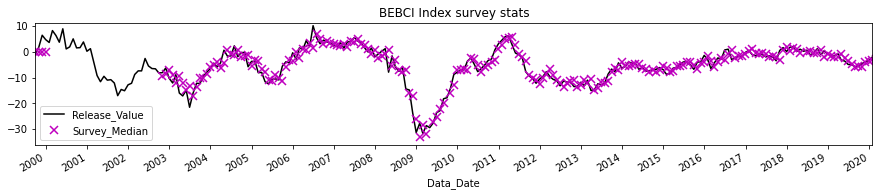

In [33]:
### RUN TO TESTING: FILLED ECO INDICES DATA PLOTTING TO VISUAL CONTROL ### CELL TO ADD

### Index choosing:
str_test_index = 'BEBCI Index'
### Data loading:
df_dates_filled = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_raw_filled)
df_flags = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_flags)
#### Flags printing:
print(df_flags.loc[str_test_index, All])
### Series creating:
if ((len(df_dates_filled.loc[(str_test_index, All), 'Survey_Median'].dropna()) == 0) & 
    (len(df_dates_filled.loc[(str_test_index, All), 'Survey_Average'].dropna()) == 0)):
    print('NO SURVEY DATA HERE!')
df_eco_ind = df_dates_filled.loc[(str_test_index, All), All].droplevel(0)[['Survey_Median', 'Survey_Average', 'Release_Value', 'Revision_Value', 'Final_Value']]    
date_xlim_start = df_eco_ind[['Release_Value', 'Survey_Median']].dropna().index.min()
date_xlim_finish = df_eco_ind[['Release_Value', 'Survey_Median']].dropna().index.max()
#date_xlim_start = datetime(1984, 12, 31)
date_xlim_finish = datetime(2020, 1, 31)
#date_xlim_finish = datetime(2020, 8, 31)
flo_ylim_min = df_eco_ind.loc[date_xlim_start : date_xlim_finish, All].min().min()
flo_ylim_max = df_eco_ind.loc[date_xlim_start : date_xlim_finish, All].max().max()
tup_ylim = (flo_ylim_min - abs(flo_ylim_min) / 10, flo_ylim_max + abs(flo_ylim_max) / 10)
#ax_eco_ind = df_eco_ind[['Release_Value', 'Survey_Median', 'Survey_Average']].plot(figsize = (15, 5), title = str_test_index + ' survey stats', 
#                style = ['k-', 'bd', 'c+'], markersize = 7.5, markeredgewidth = 1.5, 
#                xlim = (date_xlim_start, date_xlim_finish), ylim = tup_ylim, x_compat = True)
ax_eco_ind = df_eco_ind[['Release_Value', 'Survey_Median']].plot(figsize = (15, 2.5), title = str_test_index + ' survey stats', 
                style = ['k-', 'mx'], markersize = 7.5, markeredgewidth = 1.5, 
                xlim = (date_xlim_start, date_xlim_finish), ylim = tup_ylim, x_compat = True)
ax_eco_ind.xaxis.set_major_locator(mdates.YearLocator(base = 1))                             
ax_eco_ind.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))                
plt.show()
#ax_eco_ind = df_eco_ind.plot(figsize = (20, 5), title = str_test_index + ' revisions', 
#                style = ['r*', 'bd', 'c+', 'mx', 'k-'], markersize = 7.5, markeredgewidth = 1.5,                              
#                xlim = (date_xlim_start, date_xlim_finish), ylim = tup_ylim, x_compat = True)
#ax_eco_ind.xaxis.set_major_locator(mdates.YearLocator(base = 1))                             
#ax_eco_ind.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))                
#plt.show() 

In [19]:
### UNIQUE FORECAST CODE HERE AND AFTER ###

In [20]:
### RUN TO TEST: ZERO FORECAST STD RESEARCH

df_filled = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_raw_filled)
df_filled['Observations_Number'].replace({np.NaN: -1, 0: -1, 1: -1, 2: -1}, inplace = True)
df_filled = df_filled[df_filled['Observations_Number'] > -1].drop(['EUGNEMUQ Index', 'GDP CQOQ Index', 'JGDPQGDP Index', 'UKGRABIQ Index'], axis = 0)
df_zero_std = pd.DataFrame()
df_zero_std['Dates_With_Std'] = df_filled.groupby('Index_Name')\
                                         .apply(lambda df_ticker: df_ticker['Forecast_Std'].count() / len(df_ticker)).round(2)
df_zero_std['Zero_Std_Percent'] = df_filled.groupby('Index_Name')\
                                           .apply(lambda df_ticker: len(df_ticker[df_ticker['Forecast_Std'] == 0.0]) / df_ticker['Forecast_Std'].count()).round(2)
df_zero_std['Mean_Non_Zero_Std'] = df_filled.groupby('Index_Name')\
                                            .apply(lambda df_ticker: df_ticker.loc[df_ticker['Forecast_Std'] > 0.0, 'Forecast_Std'].mean()).round(2)
df_zero_std['Mean_Zero_Experts'] = df_filled.groupby('Index_Name')\
                                            .apply(lambda df_ticker: df_ticker.loc[df_ticker['Forecast_Std'] == 0.0, 'Observations_Number'].mean()).round(2)
print('Percent of tickers with zero Forecast_Std: ', 
      round(len(df_zero_std['Mean_Zero_Experts'].dropna()) / len(df_zero_std), 2), '(from ' + str(len(df_zero_std)) + ')')
df_zero_std = df_zero_std[df_zero_std['Mean_Zero_Experts'].notna()]
#df_zero_std.to_excel('Data_Files/Test_Files/Zero_Std_Stats.xlsx', merge_cells = False)

Percent of tickers with zero Forecast_Std:  0.42 (from 125)


In [8]:
### RUN TO TEST: EMPTY REVISIONS RESEARCH

### Dataframe loading:
df_dates_filled = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_raw_filled)
### Types and region export:
df_flags = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_flags)
df_group_info = df_flags[['Type_Prime', 'Sub_Type', 'Region']].copy()
df_group_info['Type'] = df_group_info['Type_Prime'] + '/' + df_group_info['Sub_Type']
df_forecast_data = df_dates_filled.join(df_group_info, how = 'left')
### Dropping EI's having wrong Primary Types:
#df_forecast_data.drop(df_forecast_data[df_forecast_data['Type_Prime'].isin(['TAR', 'INF'])].index, inplace = True)
df_forecast_data = df_forecast_data[df_forecast_data['Type_Prime'] != 'TAR']
### Dropping rows doesn't have enough data:
df_forecast_data = df_forecast_data[['Release_Date', 'Release_Value', 'Revision_Value', 'Survey_Median', 'Forecast_Std', 'Observations_Number', 'Region', 'Type']]\
                                  .dropna(subset = ['Release_Date'])
### Dates arranging:
df_forecast_data['Release_Date'] = df_forecast_data['Release_Date'] + 0 * pd.offsets.BDay()
df_forecast_data = df_forecast_data[df_forecast_data['Release_Date'] <= datetime_end]
df_forecast_data = df_forecast_data.reset_index('Data_Date', drop = True).set_index('Release_Date', append = True).sort_index()
### Duplicated observations removal (2 * 14):
df_forecast_data = df_forecast_data[~df_forecast_data.index.duplicated(keep = 'last')]
### Wrong observation number rows marking:
df_forecast_data['Observations_Number'].replace({np.NaN: -1, 0: -1, 1: -1, 2: -1}, inplace = True)

In [ ]:
### RUN TO TEST: EMPTY REVISIONS RESEARCH

df_revisions = pd.DataFrame()
#df_revisions['Filled_percent'] = df_forecast_data.groupby('Index_Name')\
#                                                   .apply(lambda df_ticker: df_ticker['Revision_Value'].count() / df_ticker['Release_Value'].count()).round(2)
#df_revisions['Filled_after_first'] = df_forecast_data.groupby('Index_Name')\
#                                                .apply(lambda df_ticker: df_ticker.loc[df_ticker['Revision_Value'].first_valid_index(): , 'Revision_Value'].count() / 
#                                                                         df_ticker.loc[df_ticker['Revision_Value'].first_valid_index(): , 'Release_Value'].count())\
#                                                .round(2)
df_revisions['Last_Year'] = df_forecast_data.groupby('Index_Name').apply(lambda df_ticker: df_ticker[-12 : ]['Revision_Value'].count() / 
                                                                         df_ticker[-12 : ]['Release_Value'].count()).round(2)
df_revisions['Last_Three'] = df_forecast_data.groupby('Index_Name').apply(lambda df_ticker: df_ticker[-36 : ]['Revision_Value'].count() / 
                                                                         df_ticker[-36 : ]['Release_Value'].count()).round(2)
#idx_to_fill_empty_revision = df_revisions[(df_revisions['Filled_percent'] > 0.0) & (df_revisions['Filled_after_first'] > 0.1)].index
idx_to_fill_empty_revision = df_revisions[(df_revisions['Last_Year'] +  df_revisions['Last_Three']) > 0.80].index
len(idx_to_fill_empty_revision)
#idx_to_fill_empty_revision = ['ADP CHNG Index', 'ATIPIMM Index', 'BEUER Index', 'CONCCONF Index', 'CPTICHNG Index', 'DGNOCHNG Index', 'DGNOXTCH Index', 
#                              'ECO1GFKC Index', 'EUBCI Index', 'EUCPTSAM Index', 'EUESEMU Index', 'EUICEMU Index', 'EUITEMUM Index', 'EUPPEMUM Index', 
#                              'EUSCEMU Index', 'FIIPSAIM Index', 'FPIPMOM Index', 'FRMPMOM Index', 'FRPIMOM Index', 'GKRSNEWY Index', 'GRFRIAMM Index', 
#                              'GRIFPBUS Index', 'GRIFPCA Index', 'GRIFPEX Index', 'GRIORTMM Index', 'GRIPIMOM Index', 'GRUECHNG Index', 'IEUERT Index',
#                              'IMP1CHNG Index', 'INJCJC Index', 'INJCSP Index', 'INSEPROD Index', 'INSESYNT Index', 'IP CHNG Index', 'ITBCI Index', 'ITORTSAM Index',
#                              'ITPRSANM Index', 'ITPSSA Index', 'ITVHYOY Index', 'JNTIAIAM Index', 'JNTIAMOM Index', 'MTIBCHNG Index', 'MWINCHNG Index', 
#                              'NEIP20MM Index', 'NFP TCH Index', 'PCE CHNC Index', 'PITLCHNG Index', 'PTIPTOTM Index', 'PTRTIMOM Index', 'RSTAMOM Index', 
#                              'RSTAXAG% Index', 'SLIOINMM Index', 'SPIOYOY Index', 'SPROCHNG Index', 'SPRSRGIY Index', 'SVBTSI Index', 'TMNOCHNG Index', 
#                              'UKAWMWHO Index', 'UKIPIMOM Index', 'UKMPIMOM Index', 'UKPPIINC Index', 'UKPPIOC Index', 'UKRVAMOM Index', 'UKRVINFM Index',
#                              'UKUEMOM Index', 'USMMMNCH Index']
#df_revisions.to_excel('Data_Files/Test_Files/Revisions_Stats.xlsx', merge_cells = False)

In [64]:
### RUN TO RE-EXPORT DATA: TICKERS FILTERING DUE TO TYPE AND SURVEY DATA QUALITY

### Empty revisions filling procedure:
def fill_empty_revision(df_ticker):
    str_ticker_name = df_ticker.index[0][0]
    df_filled = df_ticker.droplevel('Index_Name')
    if (str_ticker_name in idx_to_fill_empty_revision):
        ser_count_nans = df_filled['Revision_Value'].isna().astype(int).groupby(df_filled['Revision_Value'].notna().astype(int).cumsum()).cumsum()
        idx_nans_to_fill = ser_count_nans[(ser_count_nans > 0) & (ser_count_nans <= 2)].index
        df_filled.loc[idx_nans_to_fill, 'Revision_Value'] = df_filled.loc[idx_nans_to_fill, 'Release_Value']    
    return df_filled
### Dataframe loading:
df_dates_filled = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_raw_filled)
### Types and region export:
df_flags = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_flags)
df_group_info = df_flags[['Type_Prime', 'Sub_Type', 'Region']].copy()
df_group_info['Type'] = df_group_info['Type_Prime'] + '/' + df_group_info['Sub_Type']
df_forecast_data = df_dates_filled.join(df_group_info, how = 'left')
### Dropping EI's having wrong Primary Types:
#df_forecast_data.drop(df_forecast_data[df_forecast_data['Type_Prime'].isin(['TAR', 'INF'])].index, inplace = True)
df_forecast_data = df_forecast_data[df_forecast_data['Type_Prime'] != 'TAR']
### Survey data stats:
print('Observations having Survey Median values:', round(df_forecast_data['Survey_Median'].count() / len(df_forecast_data.index), 4))
print('Observations having Survey Average values:', round(df_forecast_data['Survey_Average'].count() / len(df_forecast_data.index), 4))
print('Observations having neither Survey Median nor Survey Average values:', 
      round(len(df_forecast_data[df_forecast_data['Survey_Median'].isna() & df_forecast_data['Survey_Average'].isna()].index) / len(df_forecast_data.index), 4))
print('Observations having both Survey Median & Survey Average values:', 
      round(len(df_forecast_data[df_forecast_data['Survey_Median'].notna() & df_forecast_data['Survey_Average'].notna()].index) / len(df_forecast_data.index), 4))
print('Observations having only Survey Median values:', 
      round(len(df_forecast_data[df_forecast_data['Survey_Median'].notna() & df_forecast_data['Survey_Average'].isna()].index) / len(df_forecast_data.index), 4))
print('Observations having only Survey Average values:', 
      round(len(df_forecast_data[df_forecast_data['Survey_Median'].isna() & df_forecast_data['Survey_Average'].notna()].index) / len(df_forecast_data.index), 4))
### Dropping rows doesn't have enough data:
df_forecast_data = df_forecast_data[['Release_Date', 'Release_Value', 'Revision_Value', 'Survey_Median', 'Forecast_Std', 'Observations_Number', 'Region', 'Type']]\
                                  .dropna(subset = ['Release_Date'])
### Dates arranging:
df_forecast_data['Release_Date'] = df_forecast_data['Release_Date'] + 0 * pd.offsets.BDay()
df_forecast_data = df_forecast_data[df_forecast_data['Release_Date'] <= datetime_end]
df_forecast_data = df_forecast_data.reset_index('Data_Date', drop = True).set_index('Release_Date', append = True).sort_index()
### Duplicated observations removal (2 * 14):
df_forecast_data = df_forecast_data[~df_forecast_data.index.duplicated(keep = 'last')]
### Wrong observation number rows marking:
print('Observations with incorrect forecasters number values (NaN, 0, 1, 2):', 
      round(len(df_forecast_data[df_forecast_data['Observations_Number'].isna() | df_forecast_data['Observations_Number'].isin([0, 1, 2])].index) / 
            len(df_forecast_data.index), 4))
df_forecast_data['Observations_Number'].replace({np.NaN: -1, 0: -1, 1: -1, 2: -1}, inplace = True)
print('Observations with incorrect forecasters number values having forecast std value:', 
      round(len(df_forecast_data[df_forecast_data['Forecast_Std'].notna() & (df_forecast_data['Observations_Number'] == -1)].index) / len(df_forecast_data.index), 4))
print('Observations with incorrect forecasters number values having survey median value:', 
      round(len(df_forecast_data[df_forecast_data['Survey_Median'].notna() & (df_forecast_data['Observations_Number'] == -1)].index) / len(df_forecast_data.index), 4))
### Empty revisions filling procedure:
df_forecast_data = df_forecast_data.groupby('Index_Name').apply(fill_empty_revision)
### Adding previous data date values to future Revision Surprise calculation:
df_forecast_data['Release_Prev'] = df_forecast_data['Release_Value'].groupby('Index_Name').shift()
df_forecast_data['Revision_Prev'] = df_forecast_data['Revision_Value'].groupby('Index_Name').shift()
df_forecast_data.drop('Revision_Value', axis = 1, inplace = True)
### Tickers data reindexation to common timeline:
#df_reindexed = df_forecast_data.unstack('Index_Name').sort_index().ffill().stack('Index_Name', dropna = False).swaplevel().sort_index()
idx_dates = sorted(df_forecast_data.index.get_level_values('Release_Date').unique())
df_reindexed = df_forecast_data.groupby('Index_Name').apply(lambda df_ticker: df_ticker.droplevel('Index_Name').reindex(idx_dates, method = 'ffill'))
### Clearing rows having incorrect data:
df_cleared = df_reindexed[df_reindexed['Observations_Number'] > -1].copy().dropna(subset = ['Forecast_Std'])
### Substituting zero forecast std with expanding min:
print('Observation having zero forecast std values (after preliminary cleaning):', round(len(df_cleared[df_cleared['Forecast_Std'] == 0.0]) / len(df_cleared), 2))
ser_expanding_min = df_cleared.groupby('Index_Name', group_keys = False)\
                              .apply(lambda df_ticker: df_ticker.loc[df_ticker['Forecast_Std'] > 0.0, 'Forecast_Std'].expanding().min()).round(2)
df_cleared['Expanding_Std_Min'] = ser_expanding_min.reindex(df_cleared.index, method = 'ffill')
idx_zero = df_cleared[df_cleared['Forecast_Std'] == 0.0].index
df_cleared.loc[df_cleared['Forecast_Std'] == 0.0, 'Forecast_Std'] = df_cleared['Expanding_Std_Min']
df_cleared.drop('Expanding_Std_Min', axis = 1, inplace = True)
### Cleared and reindexed table saving:
print('Economic indices left to forecast indices generation:', len(df_cleared.index.get_level_values('Index_Name').unique()))
df_cleared.to_hdf(str_path_bb_fcast_hdf, key = str_key_cleared, mode = 'a')
_ = gc.collect()

Observations having Survey Median values: 0.3679
Observations having Survey Average values: 0.3595
Observations having neither Survey Median nor Survey Average values: 0.632
Observations having both Survey Median & Survey Average values: 0.3594
Observations having only Survey Median values: 0.0085
Observations having only Survey Average values: 0.0001
Observations with incorrect forecasters number values (NaN, 0, 1, 2): 0.4394
Observations with incorrect forecasters number values having forecast std value: 0.0372
Observations with incorrect forecasters number values having survey median value: 0.0173
Observation having zero forecast std values (after preliminary cleaning): 0.06
Economic indices left to forecast indices generation: 125


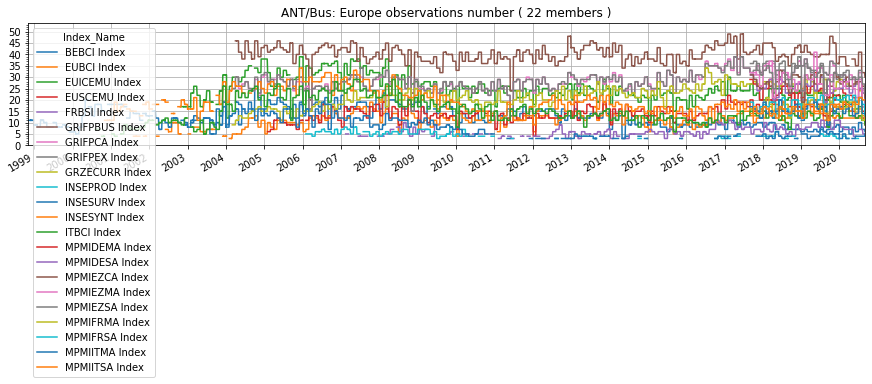

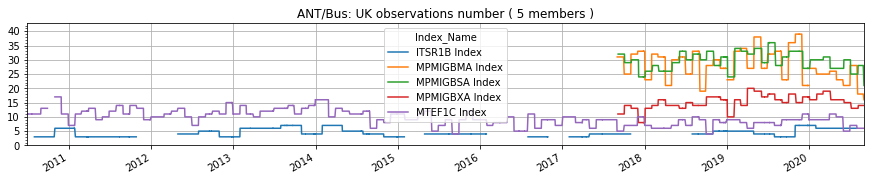

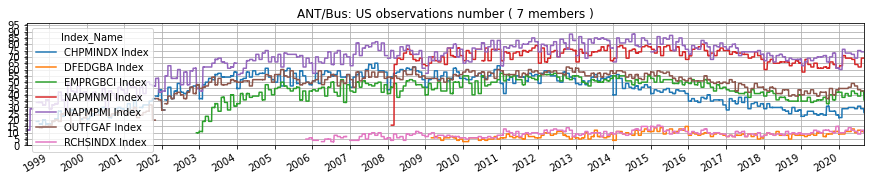

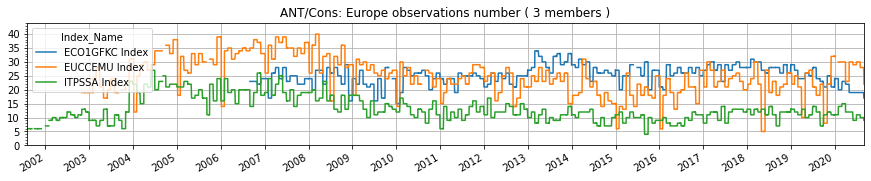

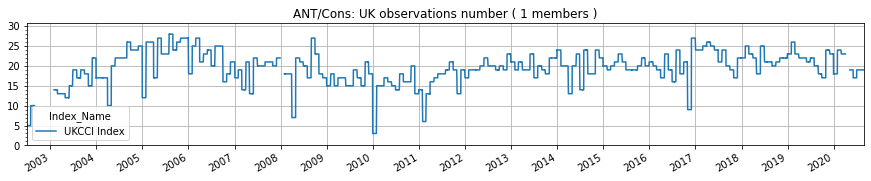

...

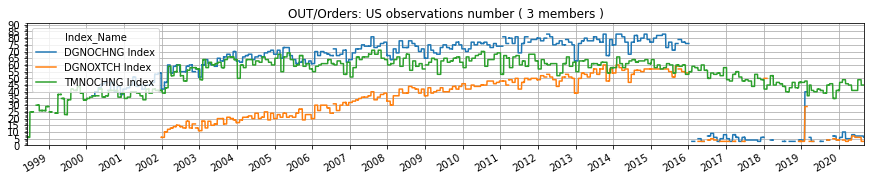

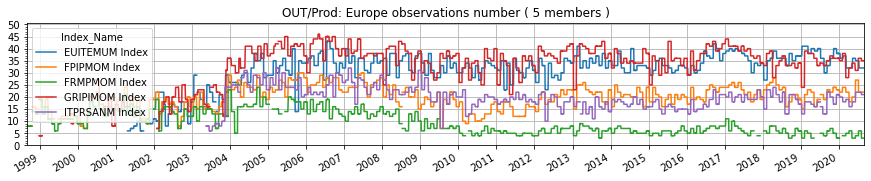

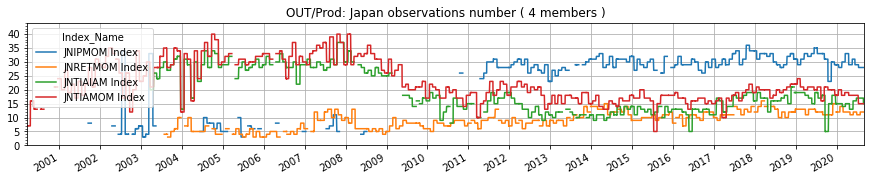

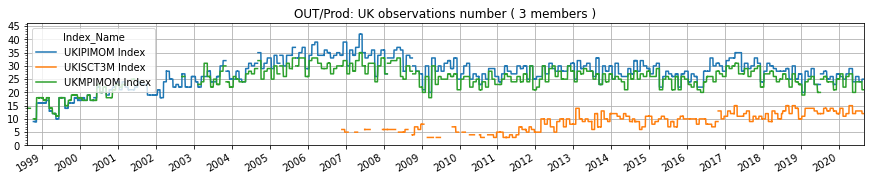

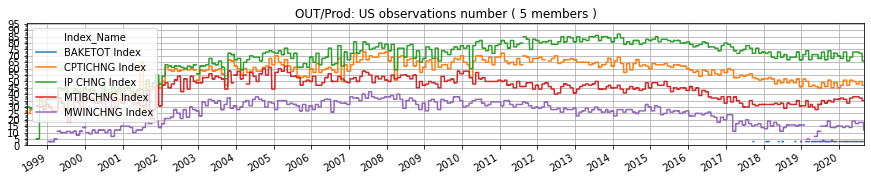

In [5]:
### RUN TO TESTING: REGION / TYPE PAIR DEFINED GROUPS VISUAL CONTROL

def forecast_group_demo(ser_group):   
    flo_ylim_max = ser_group.max()
    tup_ylim = (0, flo_ylim_max + abs(flo_ylim_max) / 10)
    df_group = ser_group.unstack('Index_Name')
    idx_group_range = pd.date_range(df_group.index.min(), df_group.index.max(), freq = 'B')
    df_group = df_group.reindex(idx_group_range)
    ax_group = df_group.plot(figsize = (15, 2.5), title = ': '.join(ser_group.name) + ' observations number ( ' + str(len(df_group.columns)) +  ' members )', 
                                         ylim = tup_ylim, x_compat = True, grid = True)
    ax_group.xaxis.set_major_locator(mdates.YearLocator(base = 1))                             
    ax_group.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))   
    ax_group.yaxis.set_major_locator(plt.MultipleLocator(5))
    ax_group.yaxis.set_minor_locator(plt.MultipleLocator(1))
    plt.show()

### Forecast data loading:
df_cleared = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_cleared)
### Group data plotting:
_ = df_cleared.groupby(['Type', 'Region'])['Observations_Number'].apply(forecast_group_demo)

<Figure size 1080x360 with 0 Axes>

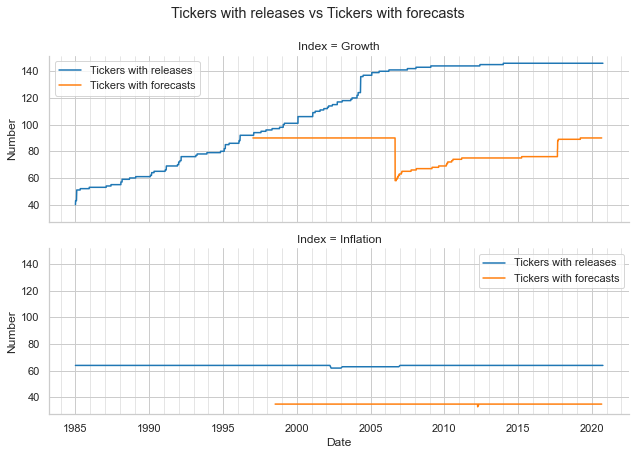

In [66]:
### RUN TO TESTING: TICKERS NUMBER COMPARING

### EI Dataframe loading:
df_ei_data_full = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_raw_filled)
ser_ei_data = df_ei_data_full['Release_Value'].notna() | df_ei_data_full['Revision_Value'].notna() | df_ei_data_full['Final_Value'].notna()
ser_ei_data.name = 'Value_Flag'
### Types and region export and clearing:
df_flags = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_flags)
df_group_info = df_flags.loc[df_flags['Type_Prime'] != 'TAR', ['Type_Prime', 'Sub_Type', 'Region']].copy()
df_group_info['Type'] = df_group_info['Type_Prime'] + '/' + df_group_info['Sub_Type']
df_ei_data_cleared = ser_ei_data.to_frame().join(df_group_info, how = 'left').dropna()
### Tickers number extraction:
dict_ei_number = {}
dict_ei_number['Growth'] = df_ei_data_cleared.loc[df_ei_data_cleared['Type_Prime'] != 'INF', 'Value_Flag'].unstack('Index_Name').ffill().count(axis = 1)
dict_ei_number['Inflation'] = df_ei_data_cleared.loc[df_ei_data_cleared['Type_Prime'] == 'INF', 'Value_Flag'].unstack('Index_Name').ffill().count(axis = 1)
### Forecasts Dataframe loading:
df_fcast_cleared = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_cleared)
ser_fcast_data = df_fcast_cleared['Survey_Median'].notna() & df_fcast_cleared['Forecast_Std'].notna()
ser_fcast_data.name = 'Forecast_Flag'
### Types and region export and clearing:
df_flags = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_flags)
df_group_info = df_flags.loc[df_flags['Type_Prime'] != 'TAR', ['Type_Prime', 'Sub_Type', 'Region']].copy()
df_group_info['Type'] = df_group_info['Type_Prime'] + '/' + df_group_info['Sub_Type']
df_fcast_data = ser_fcast_data.to_frame().join(df_group_info, how = 'left').dropna()
### Tickers number extraction:
dict_fcast_number = {}
dict_fcast_number['Growth'] = df_fcast_data.loc[df_fcast_data['Type_Prime'] != 'INF', 'Forecast_Flag'].unstack('Index_Name').ffill().count(axis = 1)
dict_fcast_number['Inflation'] = df_fcast_data.loc[df_fcast_data['Type_Prime'] == 'INF', 'Forecast_Flag'].unstack('Index_Name').ffill().count(axis = 1)
### Plot creating:
ser_ei_number = pd.concat(dict_ei_number)
ser_ei_number.index.names = ['Index', 'Date']
ser_ei_number.name = 'Number'
ser_fcast_number = pd.concat(dict_fcast_number)
ser_fcast_number.index.names = ['Index', 'Date']
ser_fcast_number.name = 'Number'

df_to_plot = pd.concat([ser_ei_number, ser_fcast_number], axis = 0, keys = ['Tickers with releases', 'Tickers with forecasts'], names = ['Tickers number'])\
               .reset_index()
sns.set_style('whitegrid')
plt.figure(figsize = (15, 5))
sns.set_context('notebook')

grid_tickers_number = sns.FacetGrid(data = df_to_plot, row = 'Index', height = 3.0, aspect = 3.0, legend_out = False)
fig_tickers_number = grid_tickers_number.map(sns.lineplot, 'Date', 'Number', 'Tickers number')    
fig_tickers_number.fig.suptitle('Tickers with releases vs Tickers with forecasts', y = 1.05)

for iter_ax in fig_tickers_number.axes.ravel():
    ### Separate legend for each ax:
    iter_ax.legend()
    ### Major ticker options:    
    iter_ax.get_xaxis().set_major_locator(mdates.YearLocator(base = 5))                             
    iter_ax.get_xaxis().set_major_formatter(mdates.DateFormatter('%Y'))       
    ### Minor ticker options:        
    iter_ax.get_xaxis().set_minor_locator(mdates.YearLocator(base = 1)) 
    iter_ax.grid(visible = True, which = 'minor', linewidth = 0.5)
    
plt.show()

In [67]:
### RUN TO TESTING: GLOBAL INDICES REGION / TYPE STATS

### Dataframe loading:
df_dates_filled = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_raw_filled)
### Tickers register extracting:
ser_ei_data = df_dates_filled.groupby('Index_Name', group_keys = False).apply(lambda df_group: df_group[: 1].droplevel('Data_Date'))['Observations_Number']
### Types and region export and clearing:
df_flags = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_flags)
df_group_info = df_flags.loc[df_flags['Type_Prime'] != 'TAR', ['Type_Prime', 'Sub_Type', 'Region']].copy()
df_group_info['Type'] = df_group_info['Type_Prime'] + '/' + df_group_info['Sub_Type']
df_ei_data = ser_ei_data.to_frame().join(df_group_info, how = 'left')
df_ei_data = df_ei_data[['Type', 'Region']].dropna()
### Economic Indices base pivot table constructing:
df_ei_pivot = df_ei_data.reset_index().set_index(['Type', 'Region']).groupby(['Type', 'Region']).count().unstack('Region').fillna(0)
df_ei_pivot.columns = df_ei_pivot.columns.levels[1]
df_ei_pivot['World'] = df_ei_pivot.sum(axis = 1)
df_ei_pivot.loc['Total'] = df_ei_pivot.sum(axis = 0)
display(df_ei_pivot)
#df_ei_pivot.to_excel('Data_Files/Test_Files/Some_Stats.xlsx', merge_cells = False)

Region,Europe,Japan,UK,US,World
Type,,,,,
ANT/Bus,25.0,1.0,7.0,8.0,41.0
ANT/Cons,6.0,2.0,1.0,3.0,12.0
ANT/Eco,5.0,3.0,0.0,0.0,8.0
CON/Cons,10.0,6.0,4.0,5.0,25.0
EMP/Emp,10.0,2.0,4.0,7.0,23.0
INF/CPI,32.0,6.0,5.0,3.0,46.0
INF/PPI,12.0,1.0,3.0,2.0,18.0
OUT/Orders,3.0,3.0,0.0,3.0,9.0
OUT/Prod,14.0,6.0,3.0,5.0,28.0


In [68]:
### RUN TO TESTING: SURVEY DATA REGION / TYPE STATS

### Forecast data loading:
df_cleared = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_cleared)
### Forecast base pivot table constructing:
df_survey_pivot = df_cleared.groupby('Index_Name', group_keys = False).apply(lambda df_group: df_group[: 1].droplevel('Release_Date'))[['Type', 'Region']]\
                            .reset_index().set_index(['Type', 'Region']).groupby(['Type', 'Region']).count().unstack('Region').fillna(0)
df_survey_pivot.columns = df_survey_pivot.columns.levels[1]
df_survey_pivot['World'] = df_survey_pivot.sum(axis = 1)
df_survey_pivot.loc['Total'] = df_survey_pivot.sum(axis = 0)
display(df_survey_pivot)
### Pivot tables comparision:
df_survey_comparision = df_survey_pivot.astype(str) + ' (' + df_ei_pivot.astype(str) + ')'
display(df_survey_comparision)
#df_survey_comparision.to_excel('Data_Files/Test_Files/Some_Stats.xlsx', merge_cells = False)

Region,Europe,Japan,UK,US,World
Type,,,,,
ANT/Bus,22.0,0.0,5.0,7.0,34.0
ANT/Cons,3.0,0.0,1.0,2.0,6.0
ANT/Eco,3.0,1.0,0.0,0.0,4.0
CON/Cons,1.0,1.0,3.0,4.0,9.0
EMP/Emp,4.0,2.0,2.0,7.0,15.0
INF/CPI,16.0,4.0,5.0,3.0,28.0
INF/PPI,2.0,1.0,3.0,1.0,7.0
OUT/Orders,1.0,1.0,0.0,3.0,5.0
OUT/Prod,5.0,4.0,3.0,5.0,17.0


Region,Europe,Japan,UK,US,World
Type,,,,,
ANT/Bus,22.0 (25.0),0.0 (1.0),5.0 (7.0),7.0 (8.0),34.0 (41.0)
ANT/Cons,3.0 (6.0),0.0 (2.0),1.0 (1.0),2.0 (3.0),6.0 (12.0)
ANT/Eco,3.0 (5.0),1.0 (3.0),0.0 (0.0),0.0 (0.0),4.0 (8.0)
CON/Cons,1.0 (10.0),1.0 (6.0),3.0 (4.0),4.0 (5.0),9.0 (25.0)
EMP/Emp,4.0 (10.0),2.0 (2.0),2.0 (4.0),7.0 (7.0),15.0 (23.0)
INF/CPI,16.0 (32.0),4.0 (6.0),5.0 (5.0),3.0 (3.0),28.0 (46.0)
INF/PPI,2.0 (12.0),1.0 (1.0),3.0 (3.0),1.0 (2.0),7.0 (18.0)
OUT/Orders,1.0 (3.0),1.0 (3.0),0.0 (0.0),3.0 (3.0),5.0 (9.0)
OUT/Prod,5.0 (14.0),4.0 (6.0),3.0 (3.0),5.0 (5.0),17.0 (28.0)


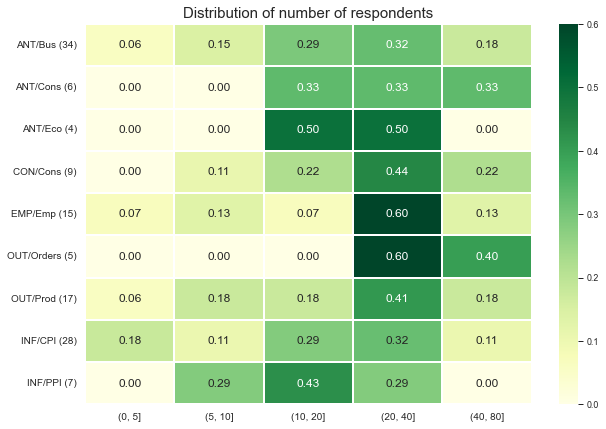

In [69]:
### RUN TO TESTING: SURVEY DATA FORECASTERS NUMBER DISTRIBUTION VISUALIZATION

### Defining observations distribution by bins:
def mean_distribution(df_group, list_bins):
    ser_obs_bins = pd.cut(df_group['Mean_Observations'], bins = list_bins, retbins = False).value_counts(normalize = True)
    return ser_obs_bins

### Forecast data loading:
df_cleared = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_cleared)
### Observations numbers summarizing:
df_survey_data = df_cleared.groupby('Index_Name', group_keys = False).apply(lambda df_group: df_group[: 1].droplevel('Release_Date'))[['Type', 'Region']]
df_survey_data['Mean_Observations'] = df_cleared.groupby('Index_Name')['Observations_Number'].mean()
### Bin edge defining:
list_bins = [0, 5, 10, 20, 40, 80]
#### Distribution by type/region:
#df_type_region_distr = df_survey_data.groupby(['Type', 'Region']).apply(mean_distribution).unstack(-1)
#df_type_region_distr.set_index(df_type_region_distr.index.get_level_values(0) + ' | ' + df_type_region_distr.index.get_level_values(1))
#df_type_region_distr.columns.name = 'Mean surveys number for type/region pair'
### Distribution by type only:
df_type_only_distr = df_survey_data.groupby(['Type']).apply(mean_distribution, list_bins).unstack(-1)
#df_type_only_distr.columns.name = 'Mean surveys number distribution for each type'
### Index editing:
df_type_only_distr.set_index(df_type_only_distr.index.values + ' (' + df_survey_data.groupby(['Type'])['Mean_Observations'].count().astype(str) + ')', inplace = True)
df_type_only_distr = pd.concat([df_type_only_distr.iloc[: 5], df_type_only_distr.iloc[7 : ], df_type_only_distr.iloc[5 : 7]], axis = 0)
### Heatmap plotting:
plt.figure(figsize = (10, 7))
sns.set_context('paper', rc = {'font.size': 12, 'axes.titlesize': 15}) 
ax_heat = sns.heatmap(df_type_only_distr, cmap = 'YlGn', annot = True, fmt = '.2f', linewidths = 2.0, linecolor = 'white')
ax_heat.axes.set_title('Distribution of number of respondents')
ax_heat.set_ylabel('')
ax_heat.tick_params(labelsize = 10)
plt.show()

In [70]:
### RUN TO RE-EXPORT DATA: SETTING TICKER/DATA PAIR WEIGHTS

### Forecast data loading:
df_cleared = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_cleared)
df_cleared['Observations_Number'] = df_cleared['Observations_Number'].astype(int)
### Resampling to businnes daily frequency without gaps:
df_cleared = df_cleared.unstack('Index_Name').resample('B').asfreq().stack('Index_Name', dropna = False).swaplevel().sort_index()
### Adding rolling mean of obseravtions number:
df_cleared['Rolling_Obs_Number'] = df_cleared['Observations_Number'].unstack('Index_Name').sort_index().rolling(window = int_obs_num_win, min_periods = 1)\
                                                                    .mean().round(0).stack('Index_Name', dropna = False).swaplevel().sort_index()
### Dropping NA values (we need it only to correct rolling mean calculation):
df_weighted = df_cleared.dropna(subset = ['Region', 'Type']).drop('Observations_Number', axis = 1)
### Setting initial weight by square root of observations number:
df_weighted['Obs_Num_Weight'] = df_weighted.groupby(['Release_Date', 'Region', 'Type'])['Rolling_Obs_Number']\
                                           .apply(lambda ser_group: np.sqrt(ser_group) / np.sqrt(ser_group).sum())
### Extracting existing Date / Type / Region combinations:
ser_region_count = df_weighted.groupby(['Release_Date', 'Type', 'Region'])['Type'].count()
ser_region_count = ser_region_count / ser_region_count
ser_region_count.name = 'Group_Flag'
### Region weights preparing:
ser_region_weight = pd.DataFrame.from_dict(dict_region_weight, orient = 'index').squeeze()
ser_region_weight.name = 'Region_Weight'
### Adding region weights to combinations collection:
df_region_weight = ser_region_count.to_frame().join(ser_region_weight, how = 'left', on = 'Region')
### Region weights normalizing:
df_region_weight['Reg_Norm_Weight'] = df_region_weight.groupby(['Release_Date', 'Type'])['Region_Weight'].transform(lambda ser_group: ser_group / ser_group.sum())
### Adding normalized weights to main table:
df_weighted = df_weighted.join(df_region_weight['Reg_Norm_Weight'], how = 'left', on = ['Release_Date', 'Type', 'Region'])
### Adding Growth Index flag:
df_weighted['Growth'] = True
df_weighted.loc[df_weighted['Type'].isin(['INF/CPI', 'INF/PPI']), 'Growth'] = False
### Extracting existing Date / Type combinations:
ser_type_count = df_weighted.groupby(['Release_Date', 'Type'])['Type'].count()
ser_type_count = ser_type_count / ser_type_count
ser_type_count.name = 'Type_Flag'
### FPC weights export:
ser_fpc_weight = pd.read_hdf(str_path_fpc_hdf, key = str_weights_key).stack(dropna = False).swaplevel()
ser_fpc_weight.index.names = ['Type', 'Release_Date']
ser_fpc_weight.name = 'FPC_Weight'
### Adding region weights to combinations collection:
df_type_weight = ser_type_count.to_frame().join(ser_fpc_weight, how = 'left', on = ['Type', 'Release_Date'])
df_type_weight.loc[(All, ['INF/CPI', 'INF/PPI']), 'FPC_Weight'] = 0.5
### Adding Growth Index flag:
df_type_weight['Growth'] = True
df_type_weight.loc[(All, ['INF/CPI', 'INF/PPI']), 'Growth'] = False
### Type weights normalizing:
df_type_weight['Type_Norm_Weight'] = df_type_weight.groupby(['Release_Date', 'Growth'])['FPC_Weight'].transform(lambda ser_group: ser_group / ser_group.sum())
### Filling dates with empty FPC weights (3 dates filled):
df_type_weight['Type_Norm_Weight'] = df_type_weight['Type_Norm_Weight'].groupby('Type').ffill()
### Adding normalized weights to main table:
df_weighted = df_weighted.join(df_type_weight['Type_Norm_Weight'], how = 'left', on = ['Release_Date', 'Type'])
### Ticker weights calculating for each date / ticker pair:
df_weighted['Ticker_Weight'] = df_weighted['Obs_Num_Weight'] * df_weighted['Reg_Norm_Weight'] * df_weighted['Type_Norm_Weight']
### Table saving:
df_weighted[['Release_Value', 'Survey_Median', 'Forecast_Std', 'Rolling_Obs_Number', 'Ticker_Weight', 'Growth', 'Release_Prev', 'Revision_Prev']]\
           .to_hdf(str_path_bb_fcast_hdf, key = str_key_weighted, mode = 'a')

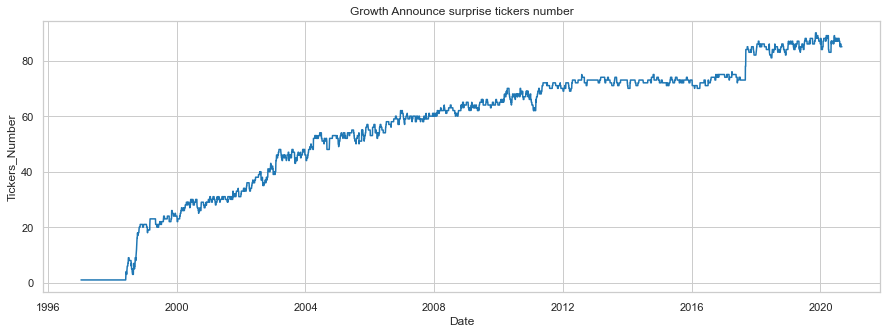

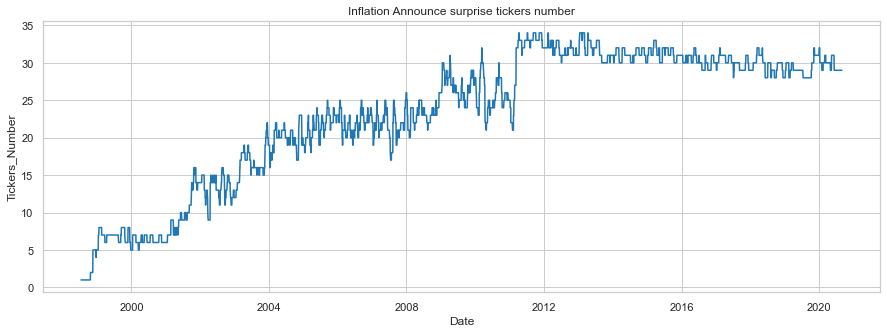

In [71]:
### RUN TO TEST: ANNOUNCE SURPRISE TICKERS NUMBER RESEARCH

### Defining index vector average calculator:
def release_date_surprise_count(df_date, int_min_tickers_to_go):
    ser_date_surprise = ((df_date['Release_Value'] - df_date['Survey_Median']) / df_date['Forecast_Std'])
    return ser_date_surprise.count()
### Economic surprise data loading:
df_surprise = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_weighted)
### Dropping zero stdev values:
df_surprise.loc[df_surprise['Forecast_Std'] < flo_winsorize_tolerance, 'Forecast_Std'] = np.NaN
### Data dividing:
dict_weighted = {}
dict_weighted['Growth'] = df_surprise[df_surprise['Growth'] == True]
dict_weighted['Inflation'] = df_surprise[df_surprise['Growth'] == False]
### Factors calculating:
dict_surprise = {}
for iter_key in dict_weighted:
    ser_surprise = dict_weighted[iter_key].dropna(how = 'all').groupby('Release_Date').apply(release_date_surprise_count, int_min_tickers_to_go)
    ser_surprise.index.name = 'Date'
    ser_surprise.name = 'Tickers_Number'
    ### Plot creation:
    sns.set_style('whitegrid')
    plt.figure(figsize = (15, 5))
    sns.set_context('notebook') 
    df_to_plot = ser_surprise.to_frame()
    ax_revisions = sns.lineplot(data = df_to_plot, x = 'Date', y = 'Tickers_Number')
    ax_revisions.set_title(iter_key + ' Announce surprise tickers number')
    plt.show()       


In [72]:
### RUN TO RE-EXPORT DATA: ANNOUNCE SURPRISE INDEX CONSTRUCTING (SMOOTHED)

### Defining index vector average calculator:
def release_date_surprise(df_date, int_min_tickers_to_go):
    ser_date_surprise = ((df_date['Release_Value'] - df_date['Survey_Median']) / df_date['Forecast_Std']).clip(list_clip[0], list_clip[1])
    if ser_date_surprise.count() >= int_min_tickers_to_go:
        flo_surprise = (ser_date_surprise * df_date['Ticker_Weight']).sum() / df_date['Ticker_Weight'].sum()
    else:
        flo_surprise = np.NaN
    return flo_surprise   
### Economic surprise data loading:
df_surprise = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_weighted)
### Dropping zero stdev values:
df_surprise.loc[df_surprise['Forecast_Std'] < flo_winsorize_tolerance, 'Forecast_Std'] = np.NaN
### Data dividing:
dict_weighted = {}
dict_weighted['Growth'] = df_surprise[df_surprise['Growth'] == True]
dict_weighted['Inflation'] = df_surprise[df_surprise['Growth'] == False]
### Factors calculating:
dict_surprise = {}
for iter_key in dict_weighted:
    ser_surprise = dict_weighted[iter_key].dropna(how = 'all').groupby('Release_Date').apply(release_date_surprise, int_min_tickers_to_go)
    ser_surprise.index.name = 'Date'
    ser_surprise = ser_surprise.reindex(pd.date_range(ser_surprise.index.min(), ser_surprise.index.max(), freq = 'B')).ffill()
    dict_surprise[iter_key + '_no_smooth'] = ser_surprise
    ### Looping over smoothing options:
    for iter_month_num in list_smooth:
        dict_surprise[iter_key + '_' + str(iter_month_num).zfill(2) + '_mo_smooth'] = \
                                                                    ser_surprise.rolling(window = int_bus_month * iter_month_num, min_periods = int_bus_min).mean()
#        break
#    break
### Factor saving:
pd.concat(dict_surprise, axis = 1).sort_index(axis = 1).to_hdf(str_path_bb_fcast_hdf, key = str_key_announce, mode = 'a')    

<Figure size 1080x360 with 0 Axes>

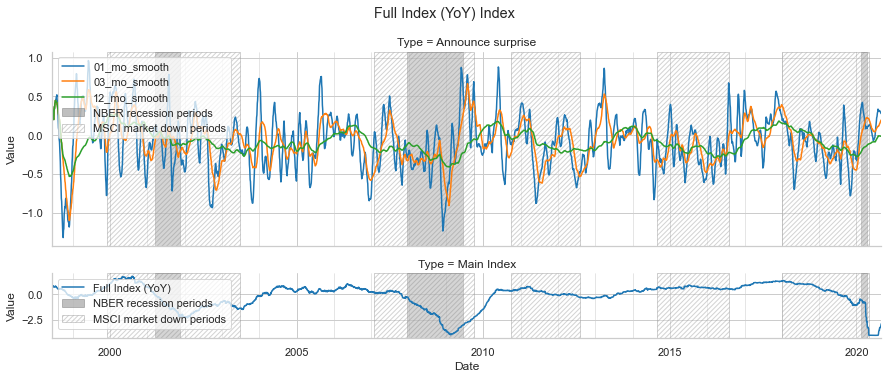

<Figure size 1080x360 with 0 Axes>

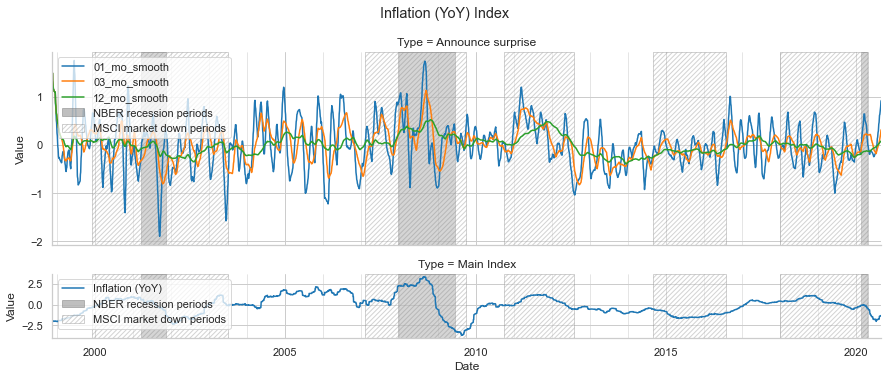

In [73]:
### RUN TO TESTING: ANNOUNCE SURPRISE INDEX VISUALIZING (MULTIPLE)

gc.collect()
### Recession periods loading:
df_nber_period = pd.read_hdf(str_path_nber_hdf, key = str_nber_periods_key)
### Market down periods loading:
df_msci_period = pd.read_hdf(str_path_msci_hdf, key = str_msci_market_down_key)  
### Global indices loading:
df_global = pd.concat([pd.read_hdf(str_path_bb_diag_hdf, key = 'global_diagonal_full_yoy'),
                       pd.read_hdf(str_path_bb_diag_hdf, key = 'global_diagonal_inf_yoy')], axis = 1)
### Factors loading:
df_surprise_full = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_announce)
#df_surprise_full = pd.concat(dict_surprise, axis = 1).sort_index(axis = 1)
int_iter_len = len(df_surprise_full.columns) // 2
### Factors iterating:
for iter_type in range(2):
    ### Forecast factor extracting:
    ser_surprise_iter = df_surprise_full.iloc[:, iter_type * int_iter_len : (iter_type + 1) * int_iter_len - 1].dropna().stack()
    ser_surprise_iter.index.names = ['Date', 'Smoothing_length']
    ser_surprise_iter.name = 'Announce surprise'
    str_index_name = ser_surprise_iter.index[0][1].partition('_')[0]
    ### Forecast factor preparing to visualization:
    df_surprise_iter = ser_surprise_iter.reset_index()
    df_surprise_iter['Smoothing_length'] = df_surprise_iter['Smoothing_length'].str.partition('_')[2]
    df_surprise_iter.columns = ['Date', 'Option', 'Value']
    ### Index extracting:
    ser_index_iter = df_global.iloc[:, iter_type].loc[ser_surprise_iter.index.levels[0]].dropna()
    str_index_name = ser_index_iter.name
    df_index_iter = ser_index_iter.reset_index()
    df_index_iter.columns = ['Date', 'Value']
    df_index_iter['Option'] = str_index_name
    ### Plot creation:
    sns.set_style('whitegrid')
    plt.figure(figsize = (15, 5))
    sns.set_context('notebook') 
    date_min = max([ser_surprise_iter.index[0][0], ser_index_iter.index[0]])
    date_max = min([ser_surprise_iter.index[-1][0], ser_index_iter.index[-1]])    
    df_to_plot = pd.concat([df_surprise_iter, df_index_iter], axis = 0, names = ['Type'], keys = [ser_surprise_iter.name, 'Main Index'], sort = False)\
                   .droplevel(1).reset_index()   
    grid_iter_surprise = sns.FacetGrid(data = df_to_plot, row = 'Type', height = 2.5, aspect = 5.0, legend_out = False, sharey = False,
                                       gridspec_kws = {'height_ratios': (3, 1)})
    fig_iter_surprise = grid_iter_surprise.map(sns.lineplot, 'Date', 'Value', 'Option')    
    fig_iter_surprise.fig.suptitle(str_index_name + ' Index', y = 1.05)    
    fig_iter_surprise.set(xlim = (date_min, date_max))
    ### Axes customizing:
    for iter_ax in fig_iter_surprise.axes.ravel():
        ### Recession periods visualizing;
        for iter_num, iter_row in enumerate(df_nber_period.itertuples()):
            iter_ax.axvspan(iter_row.Beg_Date, iter_row.End_Date, facecolor = 'gray', edgecolor = 'gray', alpha = 0.50, 
                            label = '_' * iter_num + 'NBER recession periods')
        for iter_num, iter_row in enumerate(df_msci_period.itertuples()):
            iter_ax.axvspan(iter_row.Beg_Date, iter_row.End_Date, facecolor = 'white', edgecolor = 'gray', alpha = 0.35, hatch = '/////', 
                            label = '_' * iter_num + 'MSCI market down periods')             
        ### Major ticker options:    
        iter_ax.get_xaxis().set_major_locator(mdates.YearLocator(base = 5))                             
        iter_ax.get_xaxis().set_major_formatter(mdates.DateFormatter('%Y'))       
        ### Minor ticker options:        
        iter_ax.get_xaxis().set_minor_locator(mdates.YearLocator(base = 1)) 
        iter_ax.grid(visible = True, which = 'minor', linewidth = 0.5)                    
        ### Separate legend for each ax:
        iter_ax.legend(loc = 'upper left', framealpha = 0.75)        
    ### Index factor plot drawing:
    plt.show()

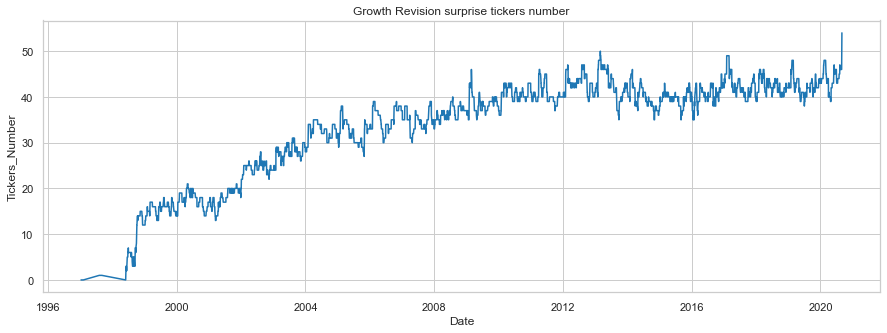

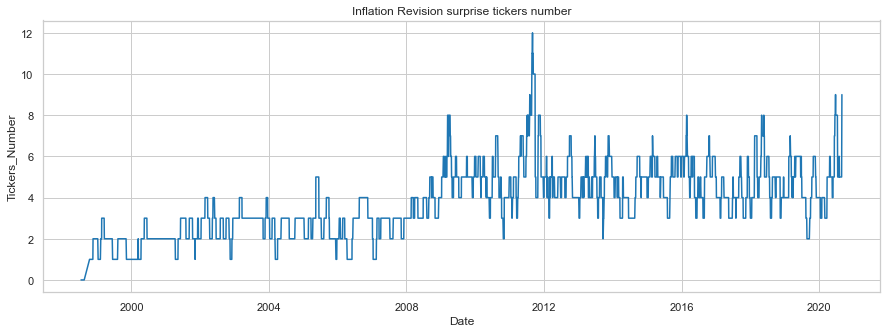

In [74]:
### RUN TO TEST: REVISION SURPRISE TICKERS NUMBER RESEARCH

### Defining index vector average calculator:
def release_date_surprise_count(df_date, int_min_tickers_to_go):
    ser_date_surprise = ((df_date['Revision_Prev'] - df_date['Release_Prev']) / df_date['Forecast_Std'])
    return ser_date_surprise.count()
### Economic surprise data loading:
df_surprise = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_weighted)
### Dropping zero stdev values:
df_surprise.loc[df_surprise['Forecast_Std'] < flo_winsorize_tolerance, 'Forecast_Std'] = np.NaN
### Data dividing:
dict_weighted = {}
dict_weighted['Growth'] = df_surprise[df_surprise['Growth'] == True]
dict_weighted['Inflation'] = df_surprise[df_surprise['Growth'] == False]
### Factors calculating:
dict_surprise = {}
for iter_key in dict_weighted:
    ser_surprise = dict_weighted[iter_key].dropna(how = 'all').groupby('Release_Date').apply(release_date_surprise_count, int_min_tickers_to_go)
    ser_surprise.index.name = 'Date'
    ser_surprise.name = 'Tickers_Number'
    ### Plot creation:
    sns.set_style('whitegrid')
    plt.figure(figsize = (15, 5))
    sns.set_context('notebook') 
    df_to_plot = ser_surprise.to_frame()
    ax_revisions = sns.lineplot(data = df_to_plot, x = 'Date', y = 'Tickers_Number')
    ax_revisions.set_title(iter_key + ' Revision surprise tickers number')
    plt.show()       


In [75]:
### RUN TO RE-EXPORT DATA: REVISION SURPRISE INDEX CONSTRUCTING (SMOOTHED)

### Defining index vector average calculator:
def release_date_surprise(df_date, int_min_tickers_to_go):
    ser_date_surprise = ((df_date['Revision_Prev'] - df_date['Release_Prev']) / df_date['Forecast_Std']).clip(list_clip[0], list_clip[1])
    if ser_date_surprise.count() >= int_min_tickers_to_go:
        flo_surprise = (ser_date_surprise * df_date['Ticker_Weight']).sum() / df_date['Ticker_Weight'].sum()
    else:
        flo_surprise = np.NaN
    return flo_surprise   
### Economic surprise data loading:
df_surprise = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_weighted)
### Dropping zero stdev values:
df_surprise.loc[df_surprise['Forecast_Std'] < flo_winsorize_tolerance, 'Forecast_Std'] = np.NaN
### Data dividing:
dict_weighted = {}
dict_weighted['Growth'] = df_surprise[df_surprise['Growth'] == True]
dict_weighted['Inflation'] = df_surprise[df_surprise['Growth'] == False]
### Factors calculating:
dict_surprise = {}
for iter_key in dict_weighted:
    ser_surprise = dict_weighted[iter_key].dropna(how = 'all').groupby('Release_Date').apply(release_date_surprise, int_min_tickers_to_go)
    ser_surprise.index.name = 'Date'
    ser_surprise = ser_surprise.reindex(pd.date_range(ser_surprise.index.min(), ser_surprise.index.max(), freq = 'B')).ffill()
    dict_surprise[iter_key + '_no_smooth'] = ser_surprise
    ### Looping over smoothing options:
    for iter_month_num in list_smooth:
        dict_surprise[iter_key + '_' + str(iter_month_num).zfill(2) + '_mo_smooth'] = \
                                                                    ser_surprise.rolling(window = int_bus_month * iter_month_num, min_periods = int_bus_min).mean()
#        break
#    break
### Factor saving:
pd.concat(dict_surprise, axis = 1).sort_index(axis = 1).to_hdf(str_path_bb_fcast_hdf, key = str_key_revision, mode = 'a')    

<Figure size 1080x360 with 0 Axes>

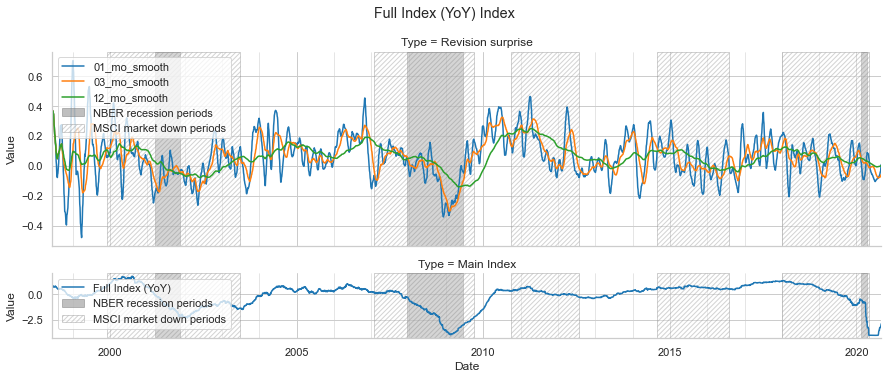

<Figure size 1080x360 with 0 Axes>

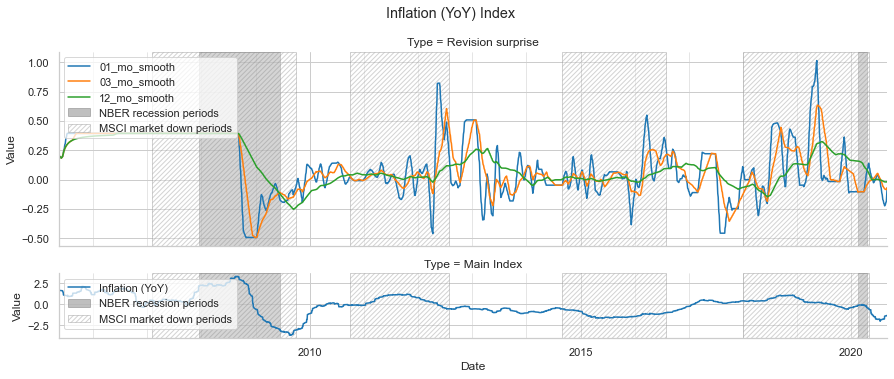

In [76]:
### RUN TO TESTING: REVISION SURPRISE INDEX VISUALIZING (MULTIPLE)

gc.collect()
### Recession periods loading:
df_nber_period = pd.read_hdf(str_path_nber_hdf, key = str_nber_periods_key)
### Market down periods loading:
df_msci_period = pd.read_hdf(str_path_msci_hdf, key = str_msci_market_down_key)  
### Global indices loading:
df_global = pd.concat([pd.read_hdf(str_path_bb_diag_hdf, key = 'global_diagonal_full_yoy'),
                       pd.read_hdf(str_path_bb_diag_hdf, key = 'global_diagonal_inf_yoy')], axis = 1)
### Factors loading:
df_revision_full = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_revision)
int_iter_len = len(df_revision_full.columns) // 2
### Factors iterating:
for iter_type in range(2):
    ### Forecast factor extracting:
    ser_revision_iter = df_revision_full.iloc[:, iter_type * int_iter_len : (iter_type + 1) * int_iter_len - 1].dropna().stack()
    ser_revision_iter.index.names = ['Date', 'Smoothing_length']
    ser_revision_iter.name = 'Revision surprise'
    str_index_name = ser_revision_iter.index[0][1].partition('_')[0]
    ### Forecast factor preparing to visualization:
    df_revision_iter = ser_revision_iter.reset_index()
    df_revision_iter['Smoothing_length'] = df_revision_iter['Smoothing_length'].str.partition('_')[2]
    df_revision_iter.columns = ['Date', 'Option', 'Value']
    ### Index extracting:
    ser_index_iter = df_global.iloc[:, iter_type].loc[ser_revision_iter.index.levels[0]].dropna()
    str_index_name = ser_index_iter.name
    df_index_iter = ser_index_iter.reset_index()
    df_index_iter.columns = ['Date', 'Value']
    df_index_iter['Option'] = str_index_name
    ### Plot creation:
    sns.set_style('whitegrid')
    plt.figure(figsize = (15, 5))
    sns.set_context('notebook') 
    date_min = max([ser_revision_iter.index[0][0], ser_index_iter.index[0]])
    date_max = min([ser_revision_iter.index[-1][0], ser_index_iter.index[-1]])    
    df_to_plot = pd.concat([df_revision_iter, df_index_iter], axis = 0, names = ['Type'], keys = [ser_revision_iter.name, 'Main Index'], sort = False)\
                   .droplevel(1).reset_index()   
    grid_iter_revision = sns.FacetGrid(data = df_to_plot, row = 'Type', height = 2.5, aspect = 5.0, legend_out = False, sharey = False,
                                       gridspec_kws = {'height_ratios': (3, 1)})
    fig_iter_revision = grid_iter_revision.map(sns.lineplot, 'Date', 'Value', 'Option')    
    fig_iter_revision.fig.suptitle(str_index_name + ' Index', y = 1.05)    
    fig_iter_revision.set(xlim = (date_min, date_max))
    ### Axes customizing:
    for iter_ax in fig_iter_revision.axes.ravel():
        ### Recession periods visualizing;
        for iter_num, iter_row in enumerate(df_nber_period.itertuples()):
            iter_ax.axvspan(iter_row.Beg_Date, iter_row.End_Date, facecolor = 'gray', edgecolor = 'gray', alpha = 0.50, 
                            label = '_' * iter_num + 'NBER recession periods')
        for iter_num, iter_row in enumerate(df_msci_period.itertuples()):
            iter_ax.axvspan(iter_row.Beg_Date, iter_row.End_Date, facecolor = 'white', edgecolor = 'gray', alpha = 0.35, hatch = '/////', 
                            label = '_' * iter_num + 'MSCI market down periods')             
        ### Major ticker options:    
        iter_ax.get_xaxis().set_major_locator(mdates.YearLocator(base = 5))                             
        iter_ax.get_xaxis().set_major_formatter(mdates.DateFormatter('%Y'))       
        ### Minor ticker options:        
        iter_ax.get_xaxis().set_minor_locator(mdates.YearLocator(base = 1)) 
        iter_ax.grid(visible = True, which = 'minor', linewidth = 0.5)                    
        ### Separate legend for each ax:
        iter_ax.legend(loc = 'upper left', framealpha = 0.75)        
    ### Index factor plot drawing:
    plt.show()

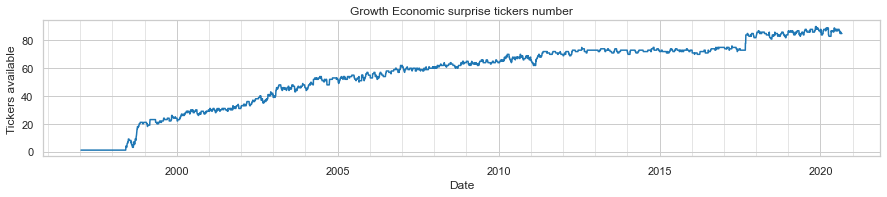

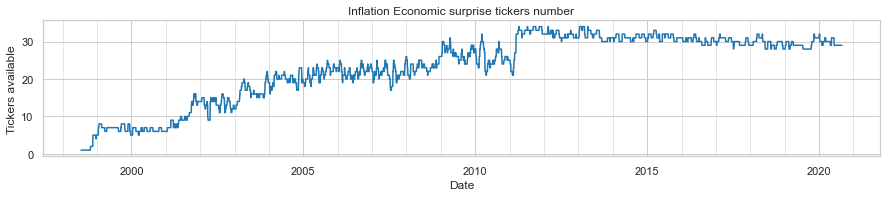

In [9]:
### RUN TO TEST: TOTAL SURPRISE TICKERS NUMBER RESEARCH

### Defining index vector average calculator:
def release_date_surprise_count(df_date, int_min_tickers_to_go):
    ser_date_announce = ((df_date['Release_Value'] - df_date['Survey_Median']) / df_date['Forecast_Std'])
    ser_date_revision = ((df_date['Revision_Prev'] - df_date['Release_Prev']) / df_date['Forecast_Std'])
    ser_date_surprise = pd.concat([ser_date_announce, ser_date_revision], axis = 1).sum(axis = 1)    
    return ser_date_surprise.count()
### Economic surprise data loading:
df_surprise = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_weighted)
### Dropping zero stdev values:
df_surprise.loc[df_surprise['Forecast_Std'] < flo_winsorize_tolerance, 'Forecast_Std'] = np.NaN
### Data dividing:
dict_weighted = {}
dict_weighted['Growth'] = df_surprise[df_surprise['Growth'] == True]
dict_weighted['Inflation'] = df_surprise[df_surprise['Growth'] == False]
### Factors calculating:
dict_surprise = {}
for iter_key in dict_weighted:
    ser_surprise = dict_weighted[iter_key].dropna(how = 'all').groupby('Release_Date').apply(release_date_surprise_count, int_min_tickers_to_go)
    ser_surprise.index.name = 'Date'
    ser_surprise.name = 'Tickers_Number'
    ### Plot creation:
    sns.set_style('whitegrid')
    plt.figure(figsize = (15, 2.5))
    sns.set_context('notebook') 
    df_to_plot = ser_surprise.to_frame()
    ax_revisions = sns.lineplot(data = df_to_plot, x = 'Date', y = 'Tickers_Number')
    ax_revisions.set_title(iter_key + ' Economic surprise tickers number')
    ax_revisions.set_ylabel('Tickers available')
    ### Major ticker options:    
    ax_revisions.get_xaxis().set_major_locator(mdates.YearLocator(base = 5))                             
    ax_revisions.get_xaxis().set_major_formatter(mdates.DateFormatter('%Y'))       
    ### Minor ticker options:        
    ax_revisions.get_xaxis().set_minor_locator(mdates.YearLocator(base = 1)) 
    ax_revisions.grid(visible = True, which = 'minor', linewidth = 0.5)         
    
    plt.show()       

In [78]:
### RUN TO RE-EXPORT DATA: TOTAL SURPRISE INDEX CONSTRUCTING (SMOOTHED)

### Defining index vector average calculator:
def release_date_surprise(df_date, int_min_tickers_to_go):
    ser_date_announce = ((df_date['Release_Value'] - df_date['Survey_Median']) / df_date['Forecast_Std'])
    ser_date_revision = ((df_date['Revision_Prev'] - df_date['Release_Prev']) / df_date['Forecast_Std'])
    ser_date_surprise = pd.concat([ser_date_announce, ser_date_revision], axis = 1).sum(axis = 1).clip(list_clip[0], list_clip[1])
    if ser_date_surprise.count() >= int_min_tickers_to_go:
        flo_surprise = (ser_date_surprise * df_date['Ticker_Weight']).sum() / df_date['Ticker_Weight'].sum()
    else:
        flo_surprise = np.NaN
    return flo_surprise   
### Economic surprise data loading:
df_surprise = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_weighted)
### Dropping zero stdev values:
df_surprise.loc[df_surprise['Forecast_Std'] < flo_winsorize_tolerance, 'Forecast_Std'] = np.NaN
### Data dividing:
dict_weighted = {}
dict_weighted['Growth'] = df_surprise[df_surprise['Growth'] == True]
dict_weighted['Inflation'] = df_surprise[df_surprise['Growth'] == False]
### Factors calculating:
dict_surprise = {}
for iter_key in dict_weighted:
    ser_surprise = dict_weighted[iter_key].dropna(how = 'all').groupby('Release_Date').apply(release_date_surprise, int_min_tickers_to_go)
    ser_surprise.index.name = 'Date'
    ser_surprise = ser_surprise.reindex(pd.date_range(ser_surprise.index.min(), ser_surprise.index.max(), freq = 'B')).ffill()
    dict_surprise[iter_key + '_no_smooth'] = ser_surprise
    ### Looping over smoothing options:
    for iter_month_num in list_smooth:
        dict_surprise[iter_key + '_' + str(iter_month_num).zfill(2) + '_mo_smooth'] = \
                                                                    ser_surprise.rolling(window = int_bus_month * iter_month_num, min_periods = int_bus_min).mean()
#        break
#    break
### Factor saving:
pd.concat(dict_surprise, axis = 1).sort_index(axis = 1).to_hdf(str_path_bb_fcast_hdf, key = str_key_total_surprise, mode = 'a')    

<Figure size 1080x360 with 0 Axes>

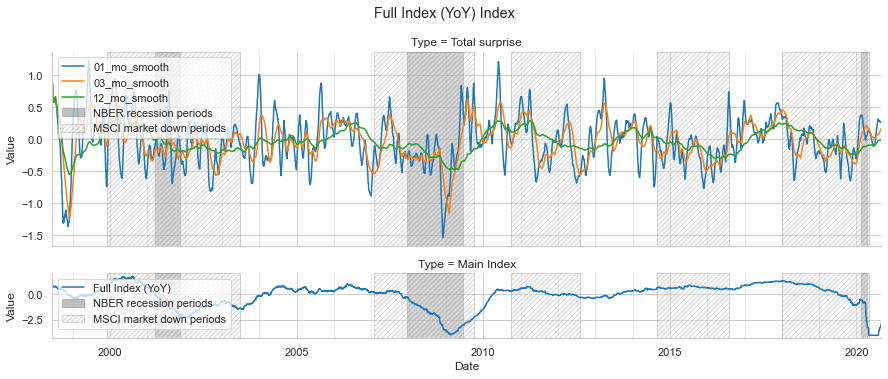

<Figure size 1080x360 with 0 Axes>

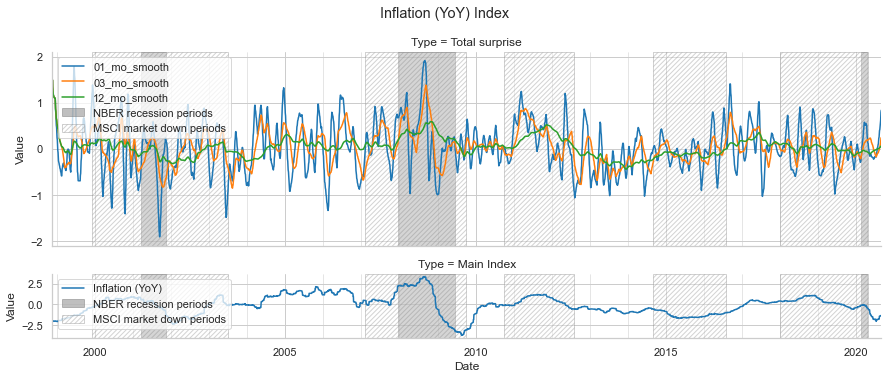

In [79]:
### RUN TO TESTING: TOTAL SURPRISE INDEX VISUALIZING (MULTIPLE)

gc.collect()
### Recession periods loading:
df_nber_period = pd.read_hdf(str_path_nber_hdf, key = str_nber_periods_key)
### Market down periods loading:
df_msci_period = pd.read_hdf(str_path_msci_hdf, key = str_msci_market_down_key)  
### Global indices loading:
df_global = pd.concat([pd.read_hdf(str_path_bb_diag_hdf, key = 'global_diagonal_full_yoy'),
                       pd.read_hdf(str_path_bb_diag_hdf, key = 'global_diagonal_inf_yoy')], axis = 1)
### Factors loading:
df_total_full = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_total_surprise)
int_iter_len = len(df_total_full.columns) // 2
### Factors iterating:
for iter_type in range(2):
    ### Forecast factor extracting:
    ser_total_iter = df_total_full.iloc[:, iter_type * int_iter_len : (iter_type + 1) * int_iter_len - 1].dropna().stack()
    ser_total_iter.index.names = ['Date', 'Smoothing_length']
    ser_total_iter.name = 'Total surprise'
    str_index_name = ser_total_iter.index[0][1].partition('_')[0]
    ### Forecast factor preparing to visualization:
    df_total_iter = ser_total_iter.reset_index()
    df_total_iter['Smoothing_length'] = df_total_iter['Smoothing_length'].str.partition('_')[2]
    df_total_iter.columns = ['Date', 'Option', 'Value']
    ### Index extracting:
    ser_index_iter = df_global.iloc[:, iter_type].loc[ser_total_iter.index.levels[0]].dropna()
    str_index_name = ser_index_iter.name
    df_index_iter = ser_index_iter.reset_index()
    df_index_iter.columns = ['Date', 'Value']
    df_index_iter['Option'] = str_index_name
    ### Plot creation:
    sns.set_style('whitegrid')
    plt.figure(figsize = (15, 5))
    sns.set_context('notebook') 
    date_min = max([ser_total_iter.index[0][0], ser_index_iter.index[0]])
    date_max = min([ser_total_iter.index[-1][0], ser_index_iter.index[-1]])    
    df_to_plot = pd.concat([df_total_iter, df_index_iter], axis = 0, names = ['Type'], keys = [ser_total_iter.name, 'Main Index'], sort = False)\
                   .droplevel(1).reset_index()   
    grid_iter_total = sns.FacetGrid(data = df_to_plot, row = 'Type', height = 2.5, aspect = 5.0, legend_out = False, sharey = False,
                                       gridspec_kws = {'height_ratios': (3, 1)})
    fig_iter_total = grid_iter_total.map(sns.lineplot, 'Date', 'Value', 'Option')    
    fig_iter_total.fig.suptitle(str_index_name + ' Index', y = 1.05)    
    fig_iter_total.set(xlim = (date_min, date_max))
    ### Axes customizing:
    for iter_ax in fig_iter_total.axes.ravel():
        ### Recession periods visualizing;
        for iter_num, iter_row in enumerate(df_nber_period.itertuples()):
            iter_ax.axvspan(iter_row.Beg_Date, iter_row.End_Date, facecolor = 'gray', edgecolor = 'gray', alpha = 0.50, 
                            label = '_' * iter_num + 'NBER recession periods')
        for iter_num, iter_row in enumerate(df_msci_period.itertuples()):
            iter_ax.axvspan(iter_row.Beg_Date, iter_row.End_Date, facecolor = 'white', edgecolor = 'gray', alpha = 0.35, hatch = '/////', 
                            label = '_' * iter_num + 'MSCI market down periods')             
        ### Major ticker options:    
        iter_ax.get_xaxis().set_major_locator(mdates.YearLocator(base = 5))                             
        iter_ax.get_xaxis().set_major_formatter(mdates.DateFormatter('%Y'))       
        ### Minor ticker options:        
        iter_ax.get_xaxis().set_minor_locator(mdates.YearLocator(base = 1)) 
        iter_ax.grid(visible = True, which = 'minor', linewidth = 0.5)                    
        ### Separate legend for each ax:
        iter_ax.legend(loc = 'upper left', framealpha = 0.75)        
    ### Index factor plot drawing:
    plt.show()

<Figure size 1080x360 with 0 Axes>

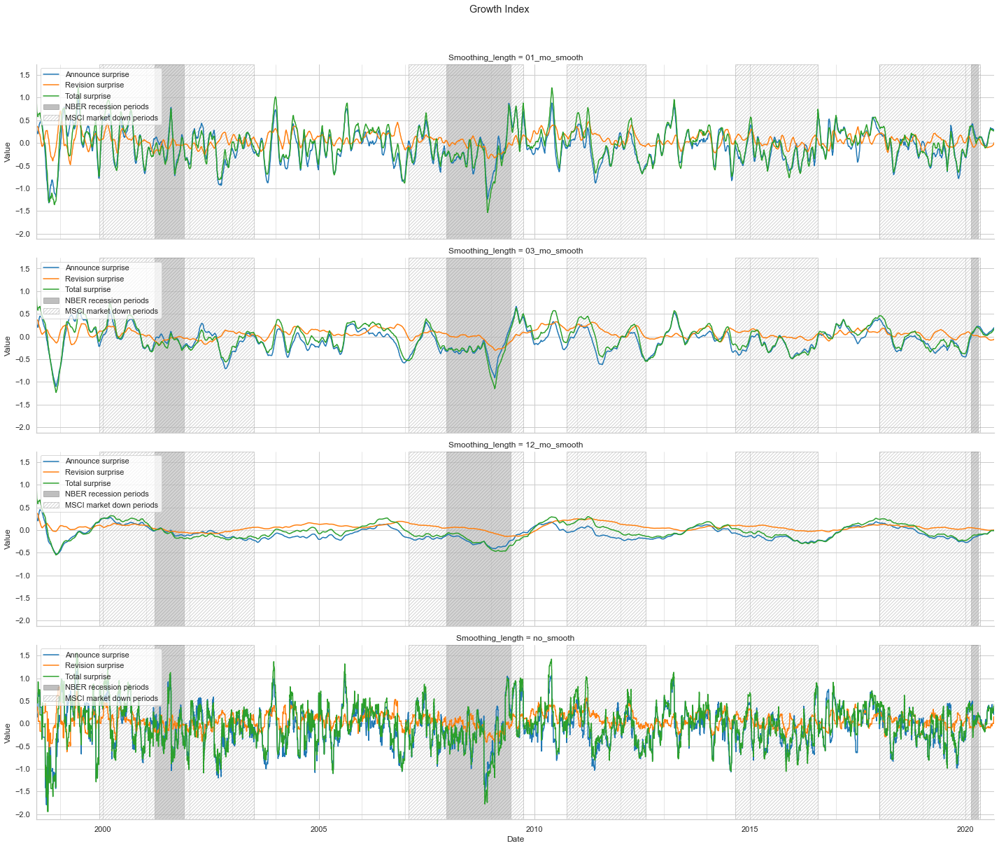

<Figure size 1080x360 with 0 Axes>

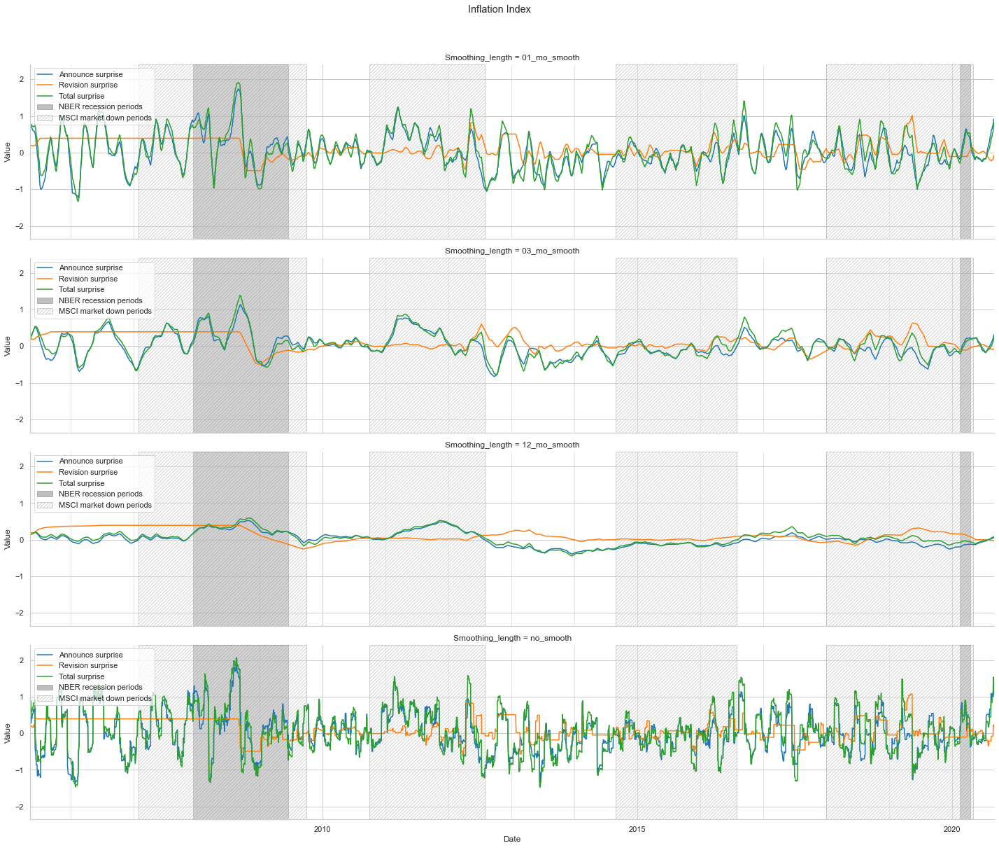

In [80]:
### RUN TO TESTING: SURPRISE INDICES COMPARISION (MULTIPLE)

gc.collect()
### Recession periods loading:
df_nber_period = pd.read_hdf(str_path_nber_hdf, key = str_nber_periods_key)
### Market down periods loading:
df_msci_period = pd.read_hdf(str_path_msci_hdf, key = str_msci_market_down_key)  
### Factors loading:
df_revision_full = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_revision)
df_announce_full = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_announce)
df_total_full = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_total_surprise)
int_iter_len = len(df_revision_full.columns) // 2
### Factors iterating:
for iter_type in range(2):
    ### Forecast factors extracting:
    ser_announce_iter = df_announce_full.iloc[:, iter_type * int_iter_len : (iter_type + 1) * int_iter_len].dropna().stack()
    ser_announce_iter.index.names = ['Date', 'Smoothing_length']
    ser_announce_iter.name = 'Announce surprise'
    ser_revision_iter = df_revision_full.iloc[:, iter_type * int_iter_len : (iter_type + 1) * int_iter_len].dropna().stack()
    ser_revision_iter.index.names = ['Date', 'Smoothing_length']
    ser_revision_iter.name = 'Revision surprise'
    ser_total_iter = df_total_full.iloc[:, iter_type * int_iter_len : (iter_type + 1) * int_iter_len].dropna().stack()
    ser_total_iter.index.names = ['Date', 'Smoothing_length']
    ser_total_iter.name = 'Total surprise'
    str_index_name = ser_announce_iter.index[0][1].partition('_')[0]     
    ### Forecast factor preparing to visualization:
    ser_forecast_iter = pd.concat([ser_announce_iter, ser_revision_iter, ser_total_iter], axis = 1).stack().sort_index()
    ser_forecast_iter.index.names = ['Date', 'Smoothing_length', 'Factor']
    ser_forecast_iter.name = 'Value'
    ### Plot creation:
    sns.set_style('whitegrid')
    plt.figure(figsize = (15, 5))
    sns.set_context('notebook') 
    date_min = max([ser_announce_iter.index[0][0], ser_revision_iter.index[0][0], ser_total_iter.index[0][0]])
    date_max = min([ser_announce_iter.index[-1][0], ser_revision_iter.index[-1][0], ser_total_iter.index[-1][0]])
    df_to_plot = ser_forecast_iter.reset_index()   
    df_to_plot['Smoothing_length'] = df_to_plot['Smoothing_length'].str.partition('_')[2]
    grid_iter_surprise = sns.FacetGrid(data = df_to_plot, row = 'Smoothing_length', height = 4.0, aspect = 5.0, legend_out = False, sharey = True)
    fig_iter_surprise = grid_iter_surprise.map(sns.lineplot, 'Date', 'Value', 'Factor', hue_order = ['Announce surprise', 'Revision surprise', 'Total surprise'])    
    fig_iter_surprise.fig.suptitle(str_index_name + ' Index', y = 1.05)    
    fig_iter_surprise.set(xlim = (date_min, date_max))
    ### Axes customizing:
    for iter_ax in fig_iter_surprise.axes.ravel():
        ### Recession periods visualizing;
        for iter_num, iter_row in enumerate(df_nber_period.itertuples()):
            iter_ax.axvspan(iter_row.Beg_Date, iter_row.End_Date, facecolor = 'gray', edgecolor = 'gray', alpha = 0.50, 
                            label = '_' * iter_num + 'NBER recession periods')
        for iter_num, iter_row in enumerate(df_msci_period.itertuples()):
            iter_ax.axvspan(iter_row.Beg_Date, iter_row.End_Date, facecolor = 'white', edgecolor = 'gray', alpha = 0.35, hatch = '/////', 
                            label = '_' * iter_num + 'MSCI market down periods')             
        ### Major ticker options:    
        iter_ax.get_xaxis().set_major_locator(mdates.YearLocator(base = 5))                             
        iter_ax.get_xaxis().set_major_formatter(mdates.DateFormatter('%Y'))       
        ### Minor ticker options:        
        iter_ax.get_xaxis().set_minor_locator(mdates.YearLocator(base = 1)) 
        iter_ax.grid(visible = True, which = 'minor', linewidth = 0.5)                    
        ### Separate legend for each ax:
        iter_ax.legend(loc = 'upper left', framealpha = 0.75)        
    ### Index factor plot drawing:
    plt.show()

In [81]:
### RUN TO TESTING: FORECAST INDICES - NBER RECESSION PERIODS STATS

### Factors loading:
df_announce = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_announce)
df_revision = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_revision)
df_total = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_total_surprise)
df_factor = pd.concat([df_announce, df_revision, df_total], axis = 1, keys = ['Economic Surprise Index', 'Revision Surprise Index', 'Total Surprise Index'])
### Recession periods loading:
df_nber_periods = pd.read_hdf(str_path_nber_hdf, str_nber_periods_key)
### Adding out-of-recession periods:
df_nber_periods['Beg_Date_shifted'] = df_nber_periods['Beg_Date'].shift(-1).fillna(datetime_end)
### Average collections:
dict_level_period_mean = {}
dict_level_not_mean = {}
dict_level_before_mean = {}
dict_level_after_mean = {}
### NBER Recession periods looping:
for iter_period in df_nber_periods.itertuples():
    iter_index = iter_period.Index
    date_beg_period = iter_period.Beg_Date
    date_end_period = iter_period.End_Date
    date_shifted = iter_period.Beg_Date_shifted
    if (max(datetime_start, df_announce.index[0]) < date_end_period):
        ### Recession periods determination:
        idx_period_iter = pd.date_range(start = date_beg_period, end = date_end_period, freq = 'B')
        idx_not_iter = pd.date_range(start = date_end_period, end = date_shifted, freq = 'B')                
        idx_before_iter = pd.date_range(start = date_beg_period - pd.DateOffset(months = 12), end = date_beg_period, freq = 'B')
        idx_after_iter = pd.date_range(start = date_end_period, end = date_end_period + pd.DateOffset(months = 12), freq = 'B')
        ### Mean values determination:
        dict_level_before_mean[iter_index] = df_factor.reindex(idx_before_iter).mean()
        dict_level_not_mean[iter_index] = df_factor.reindex(idx_not_iter).mean()                
        dict_level_period_mean[iter_index] = df_factor.reindex(idx_period_iter).mean()
        dict_level_after_mean[iter_index] = df_factor.reindex(idx_after_iter).mean()
### Average of periods mean:
ser_level_period_mean = pd.DataFrame(dict_level_period_mean).mean(axis = 1)
ser_level_period_mean.name = 'Level: During recession periods mean'
ser_level_not_mean = pd.DataFrame(dict_level_not_mean).mean(axis = 1)
ser_level_not_mean.name = 'Level: non-recession periods mean'
ser_level_before_mean = pd.DataFrame(dict_level_before_mean).mean(axis = 1)
ser_level_before_mean.name = 'Level: 12-mo before recession periods mean'
ser_level_after_mean = pd.DataFrame(dict_level_after_mean).mean(axis = 1)
ser_level_after_mean.name = 'Level: 12-mo after recession periods mean'
### Table aggregating:
df_nber_mean = pd.concat([ser_level_period_mean, ser_level_not_mean, ser_level_before_mean, ser_level_after_mean], axis = 1).transpose()
df_nber_mean.name = 'NBER Recession periods stats'
#print(df_nber_mean.name, ':')
#display(df_nber_mean)
#df_nber_mean.to_excel('Data_Files/Test_Files/Some_Stats.xlsx', merge_cells = False)

In [82]:
### RUN TO TESTING: FORECAST INDICES - MSCI MARKET DOWN PERIODS STATS

df_announce = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_announce)
df_revision = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_revision)
df_total = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_total_surprise)
df_factor = pd.concat([df_announce, df_revision, df_total], axis = 1, keys = ['Economic Surprise Index', 'Revision Surprise Index', 'Total Surprise Index'])
### Recession periods loading:
df_msci_periods = pd.read_hdf(str_path_msci_hdf, str_msci_market_down_key)
### Adding out-of-recession periods:
df_msci_periods['Beg_Date_shifted'] = df_msci_periods['Beg_Date'].shift(-1).fillna(datetime_end)
### Average collections:
dict_level_period_mean = {}
dict_level_not_mean = {}
dict_level_before_mean = {}
dict_level_after_mean = {}
### NBER Recession periods looping:
for iter_period in df_msci_periods.itertuples():
    iter_index = iter_period.Index
    date_beg_period = iter_period.Beg_Date
    date_end_period = iter_period.End_Date
    date_shifted = iter_period.Beg_Date_shifted
    if (max(datetime_start, df_announce.index[0]) < date_end_period):
        ### Recession periods determination:
        idx_period_iter = pd.date_range(start = date_beg_period, end = date_end_period, freq = 'B')
        idx_not_iter = pd.date_range(start = date_end_period, end = date_shifted, freq = 'B')                
        idx_before_iter = pd.date_range(start = date_beg_period - pd.DateOffset(months = 12), end = date_beg_period, freq = 'B')
        idx_after_iter = pd.date_range(start = date_end_period, end = date_end_period + pd.DateOffset(months = 12), freq = 'B')
        ### Mean values determination:
        dict_level_before_mean[iter_index] = df_factor.reindex(idx_before_iter).mean()
        dict_level_not_mean[iter_index] = df_factor.reindex(idx_not_iter).mean()                
        dict_level_period_mean[iter_index] = df_factor.reindex(idx_period_iter).mean()
        dict_level_after_mean[iter_index] = df_factor.reindex(idx_after_iter).mean()
### Average of periods mean:
ser_level_period_mean = pd.DataFrame(dict_level_period_mean).mean(axis = 1)
ser_level_period_mean.name = 'Level: During recession periods mean'
ser_level_not_mean = pd.DataFrame(dict_level_not_mean).mean(axis = 1)
ser_level_not_mean.name = 'Level: non-recession periods mean'
ser_level_before_mean = pd.DataFrame(dict_level_before_mean).mean(axis = 1)
ser_level_before_mean.name = 'Level: 12-mo before recession periods mean'
ser_level_after_mean = pd.DataFrame(dict_level_after_mean).mean(axis = 1)
ser_level_after_mean.name = 'Level: 12-mo after recession periods mean'
### Table aggregating:
df_msci_mean = pd.concat([ser_level_period_mean, ser_level_not_mean, ser_level_before_mean, ser_level_after_mean], axis = 1).transpose()
df_msci_mean.name = 'MSCI Market Down periods stats'
#print(df_msci_mean.name, ':')
#display(df_msci_mean)
#df_msci_mean.to_excel('Data_Files/Test_Files/Some_Stats.xlsx', merge_cells = False)

In [83]:
### RUN TO TESTING: SURPRISE FACTORS COMPARING

### Alternative results loading:
df_announce = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_announce)
df_revision = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_revision)
df_total = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_total_surprise)
### Column-wise correlation performing:
for iter_smooth in range(4):
    print(df_announce.columns[iter_smooth], ':\n') 
    display(pd.concat([df_announce[df_announce.columns[iter_smooth]], df_revision[df_revision.columns[iter_smooth]], df_total[df_total.columns[iter_smooth]]], 
                       axis = 1, keys = ['Announcement Surprise', 'Revision Surprise', 'Total Surprise']).corr())

Growth_01_mo_smooth :



,Announcement Surprise,Revision Surprise,Total Surprise
Announcement Surprise,1.000000,0.194942,0.942931
Revision Surprise,0.194942,1.000000,0.488353
Total Surprise,0.942931,0.488353,1.000000


Growth_03_mo_smooth :



,Announcement Surprise,Revision Surprise,Total Surprise
Announcement Surprise,1.000000,0.239331,0.940513
Revision Surprise,0.239331,1.000000,0.536264
Total Surprise,0.940513,0.536264,1.000000


Growth_12_mo_smooth :



,Announcement Surprise,Revision Surprise,Total Surprise
Announcement Surprise,1.000000,0.344866,0.921023
Revision Surprise,0.344866,1.000000,0.665998
Total Surprise,0.921023,0.665998,1.000000


Growth_no_smooth :



,Announcement Surprise,Revision Surprise,Total Surprise
Announcement Surprise,1.000000,0.168883,0.945412
Revision Surprise,0.168883,1.000000,0.457229
Total Surprise,0.945412,0.457229,1.000000


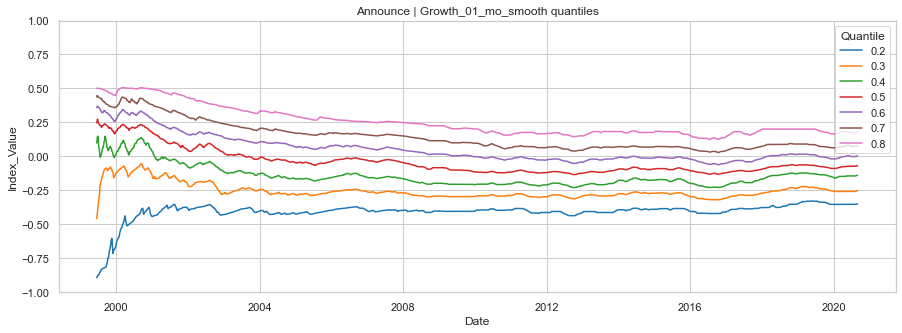

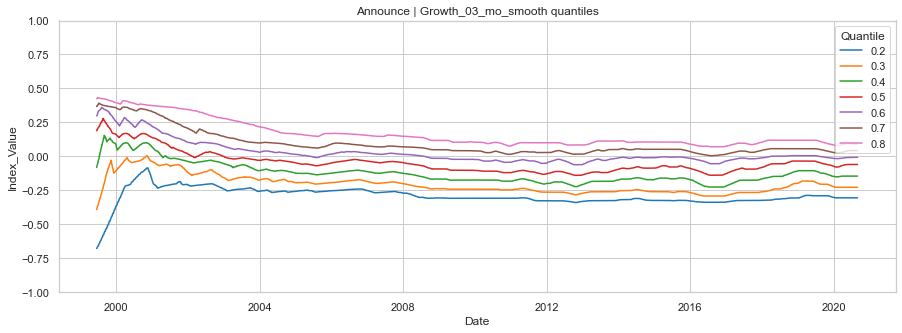

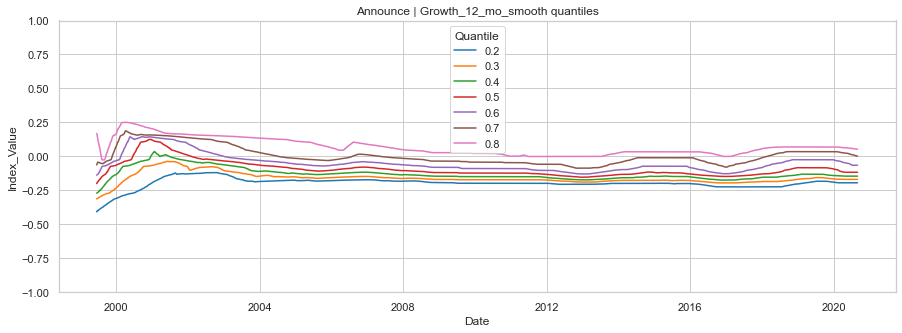

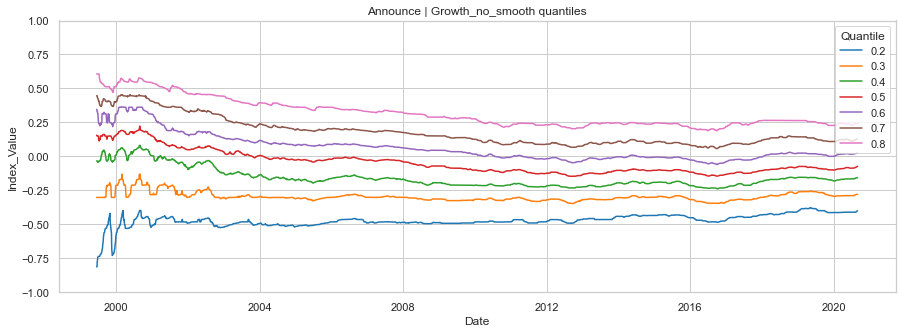

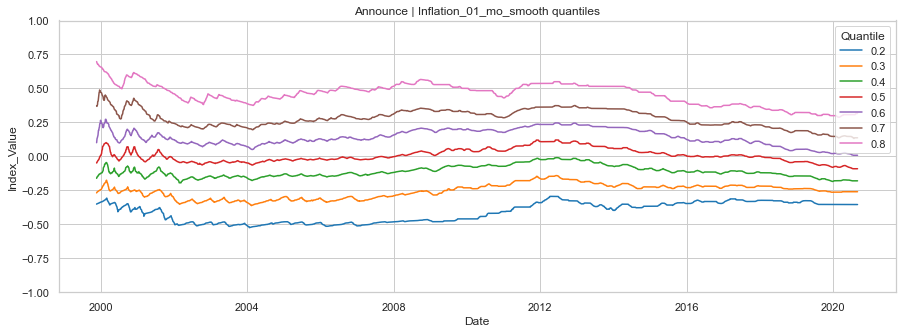

...

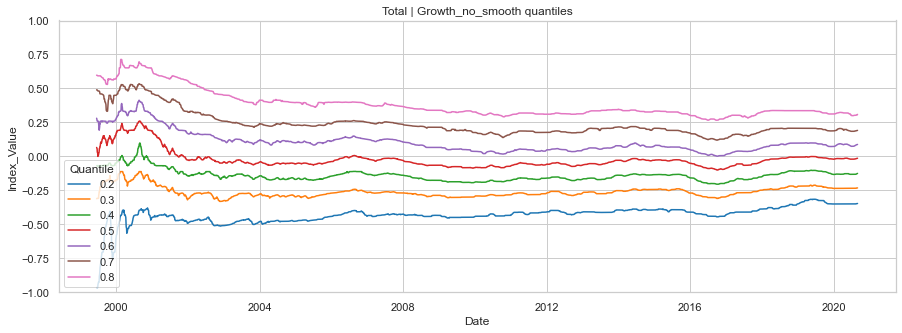

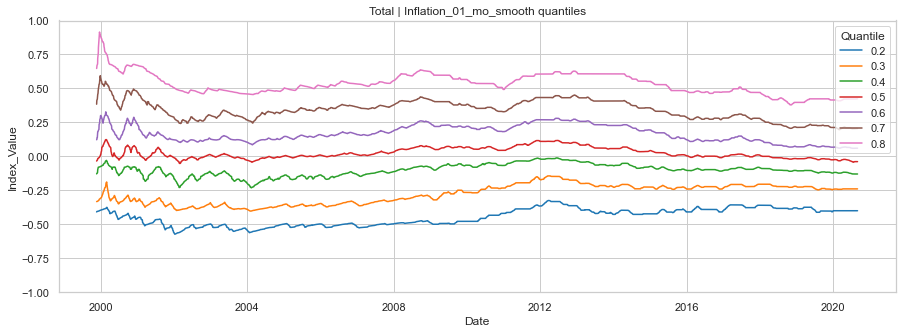

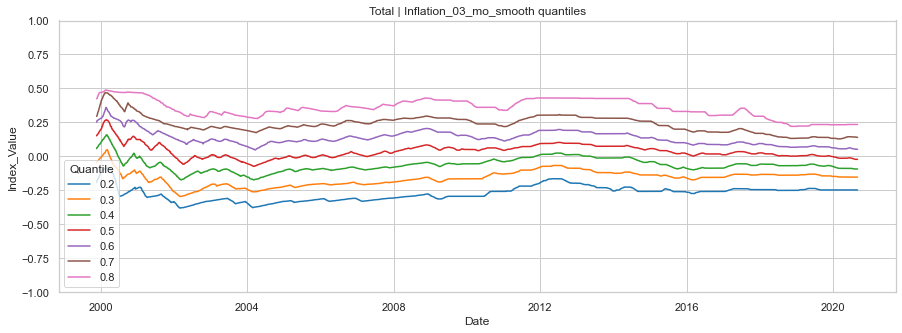

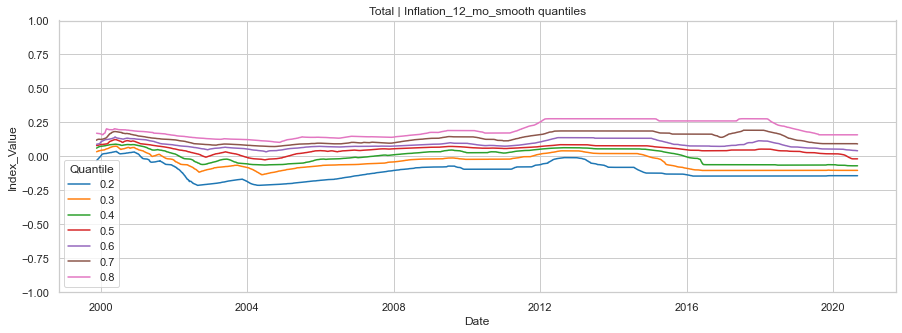

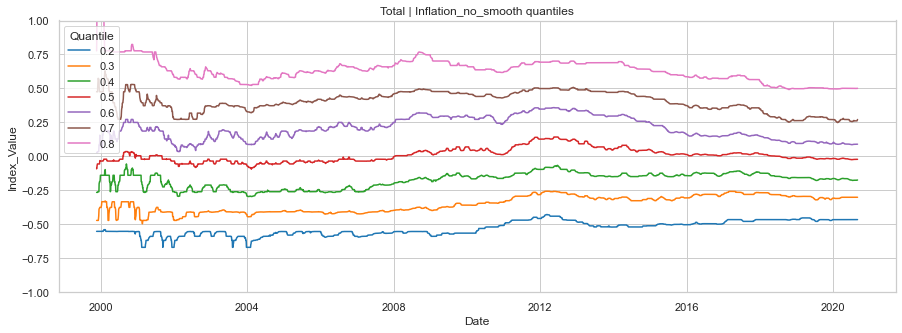

In [84]:
### RUN TO TEST: QUANTILES DRAWING

### Surprise indices loading:
dict_surprise = {}
dict_surprise['Announce'] = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_announce)
dict_surprise['Revision'] = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_revision)
dict_surprise['Total'] = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_total_surprise)
### Looping over Surprise calculation ways:
for iter_surprise in dict_surprise:
    dict_iter_ptile = {}
    ### Looping over smoothing types:
    for iter_forecast in dict_surprise[iter_surprise].columns:
        ser_test_idx = dict_surprise[iter_surprise][iter_forecast]
        dict_quantile = {}
        for iter_quantile in [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]:
            gc.collect()
            dict_quantile[str(iter_quantile)] = ser_test_idx.rolling(int_ptile_months_win * int_bus_month, min_periods = int_ptile_months_min * int_bus_month)\
                                                            .apply(lambda ser_win: ser_win.quantile(iter_quantile), raw = False)
        ser_quantile = pd.concat(dict_quantile, axis = 0)
        df_quantile = ser_quantile.reset_index()
        df_quantile.columns = ['Quantile', 'Date', 'Index_Value']
        ### Plot creation:
        sns.set_style('whitegrid')
        plt.figure(figsize = (15, 5))
        sns.set_context('notebook') 
        ax_quantiles = sns.lineplot(data = df_quantile, x = 'Date', y = 'Index_Value', hue = 'Quantile')
        ax_quantiles.set_title(iter_surprise + ' | ' + iter_forecast + ' quantiles')
        ax_quantiles.set_ylim((-1.0, 1.0))
        plt.show()

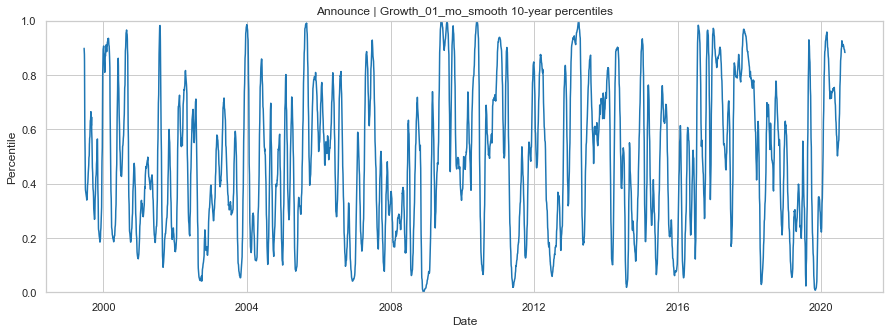

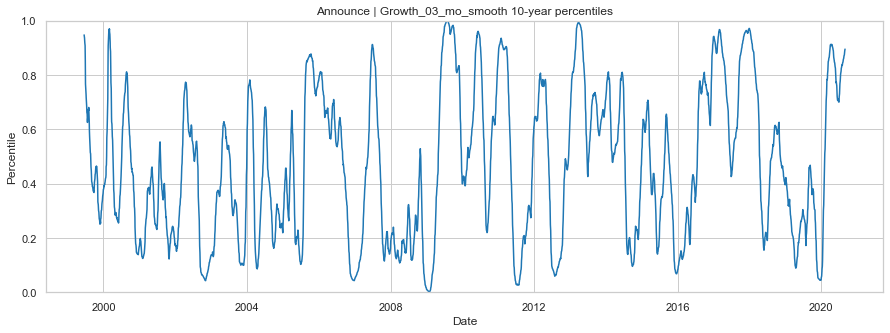

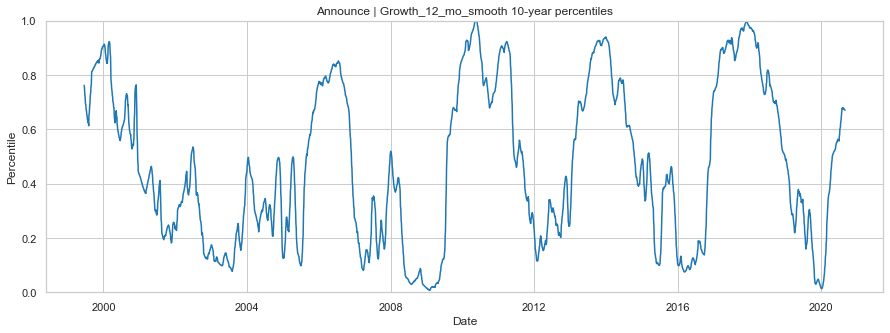

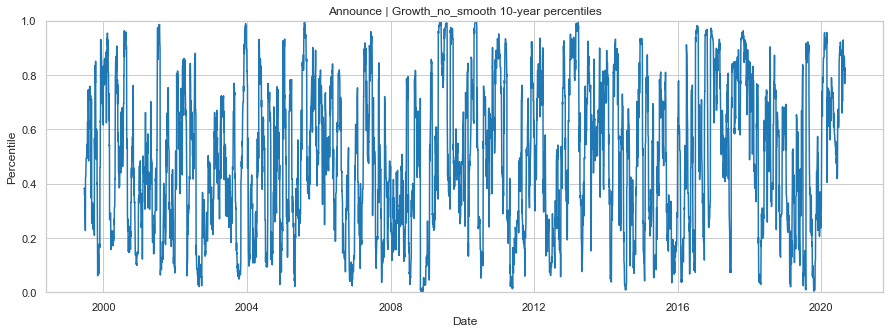

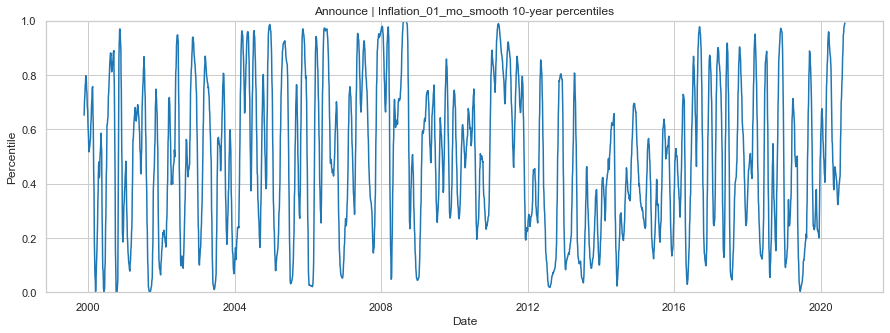

...

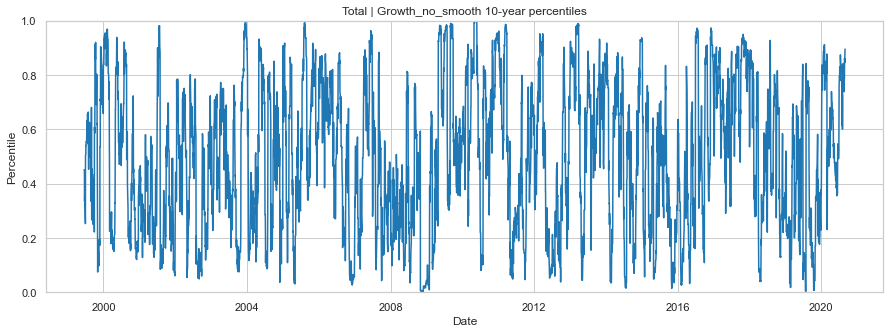

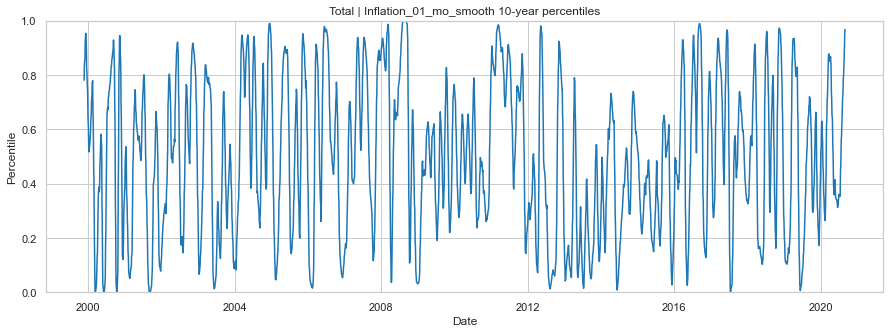

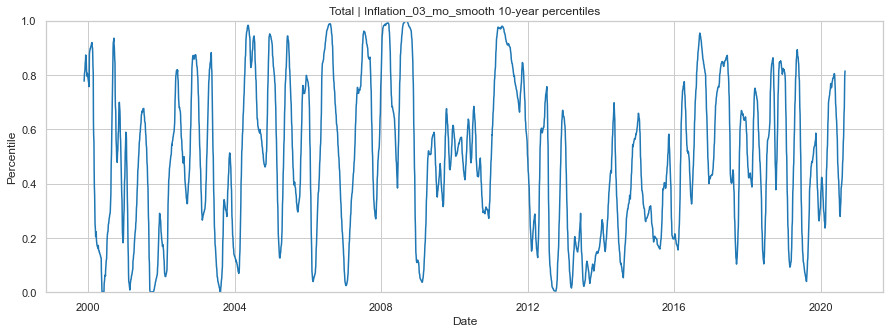

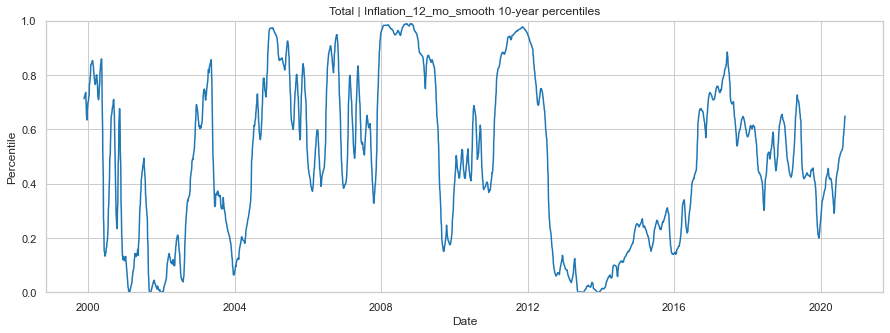

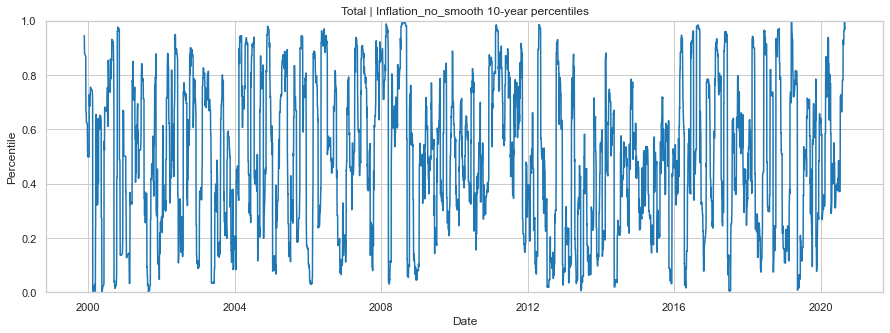

In [85]:
### RUN TO RE-EXPORT DATA: LEVEL PERCENTILE CONSTRUCTING

gc.collect()
### Defining percentiles generator:
def take_level_ptile(ser_date):
    ### Check for empty vector (doing nothing):
    if (ser_date.count() > 0):
        ### Level percentile calculation:
        flo_level_ptile = ser_date.rank(method = 'average', na_option = 'keep', ascending = True, pct = True).iloc[-1]
        ### Results output:
        return flo_level_ptile
    else:
        ### Results output:        
        return np.NaN
### Surprise indices loading:
dict_surprise = {}
dict_surprise['Announce'] = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_announce)
dict_surprise['Revision'] = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_revision)
dict_surprise['Total'] = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_total_surprise)
### Looping over surprise indices:    
dict_idx_ptile = {}
for iter_surprise in dict_surprise:
    dict_iter_ptile = {}
    ### Looping over smoothing types:        
    for iter_forecast in dict_surprise[iter_surprise].columns:
        dict_iter_ptile[iter_forecast] = dict_surprise[iter_surprise][iter_forecast]\
                                                            .rolling(int_ptile_months_win * int_bus_month, min_periods = int_ptile_months_min * int_bus_month)\
                                                            .apply(take_level_ptile, raw = False) 
        ### Plot data preparation:
        df_to_plot = dict_iter_ptile[iter_forecast].reset_index()
        df_to_plot.columns = ['Date', 'Percentile']
        ### Plot creation:
        sns.set_style('whitegrid')
        plt.figure(figsize = (15, 5))
        sns.set_context('notebook') 
        ax_ptiles = sns.lineplot(data = df_to_plot, x = 'Date', y = 'Percentile')
        ax_ptiles.set_title(iter_surprise + ' | ' + iter_forecast + ' 10-year percentiles')
        ax_ptiles.set_ylim((0.0, 1.0))
        plt.show()
#        break
    ### Percentiles saving:
    dict_idx_ptile[iter_surprise] = pd.concat(dict_iter_ptile, axis = 1)
#    break

Announce | Growth_01_mo_smooth


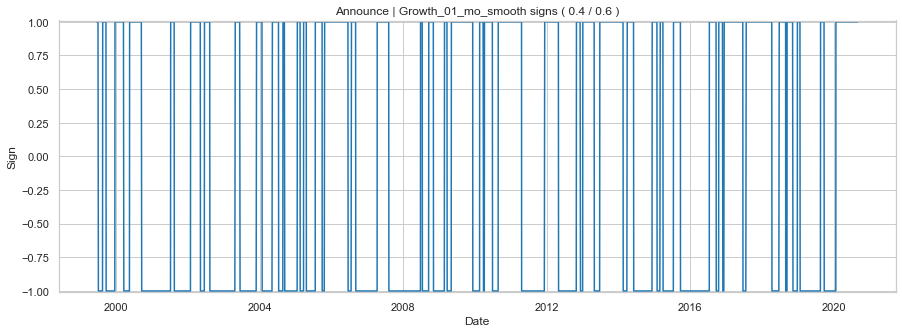

Announce | Growth_03_mo_smooth


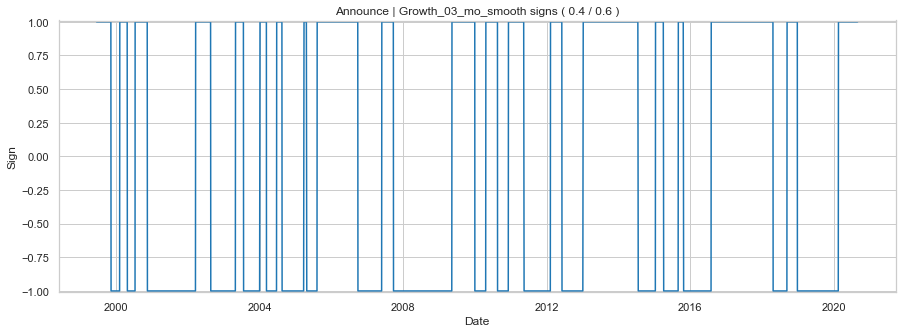

Announce | Growth_12_mo_smooth


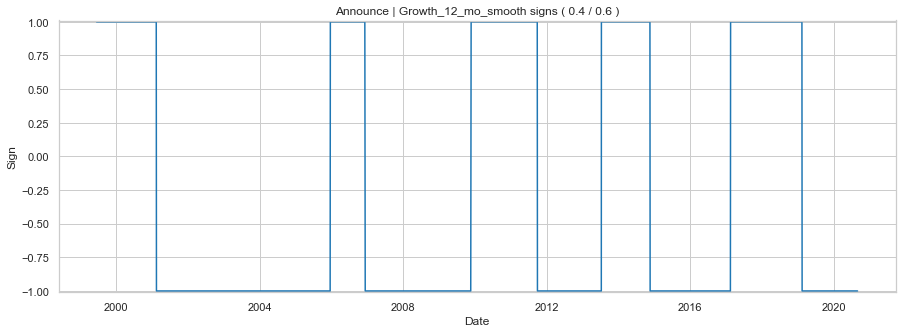

Announce | Growth_no_smooth


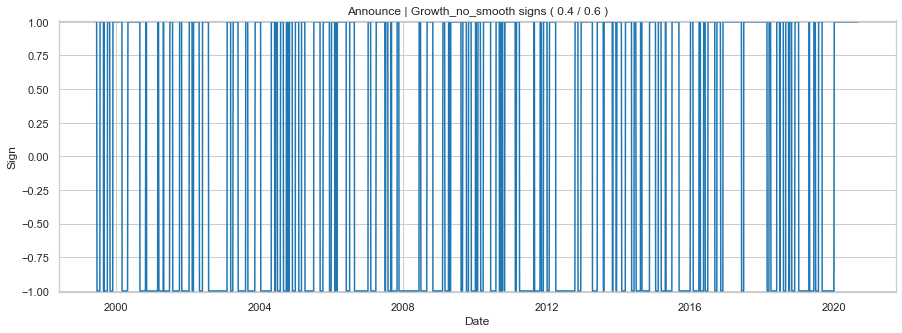

Announce | Inflation_01_mo_smooth


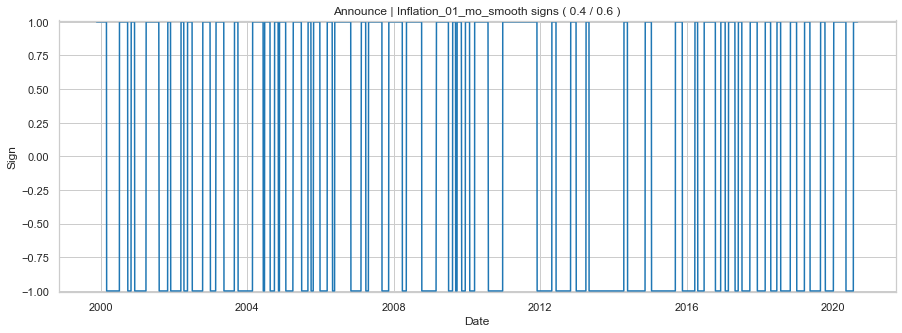

Announce | Inflation_03_mo_smooth


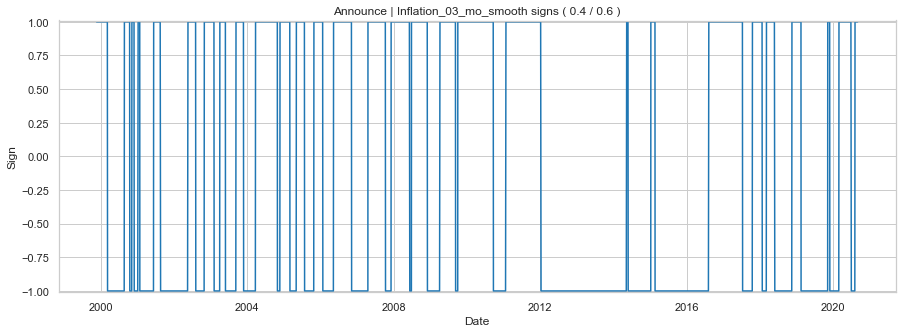

Announce | Inflation_12_mo_smooth


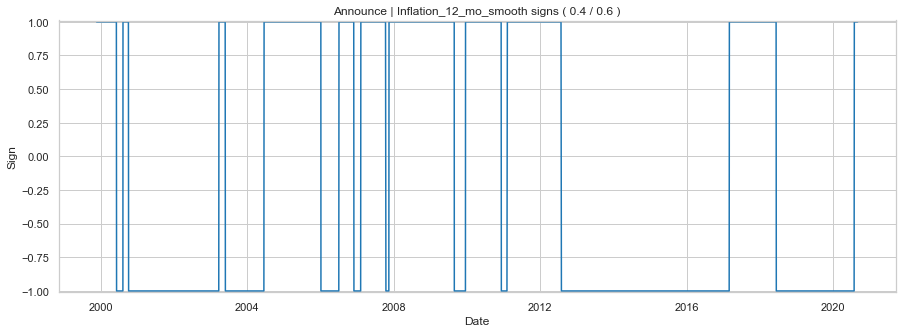

Announce | Inflation_no_smooth


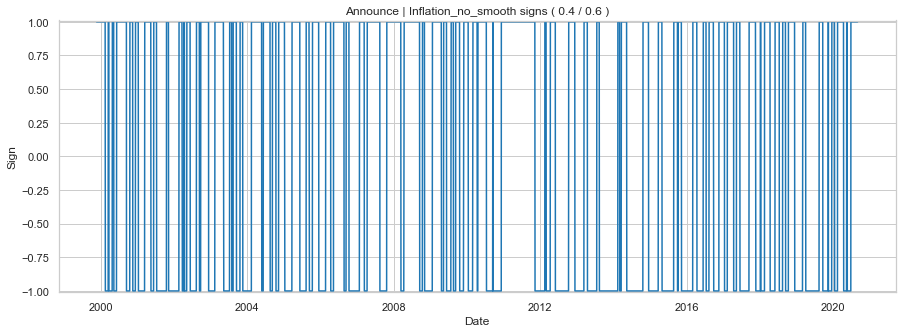

Revision | Growth_01_mo_smooth


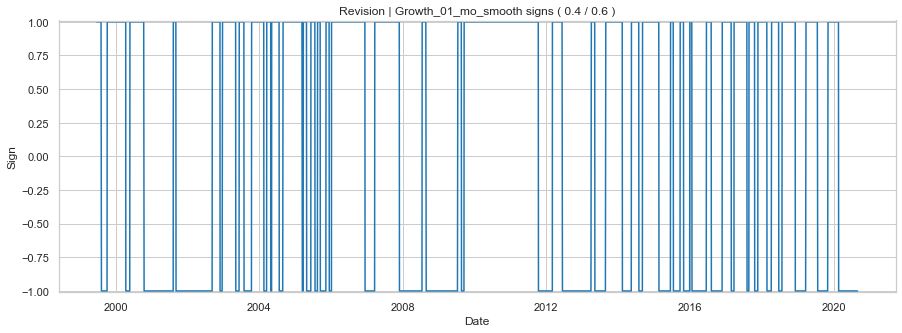

Revision | Growth_03_mo_smooth


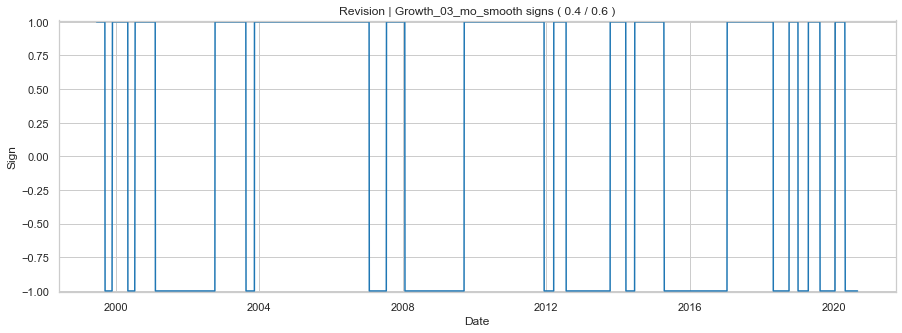

Revision | Growth_12_mo_smooth


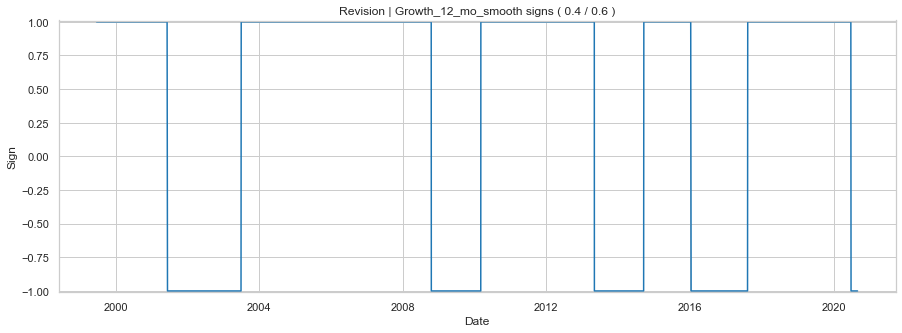

Revision | Growth_no_smooth


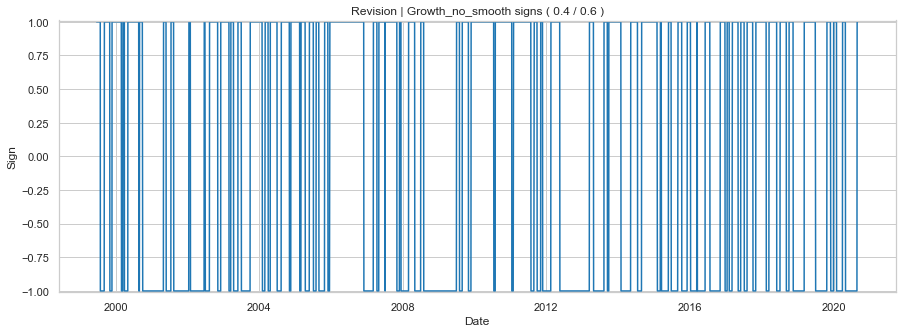

Revision | Inflation_01_mo_smooth


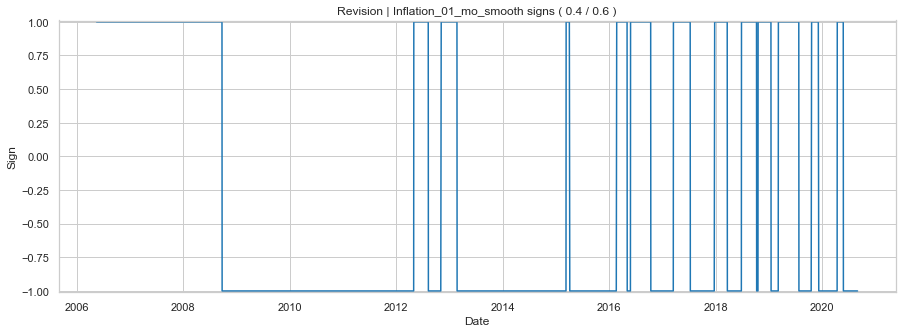

Revision | Inflation_03_mo_smooth


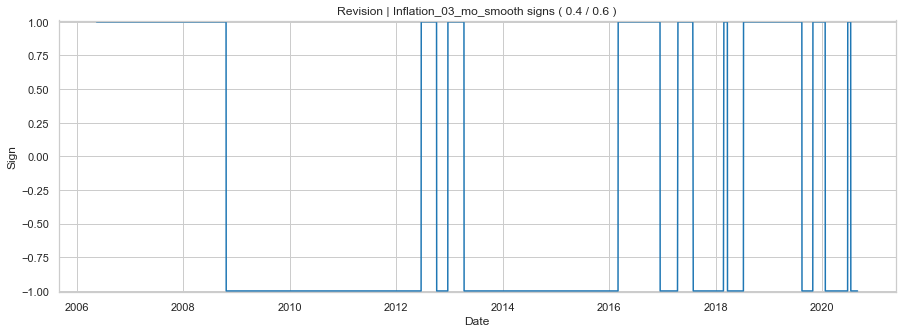

Revision | Inflation_12_mo_smooth


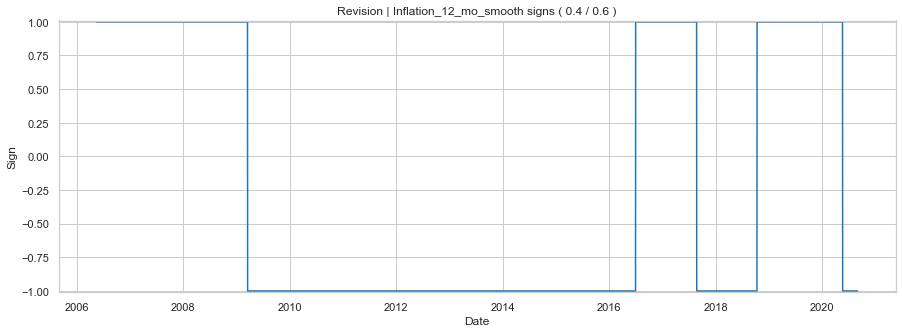

Revision | Inflation_no_smooth


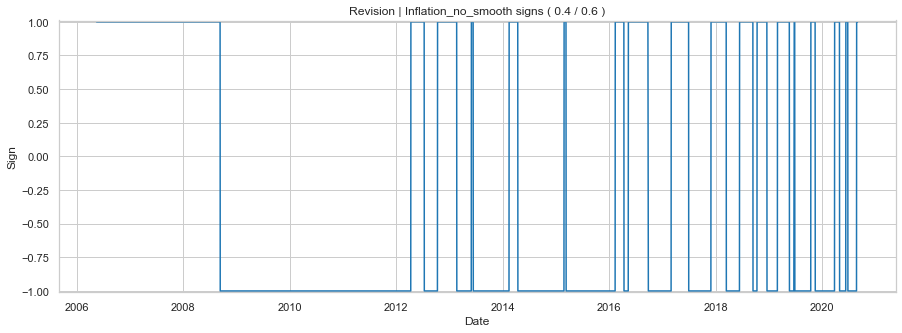

Total | Growth_01_mo_smooth


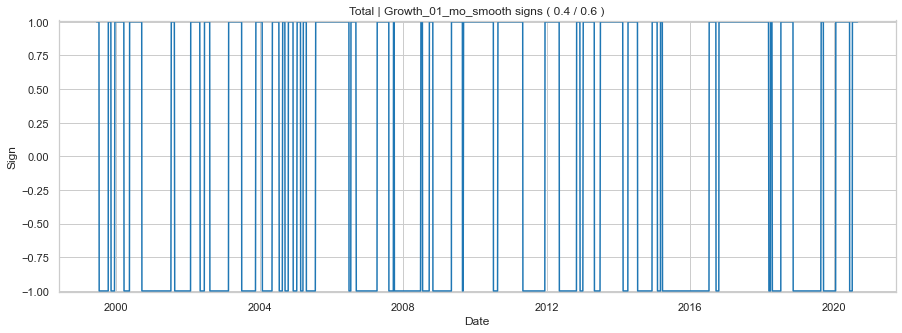

Total | Growth_03_mo_smooth


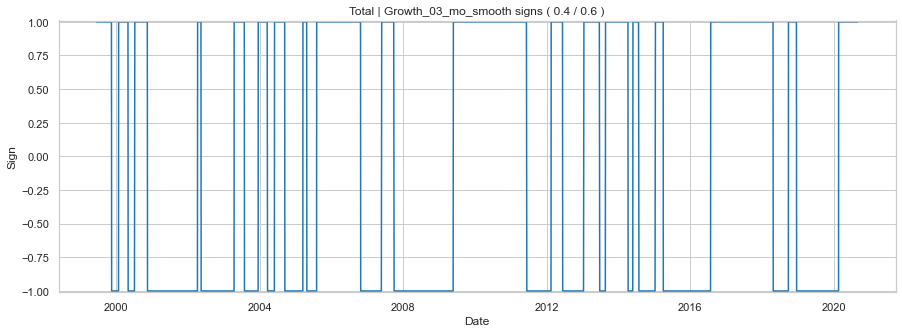

Total | Growth_12_mo_smooth


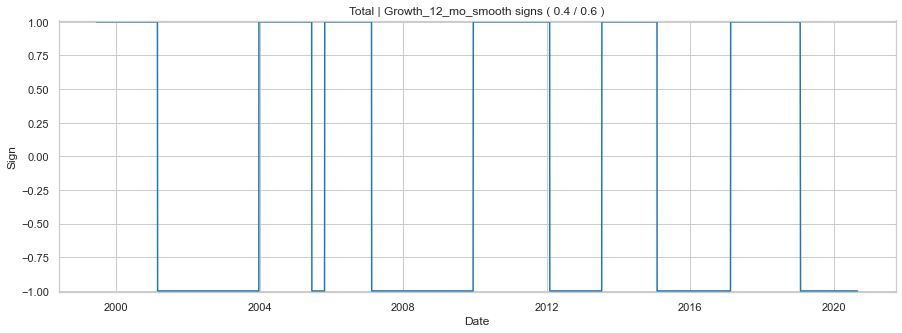

Total | Growth_no_smooth


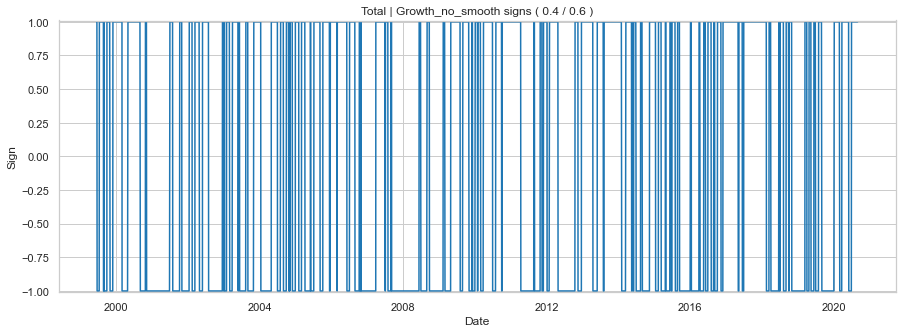

Total | Inflation_01_mo_smooth


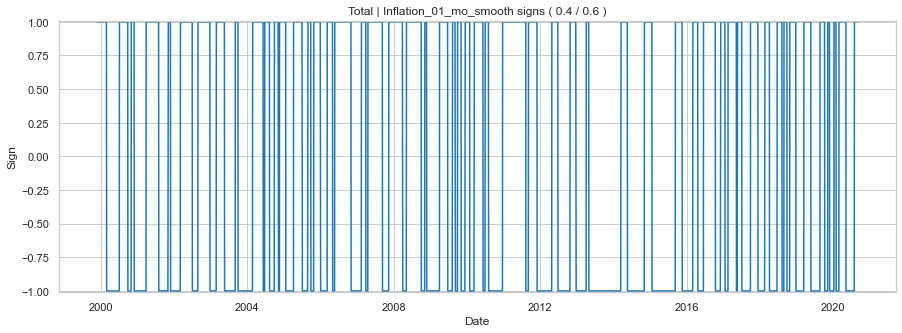

Total | Inflation_03_mo_smooth


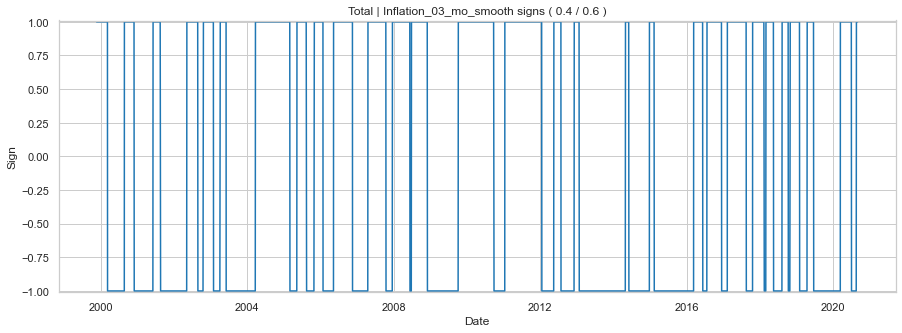

Total | Inflation_12_mo_smooth


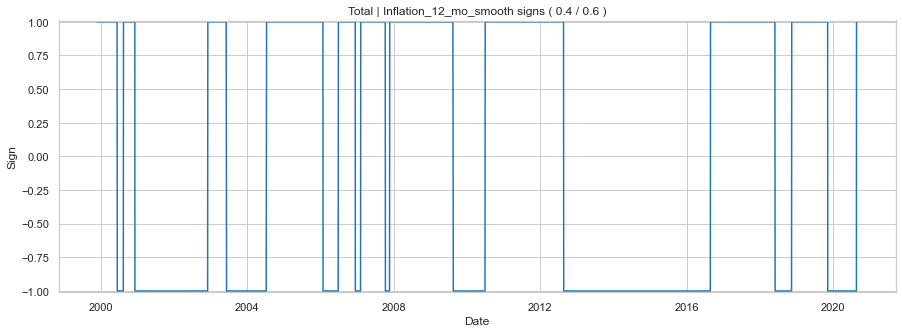

Total | Inflation_no_smooth


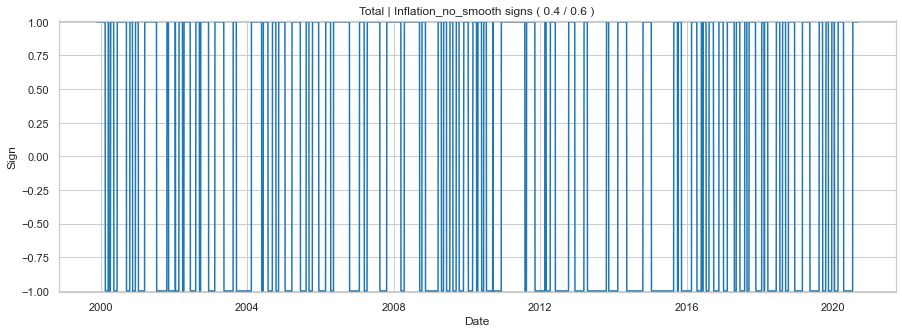

In [86]:
### RUN TO RE-EXPORT DATA: LEVEL SIGNS CONSTRUCTING

### Looping over surprise indices:
dict_idx_sign = {}
for iter_surprise in dict_idx_ptile:
    ### Looping over smoothing types:
    dict_iter_sign = {}
    for iter_forecast in dict_idx_ptile[iter_surprise].columns:
        print(iter_surprise, '|', iter_forecast)
        ser_iter_ptile = dict_idx_ptile[iter_surprise][iter_forecast]
        ser_iter_ptile = ser_iter_ptile[ser_iter_ptile.first_valid_index() : ]
        ser_iter_idx = dict_surprise[iter_surprise][iter_forecast].reindex(ser_iter_ptile.index)
        ser_iter_sign = pd.Series(np.NaN, ser_iter_ptile.index)
        ser_iter_sign.iloc[0] = 1
        for iter_prev_num, iter_prev_date in enumerate(ser_iter_sign.index[: -1]):
            iter_this_num = iter_prev_num + 1
            if (ser_iter_sign[iter_prev_num] == 1):
                if ((ser_iter_idx[iter_this_num] < 0.0) & (ser_iter_ptile[iter_this_num] <= tumbler_to_minus)):
                    ser_iter_sign[iter_this_num] = -1
                else:
                    ser_iter_sign[iter_this_num] = 1
            else:
                if ((ser_iter_idx[iter_this_num] > 0.0) & (ser_iter_ptile[iter_this_num] >= tumbler_to_plus)):
                    ser_iter_sign[iter_this_num] = 1
                else:
                    ser_iter_sign[iter_this_num] = -1
        dict_iter_sign[iter_forecast] = ser_iter_sign
        ### Plot creation:
        sns.set_style('whitegrid')
        plt.figure(figsize = (15, 5))
        sns.set_context('notebook') 
        df_to_plot = ser_iter_sign.reset_index()
        df_to_plot.columns = ['Date', 'Sign']
        ax_quantiles = sns.lineplot(data = df_to_plot, x = 'Date', y = 'Sign')
        ax_quantiles.set_title(iter_surprise + ' | ' + iter_forecast + ' signs ( ' + str(tumbler_to_minus) + ' / ' + str(tumbler_to_plus) + ' )')
        ax_quantiles.set_ylim((-1.01, 1.01))
        plt.show()       
#        break
    dict_idx_sign[iter_surprise] = pd.concat(dict_iter_sign, axis = 1)        
#    break
### Signs saving:
pd.concat(dict_idx_sign).to_hdf(str_path_bb_fcast_hdf, key = str_key_signs, mode = 'a')

In [87]:
### RUN TO TEST: SIGNS BIAS RESEARCH

df_signs = pd.read_hdf(str_path_bb_fcast_hdf, key = str_key_signs)
print('Observations number:\n', df_signs.count())
print('Signs sum:\n', df_signs.sum())
print('Bias :\n', df_signs.sum() / df_signs.count())

Observations number:
 Growth_01_mo_smooth       16594
Growth_03_mo_smooth       16594
Growth_12_mo_smooth       16594
Growth_no_smooth          16594
Inflation_01_mo_smooth    14571
Inflation_03_mo_smooth    14571
Inflation_12_mo_smooth    14571
Inflation_no_smooth       14571
dtype: int64
Signs sum:
 Growth_01_mo_smooth       -174.0
Growth_03_mo_smooth       -230.0
Growth_12_mo_smooth        394.0
Growth_no_smooth          -116.0
Inflation_01_mo_smooth   -1439.0
Inflation_03_mo_smooth   -1483.0
Inflation_12_mo_smooth   -1291.0
Inflation_no_smooth      -1249.0
dtype: float64
Bias :
 Growth_01_mo_smooth      -0.010486
Growth_03_mo_smooth      -0.013860
Growth_12_mo_smooth       0.023744
Growth_no_smooth         -0.006990
Inflation_01_mo_smooth   -0.098758
Inflation_03_mo_smooth   -0.101778
Inflation_12_mo_smooth   -0.088601
Inflation_no_smooth      -0.085718
dtype: float64
